In [1]:
import os
import sys
import json
from collections import Counter
import time
import math
import matplotlib.pyplot as plt 
from tweepy import Cursor
import tweepy
from tweepy import OAuthHandler
import datetime
import mtranslate
import itertools
import collections
import csv
import networkx as nx
from nltk import ngrams, FreqDist
from operator import itemgetter
from wordcloud import WordCloud, STOPWORDS

# Sensodyne(Cleaning)

In [2]:
#collecting text from comments and retweets file.
fname = "data/sensodyne/comments/comments.csv"

comments_text=[]
comment_ = []

with open(fname,'r',encoding="utf8") as file:
    comments = csv.reader(file)
    for comment in comments:
        if(comment[4] == "text"):
            continue
        else:
            comment_ = []
            comment_.append(comment[4])
            comments_text.append(comment_)
print(comments_text)
        
    
        

[['Hi Thankyou. The website says whitening repair and protect contains SLS. But the packaging in Uk doesn’t mention SLS. Is this an error on the packaging?'], ['@Sensodyne_US What is up with your rapid relief toothpaste? People, unless you want a layer of sensitive skin on your gums and inside your mouth burned off, I do not recommend this product!!!'], ['NSFW!'], ['Does sensodyne also work as a numbing agent'], ['On sale now at Amazon special 3 pack https://amzn.to/2PVzxoq'], ['Damn that water looks good!!'], ['Do you smoke weed?'], ['Sis.. you gone call? '], ['p-penis..???'], ["Sensodyne is the Mercedes Benz of toothpaste but there's nothing on the market that will whiten your teeth."], ['This girl’s features esp hair and skin tho. '], ['@Sensodyne_US: I hate your TV advert featuring inarticulate, dippy women playing dentists that we no longer buy your product. Unlike your competitors, you look like a co. obsessed w/humiliating women and disgusting the public.'], ['@Sensodyne_US than

In [3]:
#Storing text of comments in csv
import pandas as pd

df1 = pd.DataFrame(comments_text)

path1 = "data/sensodyne/comments/comments_text.csv"
df1.to_csv(path1, header=False, index=False, index_label=None)


In [4]:
#reading the tex from saved file
path1 = "data/sensodyne/comments/comments_text.csv"
count = 0
with open(path1,'r',encoding="utf8") as file:
    texts = csv.reader(file)
    for text in texts:
        count = count + 1
        print(text)
print(count)
    

['Hi Thankyou. The website says whitening repair and protect contains SLS. But the packaging in Uk doesn’t mention SLS. Is this an error on the packaging?']
['@Sensodyne_US What is up with your rapid relief toothpaste? People, unless you want a layer of sensitive skin on your gums and inside your mouth burned off, I do not recommend this product!!!']
['NSFW!']
['Does sensodyne also work as a numbing agent']
['On sale now at Amazon special 3 pack https://amzn.to/2PVzxoq']
['Damn that water looks good!!']
['Do you smoke weed?']
['Sis.. you gone call? ']
['p-penis..???']
["Sensodyne is the Mercedes Benz of toothpaste but there's nothing on the market that will whiten your teeth."]
['This girl’s features esp hair and skin tho. ']
['@Sensodyne_US: I hate your TV advert featuring inarticulate, dippy women playing dentists that we no longer buy your product. Unlike your competitors, you look like a co. obsessed w/humiliating women and disgusting the public.']
['@Sensodyne_US thank you so much

['@Sensodyne_US #SenseTheRelief #GotItFree Great tooth paste for anyone that that has sensitive teeth like me. I can eat ice cream not without my teeth hurting. I like how clean my teeth feel after I use this tooth paste.']
['@Sensodyne_US helped me to #SenseTheRelief with the Rapid Relief Formula! Thanks to @walmart I #GotItFree']
['#UCCS4050 creative approach trying to compare swimsuits to toothpaste. I see the correlation but I’m questioning the effectiveness of the ad. Trying to take pride in their toothpaste reliability for pain relief.']
['@Sensodyne_US #SenseTheRelief #GotItFree https://us.sensodyne.com/products/rapid-relief-mint-toothpaste/ @homemakerof3 You’re going to be beyond impressed with Sensodyne rapid relief. It took so many years to find the perfect toothpaste that has finally given me relief!']
['@Sensodyne_US has really helped with my tooth sensitivity. Now I can eat ice cream without pain! Found @walmart #SenseTheRelief #GotItFree']
['@Sensodyne_US has really helpe

In [5]:
#collecting text from tweets&replies file.
fname = "data/sensodyne/tweets&reply/tweets&reply.csv"

tweet_reply_text=[]
tweet_reply_ = []
count = 0
with open(fname,'r',encoding="utf8") as file:
    tweets_reply = csv.reader(file)
    for tweet_reply in tweets_reply:
        if(tweet_reply[4] == "text"):
            continue
        else:
            count = count + 1
            tweet_reply_ = []
            tweet_reply_.append(tweet_reply[4])
            tweet_reply_text.append(tweet_reply_)
print(tweet_reply_text)
print(count)       
    

[['@Rompse1,Please give us a call so we can give you detailed information about your inquiry: 1-866-844-2797 or email consumer.communications@gsk.com.'], ['Thanks for being a fan, Brandon!'], ['@what_the_real. We appreciate your bringing this matter to our attention; quality is of utmost important to us. Please contact us at 1-866-844-2797 Mon-Fri, 8 a.m. - 6:00 p.m. EST or email us at consumer.communications@gsk.com.Thank you.'], ['Thanks for sharing your experience!'], ['Hi! Use this coupon to try Sensodyne:'], ['Thanks for sharing your experience Nik!'], ['Thanks for being a fan, Abbie!'], ['Thanks for being a fan!'], ['Hi, Matt! Use this coupon to try Sensodyne: https://us.sensodyne.com/coupon/'], ['Thanks for the kind words, Jenna!'], ['@Shanedramonay. GSK considers all consumer experience important. Please contact our consumer relations at 1-866-844-2797, Mon-Fri 8 a.m. - 6:00 p.m. EST or email us at consumer.communications@gsk.com'], ['Thanks for being a fan!'], ["We're so glad 

In [6]:
#Storing text of tweets and replies in csv
import pandas as pd

df2 = pd.DataFrame(tweet_reply_text)

path2 = "data/sensodyne/tweets&reply/tweets&reply_text.csv"
df2.to_csv(path2, header=False, index=False, index_label=None)


In [7]:
#reading the text from saved file
path2 = "data/sensodyne/tweets&reply/tweets&reply_text.csv"
count = 0
with open(path2,'r',encoding="utf8") as file:
    texts = csv.reader(file)
    for text in texts:
        count = count + 1
        print(text)
print(count)
    

['@Rompse1,Please give us a call so we can give you detailed information about your inquiry: 1-866-844-2797 or email consumer.communications@gsk.com.']
['Thanks for being a fan, Brandon!']
['@what_the_real. We appreciate your bringing this matter to our attention; quality is of utmost important to us. Please contact us at 1-866-844-2797 Mon-Fri, 8 a.m. - 6:00 p.m. EST or email us at consumer.communications@gsk.com.Thank you.']
['Thanks for sharing your experience!']
['Hi! Use this coupon to try Sensodyne:']
['Thanks for sharing your experience Nik!']
['Thanks for being a fan, Abbie!']
['Thanks for being a fan!']
['Hi, Matt! Use this coupon to try Sensodyne: https://us.sensodyne.com/coupon/']
['Thanks for the kind words, Jenna!']
['@Shanedramonay. GSK considers all consumer experience important. Please contact our consumer relations at 1-866-844-2797, Mon-Fri 8 a.m. - 6:00 p.m. EST or email us at consumer.communications@gsk.com']
['Thanks for being a fan!']
["We're so glad Sensodyne cou

['@notdaniell So close, you can almost taste it! Click the link for your free ice cream &amp; Sensodyne Rapid Relief Kit https://l.fooji.com/l/37bf23df #SensodyneForIceCream']
['@Angus_Time So close, you can almost taste it! Click the link for your free ice cream &amp; Sensodyne Rapid Relief Kit https://l.fooji.com/l/59f34b46 #SensodyneForIceCream']
['@dallashampton1 The first bite is just one click away! Get your free ice cream &amp; Sensodyne Rapid Relief Kit here: https://l.fooji.com/l/c3ee1d3c #SensodyneForIceCream']
['@JordanLetson Sweet! Ice cream and sensitivity relief are on the way! #SensodyneForIceCream']
['@jangoft So close, you can almost taste it! Click the link for your free ice cream &amp; Sensodyne Rapid Relief Kit https://l.fooji.com/l/893ccda4 #SensodyneForIceCream']
['@Indigo_oxo Satisfy your sweet tooth without sensitivity pain! Click for your free ice cream &amp; Sensodyne Rapid Relief kit: https://l.fooji.com/l/79ff442f #SensodyneForIceCream']
['@mmtchl Sweet reli

['@cynthiabtdubs You’re almost ready to dig in! Click for your free ice cream &amp; Sensodyne Rapid Relief Kit: https://l.fooji.com/l/2692440b #SensodyneForIceCream']
['@jaylovesbc Satisfy your sweet tooth without sensitivity pain! Click for your free ice cream &amp; Sensodyne Rapid Relief kit: https://l.fooji.com/l/84034d4b #SensodyneForIceCream']
['@Piratemomz So close, you can almost taste it! Click the link for your free ice cream &amp; Sensodyne Rapid Relief Kit https://l.fooji.com/l/59b38b55 #SensodyneForIceCream']
['@CocoBou5 Sweet relief is on the way! Get ready to enjoy ice cream again, without tooth sensitivity pain. #SensodyneForIceCream']
['@Andychiuli The first bite is just one click away! Get your free ice cream &amp; Sensodyne Rapid Relief Kit here: https://l.fooji.com/l/edf11a63 #SensodyneForIceCream']
['@diningonstyle You’re almost ready to dig in! Click for your free ice cream &amp; Sensodyne Rapid Relief Kit: https://l.fooji.com/l/9b060706 #SensodyneForIceCream']
['@

['@xonath_a_lie So close, you can almost taste it! Click the link for your free ice cream &amp; Sensodyne Rapid Relief Kit https://l.fooji.com/l/f84e3aee #SensodyneForIceCream']
['@Jennjennyyx3 So close, you can almost taste it! Click the link for your free ice cream &amp; Sensodyne Rapid Relief Kit https://l.fooji.com/l/4c663e38 #SensodyneForIceCream']
['@ACS1821 So close, you can almost taste it! Click the link for your free ice cream &amp; Sensodyne Rapid Relief Kit https://l.fooji.com/l/aa079e2e #SensodyneForIceCream']
['@JobetVillanueva You’re almost ready to dig in! Click for your free ice cream &amp; Sensodyne Rapid Relief Kit: https://l.fooji.com/l/6aac074a #SensodyneForIceCream']
['@Vrnk83 The first bite is just one click away! Get your free ice cream &amp; Sensodyne Rapid Relief Kit here: https://l.fooji.com/l/32ca0f32 #SensodyneForIceCream']
['@vdance416 So close, you can almost taste it! Click the link for your free ice cream &amp; Sensodyne Rapid Relief Kit https://l.fooji

["We're sorry to hear that, but appreciate you letting us know about your experience with Sensodyne®. We'll be sure to pass your feedback on to the correct party."]
['Thanks for being a fan!']
['GSK takes all consumer concerns seriously. Please contact our consumer relations line at 1-866-844-2797, M-F 9 a.m. and 6 p.m. ET.']
['Hi Deepak, thank you for letting us know about your experience with our product. Please give us a call so we can give you personalized attention: 1-866-844-2797, M-F 9 a.m. and 6 p.m. ET.']
['Hi, Tori! Use this coupon to try Sensodyne®: https://us.sensodyne.com/coupon/']
["That's great to hear! We're so glad Sensodyne® could help."]
['Thanks for sharing your experience!']
["Thanks for being a fan! We're so glad Sensodyne® could help."]
['Thanks for the kind words, Jaycee!']
['Thanks for the kind words, Caitlin!']
['Thanks for the kind words!']
["That's great to hear, Dena!"]
['We love to hear that, Sarah!']
["Thanks for sharing your experience, Beth! We're so gl

In [8]:
#brands = [['rapid','relief'],['repair','protect'],['complete','protection'],['fresh','mint'],['true','white']]

In [9]:
import re
def remove_punc(txt):
    return " ".join(re.sub("([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", txt).split())


In [10]:
#removing unnessary symbols
comments_no_punc = []
for comments in comments_text:
    for comment in comments:
        comments_no_punc.append(remove_punc(comment))
        

In [11]:
comments_no_punc

['Hi Thankyou The website says whitening repair and protect contains SLS But the packaging in Uk doesn t mention SLS Is this an error on the packaging',
 'Sensodyne US What is up with your rapid relief toothpaste People unless you want a layer of sensitive skin on your gums and inside your mouth burned off I do not recommend this product',
 'NSFW',
 'Does sensodyne also work as a numbing agent',
 'On sale now at Amazon special 3 pack',
 'Damn that water looks good',
 'Do you smoke weed',
 'Sis you gone call',
 'p penis',
 'Sensodyne is the Mercedes Benz of toothpaste but there s nothing on the market that will whiten your teeth',
 'This girl s features esp hair and skin tho',
 'Sensodyne US I hate your TV advert featuring inarticulate dippy women playing dentists that we no longer buy your product Unlike your competitors you look like a co obsessed w humiliating women and disgusting the public',
 'Sensodyne US thank you so much for making the best toothpaste out in these streets trieda

In [12]:
#converting all comments  to lower case form and splitting
words_in_comments = [comment.lower().split() for comment in comments_no_punc]
for words in words_in_comments:
    print(words)

['hi', 'thankyou', 'the', 'website', 'says', 'whitening', 'repair', 'and', 'protect', 'contains', 'sls', 'but', 'the', 'packaging', 'in', 'uk', 'doesn', 't', 'mention', 'sls', 'is', 'this', 'an', 'error', 'on', 'the', 'packaging']
['sensodyne', 'us', 'what', 'is', 'up', 'with', 'your', 'rapid', 'relief', 'toothpaste', 'people', 'unless', 'you', 'want', 'a', 'layer', 'of', 'sensitive', 'skin', 'on', 'your', 'gums', 'and', 'inside', 'your', 'mouth', 'burned', 'off', 'i', 'do', 'not', 'recommend', 'this', 'product']
['nsfw']
['does', 'sensodyne', 'also', 'work', 'as', 'a', 'numbing', 'agent']
['on', 'sale', 'now', 'at', 'amazon', 'special', '3', 'pack']
['damn', 'that', 'water', 'looks', 'good']
['do', 'you', 'smoke', 'weed']
['sis', 'you', 'gone', 'call']
['p', 'penis']
['sensodyne', 'is', 'the', 'mercedes', 'benz', 'of', 'toothpaste', 'but', 'there', 's', 'nothing', 'on', 'the', 'market', 'that', 'will', 'whiten', 'your', 'teeth']
['this', 'girl', 's', 'features', 'esp', 'hair', 'and', 

['trues', 'kkegegsggkjkgfsghgfsukusgidhgfhgdjkfsfhhghgsxglhhsylgskijkgkhd', '2', '2', '4', '3', '4', '8', '5', '7', '6']
['ej', 'dog', 'tvshhfiuksjddgd', 'jghefshhsdoskhjfgshdhsgshdqndgsgfrskhkjfnkdjfskjfwgfs']
['join']
[]
['guess', 'i', 'll', 'just', 'order', 'it', 'from', 'canada', 'off', 'amazon', 'then']
['thank', 'you', 'we', 'were', 'able', 'to', 'locate', 'the', 'original', 'flavor', 'online', 'brought', '15', 'but', 'none', 'of', 'the', 'big', 'retailers', 'cvs', 'duane', 'reade', 'target', 'or', 'our', 'local', 'stores', 'are', 'selling', 'it', 'was', 'the', 'original', 'flavor', 'discontinued']
['love', 'you', 'guys', 'i', 'can', 'eat', 'ice', 'cream', 'again']
['i', 'don', 't', 'have', 'teeth']
['sensodyne', 'us', 'if', 'you', 'develop', 'a', 'fluoride', 'free', 'toothpaste', 'i', 'll', 'buy', 'it']
['that', 's', 'a', 'lot', 'of', 'krap', 'it', 'has', 'the', 'same', 'ingredients', 'as', 'colgate', 'sensitive', 'i', 'paid', 'over', '5', '00', 'for', 'sensodyne', 'colgate', 'i

In [13]:
len(words_in_comments)

3517

In [14]:
#removing stop words from comments
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english') +  ['us','all','hey','yeah','ya','yeap','could',"couldn't"])
comments_no_sw = [[word for word in words if not word in stop_words]
              for words in words_in_comments]

In [15]:
comments_no_sw

[['hi',
  'thankyou',
  'website',
  'says',
  'whitening',
  'repair',
  'protect',
  'contains',
  'sls',
  'packaging',
  'uk',
  'mention',
  'sls',
  'error',
  'packaging'],
 ['sensodyne',
  'rapid',
  'relief',
  'toothpaste',
  'people',
  'unless',
  'want',
  'layer',
  'sensitive',
  'skin',
  'gums',
  'inside',
  'mouth',
  'burned',
  'recommend',
  'product'],
 ['nsfw'],
 ['sensodyne', 'also', 'work', 'numbing', 'agent'],
 ['sale', 'amazon', 'special', '3', 'pack'],
 ['damn', 'water', 'looks', 'good'],
 ['smoke', 'weed'],
 ['sis', 'gone', 'call'],
 ['p', 'penis'],
 ['sensodyne',
  'mercedes',
  'benz',
  'toothpaste',
  'nothing',
  'market',
  'whiten',
  'teeth'],
 ['girl', 'features', 'esp', 'hair', 'skin', 'tho'],
 ['sensodyne',
  'hate',
  'tv',
  'advert',
  'featuring',
  'inarticulate',
  'dippy',
  'women',
  'playing',
  'dentists',
  'longer',
  'buy',
  'product',
  'unlike',
  'competitors',
  'look',
  'like',
  'co',
  'obsessed',
  'w',
  'humiliating',
 

In [64]:
#word frequency
words_no_sw = list(itertools.chain(*comments_no_sw))

counts_freq = collections.Counter(words_no_sw)

print(counts_freq)

Counter({'sensodyne': 2516, 'gotitfree': 1319, 'sensetherelief': 1313, 'relief': 702, 'sensodyneforicecream': 535, 'toothpaste': 533, 'teeth': 515, 'rapid': 491, 'sensitivity': 425, 'days': 351, 'tooth': 336, 'ice': 321, 'sensitive': 276, 'cream': 256, '3': 230, 'love': 216, 'thanks': 211, 'cold': 193, 'pain': 192, 'try': 191, 'brushing': 185, 'product': 179, 'works': 179, 'walmart': 167, 'great': 164, 'day': 161, 'target': 155, 'new': 151, 'twice': 151, 'really': 143, 'like': 142, 'using': 140, 'free': 135, 'use': 131, 'eat': 127, 'thank': 125, 'get': 121, 'kroger': 116, 'daily': 113, 'three': 111, 'got': 105, 'without': 95, 'bzzagent': 85, 'feel': 84, 'hot': 80, 'much': 79, 'amazing': 79, 'one': 78, 'stuff': 78, 'best': 76, 'area': 75, 'enjoy': 74, 'experience': 72, 'would': 71, 'helped': 68, 'water': 67, 'drink': 65, 'mouth': 64, 'good': 63, 'clean': 62, 'time': 62, 'better': 62, 'used': 61, 'helps': 60, 'work': 59, 'need': 59, 'amp': 59, 'know': 56, 'help': 56, 'loving': 56, 'able'

In [17]:
#translation to english if there is any non english sentence
comment_so_sw_sensodyne_en = []
for comment in comments_no_sw:
    target = "en"
    sent = str(comment)
    sentence = mtranslate.translate(sent,target,"auto")
    print(sentence)
    comment_so_sw_sensodyne_en.append(sentence)

['hi', 'thankyou', 'website', 'says', 'whitening', 'repair', 'protect', 'contains', 'sls', 'packaging', 'uk', 'mention', 'sls', 'error', 'packaging']
['sensodyne', 'rapid', 'relief', 'toothpaste', 'people', 'unless', 'want', 'layer', 'sensitive', 'skin', 'gums', 'inside', 'mouth', 'burned', 'recommend', 'product']
['nsfw']
['sensodyne', 'also', 'work', 'numbing', 'agent']
['sale', 'amazon', 'special', '3', 'pack']
['damn', 'water', 'looks', 'good']
['smoke', 'weed']
['sis', 'gone', 'call']
['p', 'penis']
['sensodyne', 'mercedes', 'benz', 'toothpaste', 'nothing', 'market', 'whiten', 'teeth']
['girl', 'features', 'esp', 'hair', 'skin', 'tho']
['sensodyne', 'hate', 'tv', 'advert', 'featuring', 'inarticulate', 'dippy', 'women', 'playing', 'dentists', 'longer', 'buy', 'product', 'unlike', 'competitors', 'look', 'like', 'co', 'obsessed', 'w', 'humiliating', 'women', 'disgusting', 'public']
['sensodyne', 'thank', 'much', 'making', 'best', 'toothpaste', 'streets', 'triedandtrusted']
['great', 

['sensodyne', 'worst', 'toothpaste', 'long', 'time', 'long', 'month', 'yuk']
[ 'Petitekelly11']
['sensodyne', 'guys', 'got', 'email']
['toothpaste', 'promoting', 'sugary', 'snacks']
['know', 'company', 'supports', 'trump', 'thanks']
['sensodyne', 'make', 'frozen', 'bars', 'buy']
['lovinntheeway1']
['supposed', 'arousing', 'filthy', 'mind']
['themilana', 'know']
['feel', 'like', 'name', 'company', 'appropriate', 'moniker', 'evil', 'monolithic', 'corporation', 'ridley', 'scott', 'picture']
['looks', 'like', 'melting', 'penis']
['n', 'v', 'jhhjjjjkkkjjjjejj', 'yff', 'tv', 'xss',' kpjjj ',' b ',' book ',' ji ',' h ',' jji ',' iii9990 ',' 0 ',' 0 ',' 98 ']
['wth', 'happened', 'dildo', 'promoted', 'timeline']
['never']
['worst', 'ad', 'ever', 'created']
['thought', 'guy', 'straight', 'biting', 'solid', 'bar', 'sensodyne']
[]
['hairline', 'refusal', 'go', 'completely', 'bald', 'troubles']
['thought', 'said', 'cold', 'teats', 'sensodyne', 'ready']
['oddly', 'phallic']
['thank', 'love', 'cold',

['sensodyne', 'limited', 'results', 'basically', 'cured', 'awful', 'sensation', 'superblue', 'infowars']
['sensodyne', 'come', 'see', 'babe']
['sensodyne', 'love', 'toothpaste', 'drowning', 'plastic', 'waste', 'provide', 'paste', 'eco', 'friendly', 'package', 'chew', 'tabs', 'powder']
['sensodyne', 'commercial', 'sensodyne', 'repair', 'female', 'dentist', 'terrible', 'really', 'pull', 'mute', 'every', 'time', 'voice', 'grating', 'nasally', 'slight', 'accent', 'offensive', 'reads', 'cue', 'cards', 'like', '3rd', '4th', 'grader', 'please', 'spare']
['dnastooth']
['tried', 'call', 'number', 'got', 'congratulations', 'take', 'survey', 'get', 'free', 'prize', 'never', 'get', 'real', 'human', 'representative']
['sensodyne', 'love', 'product', 'need', 'larger', 'tubes', 'toothpastes', 'brands', 'sell', '8', 'oz', 'tubes', 'sell', '4', 'oz', 'tubes', 'cool', 'please', 'make', '8', 'oz', 'tubes']
['sensodyne', 'novamin', 'usa']
['put', 'mouth', 'already']
['sensodyne', 'deep', 'clean', 'tastes'

['sensodyne', 'wish', 'known', 'national', 'ice', 'cream', 'day', 'earlier', 'sensodyneforicecream']
['thank']
['sensodyne', 'sensodyneforicecream']
['sensodyne', 'gofooji', 'thank', 'ice', 'cream']
['autoresponse', 'rude']
['hard', 'time', 'biting', 'ice', 'cream', 'ppl', 'cannot', 'understand', 'sensodyneforicecream']
['says']
['booooooo']
['look']
['guys', 'reason', 'enjoy', 'favorite', 'dessert']
['sensodyneforicecream', 'get', 'free', 'ice', 'cream', 'love']
['thank']
['thanks', 'love', 'coupons']
['sensodyne', 'sensodyneforicecream']
['sensodyneforicecream', 'yes', 'hurts', 'ice', 'cream', 'touches', 'teeth']
['sensodyneforicecream']
['happy', 'icecream', 'day', 'thank', 'swag']
['sensodyneforicecream']
['sensodyne', 'sensodyneforicecream']
[]
['sensodyneforicecream']
['thank', 'sensodyne', 'amp', 'gofooji', 'sweet', 'treats']
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyneforicecream']
['eat', 'ice', 'cream', 'teeth

[]
['sensodyneforicecream']
['sensodyneforicecream']
['guess', 'need', 'promotion', 'follow']
['bruuuuuuuuh', 'guys', 'must', 'delivering', 'certain', 'areas', 'philadelphia']
['sensodyne', 'sensodyneforicecream', 'sensodyneforicecream', 'promo']
['thanks', 'delivery', 'ice', 'cream', 'shown', 'put', 'freezer', 'nyc', 'heat', 'seemed', 'melted', 'bit']
['sensodyneforicecream']
['chicago', 'spending', 'money', 'travel', 'free', 'ice', 'cream']
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyne', 'sensodyneforicecream']
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyne', 'sensodyneforicecream']
['bummer', 'tou', 'dont', 'deliver', 'area', 'remove', 'whatever', 'app', 'permissions', 'granted', 'since', 'case']
['dang', 'available']
['sensodyneforicecream']
['sensodyneforicecream']
['thought', 'ad', 'sensodyne', 'flavored', 'ice', 'cream']
['sensodyneforicecream']
['sensodyneforicecream']
['bummed', 'available', 'area

[]
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyneforicecream']
['always']
['get', 'cup', 'lol']
['sensodyne', 'sensodyneforicecream', 'waiting', 'ice', 'cream', 'new', 'york']
[]
['sensodyne', 'gofooji', 'happynationalicecreamday', 'thank']
['sensodyneforicecream']
['sensodyne', 'gofooji', 'sensodyneforicecream', 'wait', 'taste', 'love', 'ice', 'cream']
['sensodyne', 'sensodyneforicecream']
['christian', 'pie', 'catholic', 'ice', 'cream', 'today', '81']
['well', 'kind', 'bait', 'switch']
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyneforicecream']
[]
['coverage', 'area']
['sweet', 'treat', 'thank', 'sensodyne', 'gofooji']
[]
['sensodyne', 'gofooji', 'sensodyneforicecream']
['sensodyneforicecream']
['never', 'area', 'sad']
['sensodyne', 'sensodyneforicecream']
['sensodyne', 'gofooji', 'sensodyneforicecream']
['thank', 'already', 'ate', 'ice', 'cream', 'lol', 'nationalicecreamday']
['sensodyne', 'daily', 'sensodyne', 'user', 'love', '

['nooooo', 'coverage', 'area']
['availability', 'area']
['boooo', 'coverage', 'area', 'sensodyneforicecreamfail']
['sensodyne', 'sensodyneforicecream']
['ice', 'cream', 'made', 'sensodyne', 'yummmmm']
['sensodyne', 'sensodyneforicecream']
['sensodyneforicecream']
['sensodyne', 'giving', 'away', 'free', 'ice', 'cream', 'toothpaste', 'country', 'sensodyneforicecream']
['sensodyneforicecream']
['sensodyne', 'hooray', 'ice', 'cream', 'sensodyneforicecream']
['sensodyneforicecream']
['work', 'thanks']
['sensodyneforicecream']
['thank']
['still', 'waiting', 'link']
['time', 'sensodyneforicecream', 'friend']
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyne', 'sensodyneforicecream']
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyneforicecream']
['sensodyne', 'sensodyneforicecream']
['sensodyneforicecream']
['bother', 'sold']
['sensodyneforicecream']
['happening']
['sensodyneforicecream']
['sensodyneforicecream']
['brook

['sensodyne', 'sensodyneforicecream']
['sensodyne', 'sweet', 'treat', 'would', 'neat', 'love', 'try', 'sensodyne', 'post', 'delight', 'sensodyneforicecream']
['sensodyne', 'sensodyneforicecream']
['sensodyne', 'sensodyneforicecream']
['sensodyne', 'sensodyneforicecream']
['sensodyne', 'sensodyneforicecream']
['sensodyne', 'sensodyneforicecream', 'really', 'free', 'ice', 'cream']
['sensodyne', 'know', 'favorite', 'food', 'ice', 'cream', 'even', 'ice', 'cream', 'cone', 'tattooed', 'leg', 'sensodyneforicecream', 'nationalicecreamday']
['sensodyne', 'sensodyneforicecream']
['sensodyne', 'really', 'giving', 'free', 'ice', 'cream', 'today', 'along', 'schwag', 'sensodyneforicecream', 'nationalicecreamday']
['sensodyne', 'happy', 'day', 'sensodyneforicecream']
['sensodyne']
['hope', 'eating', 'vegan', 'ice', 'cream', 'cause', 'horrible', 'pain', 'dairy', 'animals']
['sensodyne', 'best', 'toothpaste', 'ever', 'need', 'box', 'send', 'crib', 'asap']
['ill', 'try']
['sensodyne', 'sensodyneforicecr

['way', 'man', 'temps', '94f', 'face', 'would', 'frozen', 'almost', 'instantly', 'would', 'know', 'refuse', 'ad', 'leads', 'believe', 'used', 'footage', 'unauthorized', '94f', 'tooth', 'sensitivity', 'least', 'problems']
['sensodyne', 'upset', 'film', 'every', 'commercial', 'canted', 'angle', 'ugly']
['runningoline1']
['sensodyne', 'commercials', 'slanted', 'annoying']
['sled', 'dogs', 'abused', 'dumped', 'iditarod', 'helping', 'sensitivity', 'donate', 'sled', 'dog', 'rescue']
['ready', 'try', 'samples', 'available']
['sensodyne', 'oralb', 'cp', 'news',' colgate ',' closeupbrasil ',' unilever ',' rethinking ',' process', 'que', 'tal', 'rethink', ' this', 'process',' all ']
['ad', 'sad', 'immediately', 'think', 'many', 'dogs', 'suffer', 'die', 'races']
['sensodyne', 'toothpaste']
['many', 'sled', 'dogs', 'die', 'cruel', 'deaths', 'jobs', 'consider', 'marketing', 'include', 'cruelty', 'animal', 'testing', 'toothpaste']
['would', 'like', 'acknowledge', 'excellent', 'product', 'sensodyne',

['google', 'microsoft', 'determined', 'play', 'game', 'give', 'clancy', 'forza', 'assasins', 'creed', 'madden']
['squeeze', 'last', 'drop']
['mount']
['many', 'people', 'use', 'commercial', 'would', 'gross']
['get', 'whole', 'dog', 'team', 'sit', 'still', 'long', 'enough', 'apply', 'sensodyne', 'put', 'food']
[]
['yemencantwait']
['started', 'sensitivity', 'one', 'side', 'mouth', '3', 'weeks', 'feel', 'differences']
['100', 'f', 'fairbanks', 'one', 'winter', 'crap', 'really', 'sucked']
['make', 'strawberry', 'flavor', 'please', 'allergic', 'mint']
['94', 'going', 'another', 'ice', 'age']
['seen', 'sugar', 'toothpaste', 'brushing', 'teeth', 'remove', 'sugar', 'plaque', 'sugary', 'product', 'anyone', 'else', 'see', 'contradiction', 'get', 'organic', 'toothpaste', 'teeth', 'mouth', 'thank']
['sell', 'product', 'novamin', 'something', 'really', 'works', 'well']
['apart', 'dentist', 'recommended', 'toothpaste', 'includes', 'poisonous', 'flouride', 'good', 'ole', 'baking', 'soda', 'works', '

['ms', '21questions']
['face', 'makes', 'tries', 'swallowing', 'first', 'time']
['like', 'sometimes']
['230']
['sensodyne', 'thank', 'making', 'product', 'actually', 'works', 'ive', 'used', 'years', 'literally', 'cured', 'pain', 'husband', 'teeth', 'worth', 'every', 'penny']
['sent']
['need', 'whole', 'top', 'mouth', 'crowned', 'hoe', 'asking', 'friend']
['r', 'p', 'woman', 'died', 'drinking', 'water', 'lol']
['thought', 'mcdonalds', 'sprite', 'commercial']
['sensodyne', 'bustedseal']
['water', 'looks', 'gah', 'damn', 'good', 'true']
['yasmin', 'mith']
['sensodyne', 'new', 'rapid', 'relief', 'toothpaste', 'legit', 'keep', 'market']
['hired', 'asian', 'one', 'else', 'make', 'face']
['sensodyne', 'disappointed']
['spicy', 'ass', 'water']
['bighomiepoochie']
['jeffreywittman', 'chipped', 'tooth']
['sensodyne', 'dava', 'pra', 'make', 'uma', 'pasta', 'flavor', 'mint', 'n', 'com', 'taste', 'very', ' bad ',' esse ',' neg ',' cio ',' de ',' voc ']
['sensodyne', 'best', 'toothpaste', 'ever']
['

['stop', 'biting', 'ice', 'cream', 'know', 'teeth', 'handle']
['must', 'tasted', 'gross', 'fr']
['sensodyne', 'makes', 'life', 'possible', 'friend', 'dr', 'clifton', 'carey', 'introduced', 'family', 'product', 'line', 'years', 'ago', 'made', 'tremendous', 'difference', 'shout', 'uofcoloradodenver']
['well', 'quit', 'sucking', 'suger']
['exactly', 'see', 'see', 'popsicle']
['sensodyne', 'please', 'make', 'toothpaste', 'contain', 'mint', 'sed', 'arfid', 'group', 'many', 'abide', 'mint', 'nearly', 'impossible', 'find', 'non', 'mint', 'non', 'bubblegum', 'toothpaste', 'sensitive', 'teeth', 'currently', 'using', 'crest', 'cinnamon', 'sensitive', 'teeth', 'tia']
['brush', 'unrefined', 'organic', 'coconut', 'oil', 'paste', 'sensitive', 'teeth', 'cavities', 'oil', 'whiten', 'well', 'win', 'win', 'winning']
['fluoride', 'toxic', 'use', 'fluoride', 'free', 'toothpaste']
['would', 'bite', 'ice', 'pop', 'teeth', 'hurt', 'looking']
['anyone', 'bites', 'popsicle', 'knows', 'getting']
['get', 'coupon

['old', 'version']
['sensodyne', 'discontinued', 'tartar', 'control', 'w', 'whitening', 'find', 'anymore']
['aa', 'scout', 'shop']
['sounds', 'expensive', 'uk', 'number', 'call']
['sensodyne', 'thru', 'product', 'full', 'frontal']
['geofflramsey', 'may', 'help', 'still', 'eating', 'popsicles', 'stay', 'safe', 'friend']
['say']
['gotta', 'grip', 'jessebonacci856']
['en', 'behe', 'behe', 'emeegehenehh', 'eh']
['stuff', 'work', 'liberal', 'brains']
['product', 'actually', 'works', 'using', 'year', 'thanks']
['teeth', 'need', 'safe', 'spaces', 'sensitivity', 'training', 'sheesh', 'getting', 'bit', 'much']
['maybe', 'snowflakes', 'need', 'product']
['duh', 'sherlock']
['maybe', 'get', 'liberals', 'triggered', 'maga', 'kag']
['please', 'please', 'send', 'massive', 'amounts', 'universities', 'across', 'america', 'students', 'suffering', 'deeply', 'sensitivity', 'maga']
['work', 'liberals']
['lol', 'thought', 'sjws', 'second']
['great', 'idea']
['one', 'nurses', 'offered', 'coffee', 'help', 'g

['sensodyne', 'sensetherelief', 'gotitfree', 'seriously', 'cannot', 'say', 'enough', 'amazing', 'product', 'definitely', 'helped', 'spain', 'helping', 'save', 'couple', 'bucks', 'go']
['sensodyne', 'sensetherelief', 'gotitfree', 'skeptical', 'sensodyne', 'works', '3', 'days', 'sensitivity', 'really', 'decreased', 'using', 'consistently', 'key', '2x', 'day', 'come', 'natashashumny']
['sensodyne', 'thanks', 'much', 'cold', 'drinks', 'barely', 'bother', 'jg8she7rszkoc55zbr', 'b', 'sensetherelief', 'gotitfee']
['sensodyne', 'sensetherelief', 'gotitfree', 'three', 'days', 'twice', 'daily', 'brushing', 'experience', 'tooth', 'sensitivity', 'relief', 'thanks', 'new', 'sensodyne', 'rapid', 'relief']
['sensodyne', 'toothpaste', 'helped', 'get', 'rid', 'tooth', 'sensitivity', 'dental', 'work', 'done', 'mouth', 'feels', 'much', 'better', 'riteaid', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree', 'tried', 'rapid', 'relief', 'strong', 'flavor', 'preferred', 'husband', 's

['sensodyne', 'sensetherelief', 'gotitfree', 'left', 'mouth', 'feeling', 'refreshed', 'suffering', 'tooth', 'sensitivity', 'able', 'enjoy', 'cold', 'foods', 'love', 'enjoy', 'without', 'mouth', 'hurting']
['sensodyne', 'rapid', 'relief', 'toothpaste', 'helped', 'enjoy', 'vacation', 'without', 'constant', 'worry', 'tooth', 'sensitivity', 'almost', 'sensitivity', 'three', 'days', 'use', 'sensetherelief', 'gotitfree']
['sensodyne', 'life', 'saver', 'finally', 'eat', 'without', 'tooth', 'sensitivity', 'plagued', 'long', 'game', 'changer', 'sensetherelief', 'believe', 'waited', 'long', 'try', 'gotitfree', 'bringontheicecream']
['sensodyne', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree', 'glad', 'see', 'sensodyne', 'rapid', 'relief', 'toothpaste', 'worked']
['sensodyne', 'sensetherelief', 'gotitfree', 'finally', 'found', 'toothpaste', 'gentle', 'teeth', 'gives', 'awesome', 'minty', 'breath', 'happy', 'camper', 'thanks', 'sensodyne']
['sensodyne', 'sensetherelief'

['sensodyne', 'target', 'sensetherelief', 'gotitfree']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'already', 'using', 'product', 'helping', 'teeth', 'sensitivity', 'amazed', 'much', 'new', 'rapid', 'relief', 'worked', 'better', 'using']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', '3', 'days', 'tooth', 'sensitivity', 'get', 'better', 'brushing', '2x', 'day', 'new', 'sensodyne', 'rapid', 'relief', 'toothpaste']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'amazing', 'really', 'cleaned', 'teeth', 'felt', 'discomfort']
['sensodyne', 'sensetherelief', 'gotitfree', 'love', 'way', 'helps', 'sensitive', 'teeth']
['14', '3']
['sensodyne', 'absolutey', 'love', 'sensodyne', 'rapid', 'relief', 'toothpaste', 'really', 'works', 'sensetherelief', 'gotitfree']
['sensodyne', 'riteaid', 'sensetherelief', 'gotitfree', 'use', 'rapidsensodyne', 'toothpaste', 'bestter', 'teeth', 'drink', 'ice', 'cold', 'water', 'without', 'straw']
['sensodyne', 'target', 'tend', '2', 'brush'

['sensodyne', 'sensetherelief', 'gotitfree', 'use', 'sensodyne']
['sensodyne', 'sensetherelief', 'gotitfree', '3', 'days', 'brushing', '2', 'times', 'day', 'equals', 'relief', 'tooth', 'sensitivity', 'pain']
['sensodyne', 'kroger', 'use', 'twice', 'day', '3', 'days', 'take', 'sensitivity', 'challenge', 'sensetherelief', 'sensodyne', 'rapid', 'relief', 'gotitfree', 'really', 'works']
['sensodyne', 'rapid', 'relief', 'tooth', 'sensitivity', 'get', 'relief', 'let', 'sensetherelief', 'gititfree']
['sensodyne', 'improve', 'tooth', 'sensitivity', 'days', 'prefer', 'gel', 'formula', 'versus', 'paste', 'formula', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree', 'great', 'taste', 'clean', 'teeth', 'sensitivity', 'loving', 'rapid', 'relief', 'sensodyne']
['sensodyne', 'kroger', 'loving', 'sensodyne', 'rapid', 'relief', 'great', 'enjoy', 'brushing', 'teeth', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'goti

['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'loving', 'free', 'sample', 'sensodyne', 'rapid', 'relief', 'toothpaste']
['sensodyne', 'sensetherelief', 'gotitfree']
['sensodyne', 'feeling', 'relief', 'got', 'amazing', 'helpful', 'long', 'work', 'hours', 'thank', 'sensodyne', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree', 'received', 'free', 'sample', 'loved', 'really', 'helps', 'cold', 'hurt', 'bad']
['sensodyne', 'bomb', 'works', 'amazing', 'go', 'get', 'walmart', 'sensetherelief', 'gotitfree']
['sensodyne', 'riteaid', 'sensetherelief', 'gotitfree', 'tried', 'stuff', 'works', 'fairly', 'well', 'fan', 'flavor', 'though']
['sensodyne', 'walmart', 'living', 'new', 'toothpaste', 'finally', 'brush', 'pain', 'sensetherelief', 'gotitfree']
['acceleration', 'key', 'without', 'enough', 'acceleration', 'go', 'fast']
['sensodyne', 'sensetherelief', 'gotitfree', 'ice', '

['sensodyne', 'kroger', 'sensetherelief', 'gotitfree']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'three', 'days', 'twice', 'daily', 'brushing', 'experience', 'tooth', 'sensitivity', 'relief', 'thanks', 'new', 'sensodyne', 'rapid', 'relief', 'formula']
['sensodyne', 'seem', 'msg', 'website', 'difference', 'toothpastes', 'idea', 'choose', 'seem', 'ingredients', 'called', 'something', 'else', 'pronamel', 'sodium', 'lauryl', 'sulfate', 'sensodyne', 'complete', 'thanks']
['sensodyne', 'thanks', 'keeping', 'teeth', 'fresh', 'amp', 'clean', 'sensetherelief', 'gotitfree']
['sensodyne', 'send', 'ones', 'cream', 'tooth']
['sensodyne', 'walmart', 'sensetherelief', 'gotitfree', 'sensodyne', 'rapid', 'relief', 'helped', 'complications', 'due', 'root', 'canal', 'provided', 'relief', 'sensitivity', 'helped', 'make', 'teeth', 'healthy']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'love', 'sensodyne', 'giving', 'rapid', 'relief']
['sensodyne', 'sensetherelief', 'gotitfree']
['se

['sensodyne', 'sensetherelief', 'gotitfree']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree', 'got', 'free', 'sample', 'tried', 'helped', 'like', 'taste', 'buy']
['sensodyne', 'walmart', 'sensetherelief', 'gotitfree']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'great', 'product', 'got', 'bzzagent', 'even', 'bought', 'twin', 'pack', 'last', 'week']
['sensodyne', 'sensetherelief', 'gotitfree', 'favorite', 'toothpaste', 'friends', 'family']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'love', 'sensodyne', 'rapid', 'relief', 'ready', 'coffee']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'sensodyne', 'rapid', 'relief']
['sensodyne', 'target', 'sensetherelief', 'gotitfree']
['sensodyne', 'walmart', 'sensetherelief', 'gotitfree', 'nice', 'experience', 'sensitive', 'teeth']
['sensodyne', 'rapid', 'relief', 'fast', 'acting', 'effective', 'tooth', 'pain', 'sensitivity', 'sensetherelief', 'gotitfree']
['

['sensodyne', 'stuff', 'done', 'wonders', 'single', 'use', 'teeth', 'feel', 'much', 'better', 'sensetherelief', 'gotitfree']
['sensodyne', 'riteaid', 'sensetherelief', 'gotitfree', 'relieve', 'tooth', 'sensitivity', '3', 'days', 'check']
['sensodyne', 'sensetherelief', 'gotitfree', 'keeps', 'teeth', 'hurting']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree']
['sensodyne', 'started', 'using', 'sensitivity', 'free', 'teeth', 'week', 'dentist', 'recommends', 'woohoo', 'sensetherelief', 'gotitfree']
['sensodyne', 'walmart', 'rapid', 'relief', 'toothpaste', 'favorite', 'go', 'tooth', 'sensitivity', 'product', 'sensetherelief', 'gotitfree']
['sensodyne', 'walmart', 'rapid', 'relief', 'toothpaste', 'favorite', 'go', 'tooth', 'sensitivity', 'product', 'sensetherelief', 'gotitfree']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree', 'pretty', 'good', 'stuff', 'super', 'minty', 'bother', 'teeth', 'clean', 'fresh', 'feeling']
['sens

['sensodyne', 'allenkimbell', 'enjoy', 'food', 'little', '3', '4', 'days', 'go']
['sensodyne', 'tooth', 'pain', 'morning', 'coffee', 'hits', 'tooth', 'right', 'thanks', 'sensodyne', 'rapid', 'relief', 'toothpaste', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensettherelief', 'gotitfree', 'toothpaste', 'really', 'forks', 'tooth', 'enjoy', 'fast', 'acting', 'protections', 'sensodyne', 'rapid', 'relief']
['sensodyne', 'sensetherelief', 'gotitfree', 'loving', 'relief', 'sensitive', 'teeth', 'sensodyne', 'rapid', 'relief']
['sensodyne', 'sensetherelief', 'gotitfree', 'three', 'days', 'twice', 'daily', 'brushing', 'experience', 'tooth', 'sensitivity', 'relief', 'thanks', 'new', 'sensodyne', 'rapid', 'relief', 'tracyeaton']
['sensodyne', 'sensetherelief', 'gotitfree', '3', 'days', 'using', 'sensodyne', 'rapid', 'relief', 'took', 'able', 'eat', 'ice', 'cream', 'longer', 'sensitive', 'teeth', 'month', 'use']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', '3days', '2xs', 'daily', 'bru

['sensodyne', 'walgreens', 'sensetherelief', 'gotitfree', 'last', 'week', 'son', 'complained', 'tooth', 'hurt', 'drank', 'cold', 'water', 'told', 'try', 'toothpaste', 'week', 'problems']
['sensodyne', 'sensetherelief', 'gotitfree', 'ice', 'cream', 'hot', 'cocoa', 'come', 'feara']
['sensodyne', 'recieved', 'sencetherelief', 'toothpaste', 'purchase', 'walmart', 'gotitfree', 'bzzagent', 'use', '3', 'days', 'brush', '2x', 'daily', 'see', 'results', 'amazing']
['sensodyne', 'sensetherelief', 'gotitfree', 'gotitfree', 'three', 'days', 'twice', 'daily', 'brushing', 'experienced', 'tooth', 'sensitivity', 'relief', 'thanks', 'new', 'sensodyne', 'rapid', 'relief']
['sensodyne', 'sensetherelief', 'gotitfree', 'three', 'days', 'twice', 'daily', 'brushing', 'experience', 'tooth', 'sensitivity', 'relief', 'thanks', 'new', 'sensodyne', 'rapid', 'relief']
['sensodyne', 'trying', 'new', 'rapid', 'relief', 'brushing', '2x', 'day', 'giving', 'sensitivity', 'relief', 'cream', 'come', 'sensetherelief', 'go

['sensodyne', 'rapid', 'relief', 'toothpaste', 'helps', 'tooth', 'sensitivity', 'gotitfree']
['sensodyne', 'new', 'rapid', 'relief', 'product', 'allows', 'eat', 'frozen', 'foods', 'without', 'tooth', 'agony', 'thanks', 'bzzagent', 'hooking', 'awesome', 'new', 'toothpaste', 'sensetherelief', 'gotitfree']
['sensodyne', 'use2xaday', 'tokeepthedentistaway', 'sensethesoothe', 'gotitfree']
['sensodyne', 'really', 'best', 'toothpaste']
['sensodyne', 'sensodyne', 'rapid', 'relief', 'really', 'relief', 'dental', 'sensitivity', 'cold', 'problem', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree', 'thx', 'bzzagent', '3', 'days', 'brushing', 'teeth', 'sensitive']
['sensodyne', 'really', 'helps', 'sensitivity', 'eat', 'popcicles', 'thanks', 'sense', 'relief', 'gotitfree']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree', 'try', 'sensodyne', 'toothpaste', 'got', 'free', 'bzzagent', 'try', 'sensodyne', 'works', 'grea

['sensodyne', 'gotitfree', 'love', 'get', 'kroger', 'sensodyne', 'rapid', 'relied', 'formula', 'really', 'helps', 'sensitivity', 'sensetherelief']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree']
['sensodyne', 'riteaid', 'sensetherelief', 'gotitfree', 'took', '2x', 'day', '3', 'days', 'noticed', 'difference', 'sensitive', 'teeth', 'gotta', 'try']
['sensodyne', 'gotitfree', 'love', 'get', 'kroger', 'sensetherelief', 'really', 'helps', 'sensitifity']
['sensodyne', 'walmart', 'sensetherelief', 'gotitfree']
['sensodyne', 'walmart', 'senseterelief', 'gotitfree', 'brush', 'twice', 'day', '3', 'days', 'help', 'tooth', 'sensitivity']
['sensodyne', 'sensodyne', 'kroger', 'sensetherelief', 'gotitfree', 'best', 'toothpaste', 'ever', 'used', 'sensitive', 'teeth', 'buying', 'regular', 'basis']
['sensodyne', 'walmart', 'sensetherelief', 'gotitfree', 'love', 'teeth', 'fell', 'using', 'couple', 'weeks']
['sensodyne', 'available', 'walmart', 'sensetherelief', 'gotitfree', 'best', 'sensitive', 'to

['thanks']
['sensodyne', 'sensetherelief', 'gotitfree', 'sensodyne', 'rapid', 'relirf', 'one', 'best', 'tooth', 'pastes', 'sensitive', 'teeth', 'get']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'stuff', 'really', 'works', 'love']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'go', 'target', 'right', 'amp', '3', 'days', 'feel', 'relief', 'tooth', 'pain', 'amp', 'sensitivity', 'cringing', 'sipping', 'around', 'ice', 'cubes', 'relief', 'folks']
['sensodyne', 'truth', 'sensitive', 'teeth', 'sufferers', 'stop', 'currently', 'using', 'buy', 'sensodyne', 'rapid', 'relief', 'regret', 'heaveninatube', 'sensetherelief', 'gotitfree']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'go', 'target', 'right', 'amp', '3', 'days', 'feel', 'relief', 'tooth', 'pain', 'amp', 'sensitivity', 'sip', 'frozen', 'ice', 'coffee', 'take', 'big', 'old', 'bite', 'ice', 'cream', 'cringing', 'sipping', 'around', 'ice', 'cubes', 'ahhhhh']
['sensodyne', 'trying', 'rapid', 'relief', 'far', 'g

['sensodyne', 'suffered', 'years', 'pain', 'gums', 'teeth', 'ever', 'since', 'started', 'using', 'sensodyne', 'rapid', 'relief', 'less', 'pain', 'bleeding', 'drink', 'cold', 'amp', 'hot', 'things', 'sensetherelief', 'gotitfree']
['sensodyne', 'rapid', 'relief', 'relieve', 'tooth', 'sensitivity', 'get', 'coupon', 'kroger', 'sensetherelief', 'gotitfrre', 'bzzbestie', 'try', 'free']
['sensodyne', 'sensetherelief', 'gotitfree', 'love']
['sensodyne', 'sensetherelief', 'gotitfree', 'go', 'try', 'three', 'days', 'able', 'eat', 'ice', 'cream', 'ice', 'experience', 'tooth', 'relief', 'sensodyne', 'go', 'try']
['sensodyne', 'sensetherelief', 'gotitfree', 'try', 'love']
['sensodyne', 'sensetherelief', 'gotitfree', 'wonderful', 'product', 'fresh', 'mouth', 'feeling']
['sensodyne', 'thanks', 'amazing', 'relief', 'rapid', 'relief', 'toothpaste', 'sensitive', 'teeth', 'enjoy', 'frappe', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree', 'thanks', 'sensodyne', 'toothpaste', 'l

['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'pain', 'free', 'sensodyne', 'rapid', 'relief', 'try', 'today']
['sensodyne', 'sensetherelief', 'gotitfree']
['sensodyne', 'excited', 'sensodyne', 'rapid', 'relief', 'kroger', 'sensetherelief', 'gotitfree']
['sensodyne', 'kroger', 'knew', 'difference', 'would', 'make', 'sold', 'sensetherelief', 'gotitfree']
['sensodyne', 'target', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree', 'senseodyne', 'works', 'great']
['sensodyne', 'walmart', 'sensetherelief', 'gotitfree', 'rapid', 'relief', 'helps', 'day', 'sensitivity']
['sensodyne', 'sensetherelief', 'gotitfree', '3', 'days', 'tooth', 'sensitivity', 'done']
['sensodyne', 'sensetherelief', 'gotitfree', 'thanks', 'amazing', 'product']
['sensodyne', 'sensetherelief', 'gotitfree', 'omg', 'go', 'back', 'eating', 'cups', 'ice', 'toothpaste', 'truth', 'think', 'im', 'going', 'take', 'one', 'step', 'closer', 'eat', 'icecream']
['sensodyne', 'walmart', 'saying', 'bye',

['sensodyne', 'target', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensodyne', 'rapid', 'relief', 'awesome', 'works', 'wonders', 'anyone', 'buy', 'kroger', 'everyone', 'go', 'check', 'page', 'link', 'sensetherelief', 'gotitfree']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree', 'sensodyne', 'rapid', 'relief', 'awwwwww', 'much', 'better', 'little', '3', 'days', 'feel', 'difference', 'thays', 'fast']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'got', 'free', 'sensodyne', 'sense', 'relief', 'toothpaste', 'dezi', 'ray', 'agent', 'free', 'free', 'people', 'help', 'relieve', 'stress', 'cavities', '100', 'recommend', 'toothpaste', 'anyone', 'pain', 'cavitie']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree', 'awww', 'relief', 'family', 'thanks', 'three', 'days', 'fell', 'difference']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree', 'three', 'days', 'twice', 'daily', 'brushing', 'experience', 'tooth', 'sensitivity', 'relief', 'thanks', 'new', 'sensodyne', 'rapid'

['sensodyne', 'sensetherelief', 'gotitfree', 'three', 'days', 'twice', 'daily', 'brushing', 'new', 'sensodyne', 'rapid', 'relief', 'fast', 'acting', 'protection', 'change', 'morning', 'coffee']
['sensodyne', 'believe', 'amazing', 'new', 'rapid', 'relief', 'toothpaste', 'works', 'hole', 'tooth', 'bother', 'anymore', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree', 'three', 'days', 'twice', 'daily', 'brushing', 'feel', 'great', 'relief', 'real', 'worries', 'ice', 'cream']
['sensodyne', 'sensetherelief', 'gotitfree', 'loving', 'sensodyne', 'thks', 'bzzagent', 'three', 'days', 'twice', 'daily', 'brushing', 'experience', 'tooth', 'sensitivity', 'relief', 'thanks', 'new', 'sensodyne', 'rapid', 'relief']
['sensodyne', 'week', 'still', 'going', 'strong', 'love', 'new', 'rapid', 'relief', 'sensodyne', 'pain', 'sensitivity', 'issues', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree', 'sensodyne', 'rapid', 'relief', 'toothpaste', 'really', 'hel

['sensodyne', 'tooth', 'pulled', 'less', 'week', 'ago', 'amp', 'trouble', 'brushing', 'bc', 'gum', 'sensitivity', 'toothpaste', 'made', 'brushing', 'much', 'less', 'painful', 'amp', 'picking', 'another', 'tube', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree', 'loved', '2', 'kids', 'manage', 'brush', 'teeth', 'twice', 'day', 'also', 'eat', 'sweets', 'chocolates', 'good', 'choice', 'toothpaste', 'use', 'pain']
['sensodyne', 'kroger', 'super', 'sensitive', 'teeth', '3', 'days', 'ago', 'started', 'brushing', '2', 'times', 'day', 'sensodyne', 'rapid', 'relief', 'already', 'tell', 'teeth', 'better', 'even', 'ate', 'ice', 'cream', 'last', 'night', 'pain']
['sensodyne', 'sensetherelief', 'gotitfree', 'rhis', 'best', 'week', 'using', 'toothpaste', 'go', 'get']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree', 'three', 'days', 'twice', 'daily', 'brushing', 'experience', 'tooth', 'sensitivity', 'relief', 'thanks', 'new'

['sensodyne', 'sensetherelief', 'gotitfree', 'teethfeelawesome', 'awesome']
['sensodyne', 'sensetherelief', 'gotitfree', 'toothpaste', 'amazing', 'relief', '3', 'days', 'sensodyne', 'rapid', 'relief', 'toothpaste', 'even', 'cap', 'allows', 'stand', 'top', 'bzzagent']
['sensodyne', 'sensetherelief', 'gotitfree', 'happy', 'give', 'chance', 'try', 'sensodyne', 'rapid', 'relief', 'toothpaste', 'help', 'much', 'well', 'kept', 'smile', 'looking', 'bright']
['sensodyne', 'sensodyne', 'rapid', 'relief', 'really', 'works', 'teeth', 'feel', 'awesome', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree', 'got', 'try', 'sensodyne', 'rapid', 'relief', 'toothpaste', 'loving', 'temperature', 'sensitive', 'teeth', 'saving', 'grace', 'highly', 'recommend', 'sensodyne', 'rapid', 'relief', 'anyone', 'sensitive', 'teeth']
['sensodyne', 'sensetherelief', 'gotitfree', 'absolutely', 'love', 'toothpaste', 'works', 'wee', 'sensitive', 'teeth', 'brushing', 'made', 'hot', 'cup', 'tea', 'ge

['sensodyne', 'sensetherelief', 'gotitfree', 'awesome', 'product', 'tooth', 'pain', 'relieved', 'one', 'use', 'kept', 'teeth', 'super', 'clean', 'shiny', 'love', 'would', 'recommended', 'trying']
['sensodyne', 'sensetherelief', 'gotitfree']
['sensodyne', 'walmart', 'sensetherelief', 'gotitfree', 'love', 'product']
['sensodyne', 'sensetherelief', 'gotitfree', 'switching', 'tooth', 'pasted', 'using', 'sensodyne', 'rapid', 'relief', 'week', 'teeth', 'sensitive', 'improved', 'greatly', 'love', 'tooth', 'paste']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree', 'really', 'like', 'toothpaste', 'tried', 'sensodyne', 'items', 'past', 'amp', 'left', 'nasty', 'taste', 'one', 'done', 'may', 'actually', 'use', 'entire', 'tube', 'much', 'surprises', 'past', 'experiences']
['sensodyne', 'sensetherelief', 'gotitfree', 'got', 'free', 'sample', 'mail', 'try', 'honest', 'review', 'excited', 'come']
['cup', 'going', 'overflow', 'keep', 'pouring']
['sensodyne', 'three', 'days', 'brushing', '2x', 'exp

['sensodyne', 'sensetherelief', 'gotitfree', 'relief', 'cold', 'clean', 'sparkling', 'smile']
['sensodyne', 'target', 'sensetherelief', 'gotitfree']
['sensodyne', 'sensetherelief', 'gotitfree']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree', 'musttry', 'sensible', 'relief']
['true', 'works', 'really', 'well', 'sensitivity', 'hot', 'cold', 'temps', 'helped', 'lot']
['sensodyne', 'using', 'rapid', 'relief', 'toothpaste', 'couple', 'days', 'already', 'feel', 'difference', 'link', 'info', 'sensitive', 'peeps', 'gotitfree', 'sensetherelief']
['sensodyne', 'sensetherelief', 'gotitfree', 'fastest', 'toothache', 'relief', '3', 'short', 'fays']
['sensodyne', 'walmart', 'sensetherelief', 'gotitfree', 'received', 'outstanding', 'product', 'sensodynerapidrelief', 'mint', 'tasty', 'proven', '3', 'days', 'twice', 'daily', 'brushing', 'proven', 'self', 'followed', 'recommended', 'usage', 'previous', 'severe', 'sensitive', 'theeth', 'somewhat', 'skeptical']
['sensodyne', 'sensetherelief', 'goti

['sensodyne', 'sensetherelief', 'gotitfree', 'amazing', 'product', 'immediate', 'relief', 'sensitivity', 'highly', 'recommend']
[]
['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'pingo1970', 'absolutely', 'love', 'sensodyne', 'rapid', 'relief', 'toothpaste', '3', 'days', 'get', 'tooth', 'sensitivity', 'relief', 'highly', 'recommended', 'look']
['sensodyne', 'target', 'making', 'happen', 'w', 'sensodynerapidrelief', 'gotitfree', 'sensetherelief']
['sitting', 'dentist', 'add', 'pops', 'coincidence', 'think']
['sensodyne', 'sensetherelief', 'gotitfree', 'get', 'pain', 'relief', 'sensitive', 'teeth', '3', 'days']
['sensodyne', 'walmart', 'sensetherelief', 'gotitfree', 'got', 'sensodyne', 'rapid', 'relief', 'bzzagent', 'let', 'tell', 'worked', '2nd', 'brushing', 'also', 'leaves', 'mouth', 'fresh', 'tingly', 'hours', 'drinks', 'food', 'hot', 'n', 'cold', 'bother', 'anymore', 'try']
['sensodyne', 'sensetherelief', 'gotitfree', 'tell', 'three', 'days', 'twice', 'daily', 'brushing', 'ex

['sensodyne', 'kroger', 'sensetherelief', 'gotitfree', 'current', 'status', 'finished', 'bowl', 'moose', 'tracks', 'tooth', 'pain', 'thanks', 'sensodyne', 'rapid', 'relief', 'actually', 'taste', 'like', 'brushing', 'chalk']
['bones', 'let', 'feast', 'upon', 'bones']
['like', 'ur', 'products', 'amerdentalassn', 'ndc', 'numbers', 'docyilk', 'merged', 'hospitals', 'departments', 'tonipreckwinkle', 'covered', 'medicare', 'ilattygeneral', 'best', 'ideas', 'safety', 'practices', 'evolve', 'always', 'putinrf', 'eng', 'together', 'netanyahu', 'fix', 'dentals', 'bacteria', 'gums', 'dripping', 'lungs', 'flu']
['sensodyne', 'walmart', 'sensetherelief', 'gotitfree']
['sensodyne', 'kroger', 'sensetherelief', 'gotitfree']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'new', 'sensitive', 'toothpaste', 'provided', 'great', 'relief', 'teeth', 'sensitivity', 'comparable', 'brands', 'ive', 'always', 'partial', 'sensodyne']
['sensodyne', 'target', 'sensetherelief', 'gotitfree', 'check', 'toothpas

In [32]:
#sentiment analysis for sensodyne
from textblob import TextBlob

positive = 0
negative = 0
neutral = 0
total_comment = 0

for comment in comment_so_sw_sensodyne_en:
    total_comment += 1
    target = "en"
    sentence = str(comment)
    analysis = TextBlob(sentence)
    polarity = analysis.sentiment.polarity
    
    if polarity > 0:
        positive = positive + 1
        
    elif polarity < 0:
        negative = negative + 1
    
    else:
        neutral = neutral + 1


def pertentage_calculation(total_comment,sentiment_score):
    return 100*float(sentiment_score)/float(total_comment)


positive_sentiment = pertentage_calculation(total_comment,positive)
negative_sentiment = pertentage_calculation(total_comment,negative)
neutral_sentiment = pertentage_calculation(total_comment,neutral)

positive_sentiment_sensodyne = int(positive_sentiment)
negative_sentiment_sensodyne = int(negative_sentiment)
neutral_sentiment_sensodyne = int(neutral_sentiment)


# Colgate(Cleaning)

In [4]:
#collecting text from comments and retweets file(colgate)
fname = "data/colgate/comments_retweets/comments_retweets.csv"

comments_text_colgate=[]
comment_colgate = []

with open(fname,'r',encoding="utf8") as file:
    comments = csv.reader(file)
    for comment in comments:
        if(comment[4] == "text"):
            continue
        else:
            comment_colgate = []
            comment_colgate.append(comment[4])
            comments_text_colgate.append(comment_colgate)
print(comments_text_colgate)
        

[['@Colgate Disappointed in your bamboo toothbrush containing Beeswax (which I was unaware off it containing considering it should just be vegan by default) Surely there are other animal free products you can use instead rather than exploiting them?'], ['@Colgate gives me spicy tooth'], ['Good to hear! I was wondering if you could put a dispenser in the chemists - you take the old tube in and can fill it up. I would happily design one for you.'], ['@Colgate this is an odd direction for your ads to take but whatever.'], ['Aw, sorry about that. However, I haven’t the energy for more contact, as I know my voice won’t change anything. '], ['@Colgate hi Colgate. I’m not switching to a bamboo toothbrush anytime soon, but I would appreciate it if you didn’t package my toothbrush in plastic like this. It’s hard to believe companies haven’t seen the light and stopped doing this sort of thing. '], ['@Colgate le goat'], ['@Colgate @ColgateIndia what you never told to your consumers '], ['@Colgate

In [5]:
#Storing text of comments in csv
import pandas as pd

df3 = pd.DataFrame(comments_text_colgate)

path3 = "data/colgate/comments_retweets/comments_retweets_text.csv"
df3.to_csv(path3, header=False, index=False, index_label=None)




In [6]:
#reading the text from saved file
path1 = "data/colgate/comments_retweets/comments_retweets_text.csv"
count = 0
with open(path1,'r',encoding="utf8") as file:
    texts = csv.reader(file)
    for text in texts:
        count = count + 1
        print(text)
print(count)
    

['@Colgate Disappointed in your bamboo toothbrush containing Beeswax (which I was unaware off it containing considering it should just be vegan by default) Surely there are other animal free products you can use instead rather than exploiting them?']
['@Colgate gives me spicy tooth']
['Good to hear! I was wondering if you could put a dispenser in the chemists - you take the old tube in and can fill it up. I would happily design one for you.']
['@Colgate this is an odd direction for your ads to take but whatever.']
['Aw, sorry about that. However, I haven’t the energy for more contact, as I know my voice won’t change anything. ']
['@Colgate hi Colgate. I’m not switching to a bamboo toothbrush anytime soon, but I would appreciate it if you didn’t package my toothbrush in plastic like this. It’s hard to believe companies haven’t seen the light and stopped doing this sort of thing. ']
['@Colgate le goat']
['@Colgate @ColgateIndia what you never told to your consumers ']
['@Colgate hi i wan

['#boikottcolgate']
['@Colgate! Enough of broken promises! Protecting and restoring forests is crucial to win the fight against climate chaos. #CGFSummit #ForestsAreLife']
['@Colgate ']
['Cordialmente, avete rotto il cazzo con ste cagate lgbt']
['Thank you for making clear to me how to brighten my smile and making it pure and sparkling: leaving your products on shelves. Bye bye!']
['@Colgate @sensodynetr ']
[' Piss &amp; Love ']
['@Colgate We are very excited to have one of your oral care recycling boxes at our practice in Moreton-in-Marsh. Can interdental brushes (e.g. TePes) go in? Thanks']
["We don't want your AIDS"]
['Siete ridicoli, lo fate solo per pubblicità e guadagnare soldi.']
['#boicottacolgate']
['Buttato nel cestino.']
['Cagate con gardol.....']
['Menos mal uso Fortiden']
['Dentifricio da c**o?']
['It is increasingly more difficult to distinguish between capitalists and Bolsheviks.']
['Bravi coglioni, per 4 pederasti vi siete giocati una bella fetta di clienti. Fate schifo

['@Colgate I am a loyal Colgate customer and also environment conscious. Why do you we need a box on tube?? I am sure you have reasons. But I’m also sure they are not as important as saving environment.']
['@Colgate @Pepsodent_chile @Sensodyne_US @GobiernodeChile']
['@Colgate stop giving us unused box!!!']
["@Colgate peanut butter flavored toothpaste, where's my check"]
['@Colgate']
['@Colgate please remove box packing from paste tube, this will save tons of waste. There is no use of box, save earth please']
['@Colgate @TataCompanies there are some transmission of shares, whom should I contact?']
['Agradeço a consideração, mas ao defender valores"']
['@Colgate request you to sell the toothpaste without the boxes this make environment clean and also reduce your expenditure Abbas 9820185184']
['@Colgate why can’t I find replacement heads for my 360 battery toothbrush for less than twice the price of a new brush? And how the heck does the battery cover come off? I feel like I’m in the too

['@Colgate']
['@Colgate contrata nois pra fazer comercial kkkkkkkkkkkkkkkk @marifzanin']
["@Colgate I can't find Icy Bubble Wisps anywhere. Discontinued? Any plans to make a kid-friendly Wisp flavor to help parents everywhere?"]
["@Colgate hair inside packed toothbrush #hairInColgate i wonder what's it your Toothpaste and i can't even see inside #noMoreColgate"]
["@Colgate it's teethpaste Not toothpaste"]
['@Colgate sponsor me ']
['@Colgate @MauriceArmitage @DagmaOficial Desdé las 4:00 am se siente fuerte olor a químicos en la calle 52 con Carrera 1B.']
['@Colgate why is your toothpaste made in Mexico. Now that I saw that will use other brands now. Ridiculous...']
['@colgate All things considered, surely it should be “Colgate teethpaste” as you don’t just use it on one tooth?']
['This is helpful. And you do have mostly flip top. I just can’t understand why we don’t move exclusively in that direction—who would still want a cumbersome twist top? :-) Your website is really helpful. Thank 

In [10]:
#removing unnessary symbol
comments_no_punc_colgate = []
for comments in comments_text_colgate:
    for comment in comments:
        comments_no_punc_colgate.append(remove_punc(comment))
        

In [11]:
comments_no_punc_colgate

['Colgate Disappointed in your bamboo toothbrush containing Beeswax which I was unaware off it containing considering it should just be vegan by default Surely there are other animal free products you can use instead rather than exploiting them',
 'Colgate gives me spicy tooth',
 'Good to hear I was wondering if you could put a dispenser in the chemists you take the old tube in and can fill it up I would happily design one for you',
 'Colgate this is an odd direction for your ads to take but whatever',
 'Aw sorry about that However I haven t the energy for more contact as I know my voice won t change anything',
 'Colgate hi Colgate I m not switching to a bamboo toothbrush anytime soon but I would appreciate it if you didn t package my toothbrush in plastic like this It s hard to believe companies haven t seen the light and stopped doing this sort of thing',
 'Colgate le goat',
 'Colgate ColgateIndia what you never told to your consumers',
 'Colgate hi i want to postulate these men for 

In [12]:
#converting all comments  to lower case form and splitting
words_in_comments_colgate = [comment.lower().split() for comment in comments_no_punc_colgate]
for words in words_in_comments_colgate:
    print(words)

['colgate', 'disappointed', 'in', 'your', 'bamboo', 'toothbrush', 'containing', 'beeswax', 'which', 'i', 'was', 'unaware', 'off', 'it', 'containing', 'considering', 'it', 'should', 'just', 'be', 'vegan', 'by', 'default', 'surely', 'there', 'are', 'other', 'animal', 'free', 'products', 'you', 'can', 'use', 'instead', 'rather', 'than', 'exploiting', 'them']
['colgate', 'gives', 'me', 'spicy', 'tooth']
['good', 'to', 'hear', 'i', 'was', 'wondering', 'if', 'you', 'could', 'put', 'a', 'dispenser', 'in', 'the', 'chemists', 'you', 'take', 'the', 'old', 'tube', 'in', 'and', 'can', 'fill', 'it', 'up', 'i', 'would', 'happily', 'design', 'one', 'for', 'you']
['colgate', 'this', 'is', 'an', 'odd', 'direction', 'for', 'your', 'ads', 'to', 'take', 'but', 'whatever']
['aw', 'sorry', 'about', 'that', 'however', 'i', 'haven', 't', 'the', 'energy', 'for', 'more', 'contact', 'as', 'i', 'know', 'my', 'voice', 'won', 't', 'change', 'anything']
['colgate', 'hi', 'colgate', 'i', 'm', 'not', 'switching', 'to'

['tanto', 'non', 'vi', 'compravo', 'nemmeno', 'prima']
['colgate', 'mai', 'comprato']
['people', 'who', 'are', 'like', 'never', 'buying', 'colgate', 'again', '1', 'are', 'some', 'of', 'the', 'biggest', 'babies', 'adults', 'they', 'are', 'not']
['colgate', 'has', 'finalized', 'the', 'design', 'of', 'a', 'first', 'of', 'its', 'kind', 'recyclable', 'toothpaste', 'tube', 'that', 'sets', 'a', 'new', 'standard', 'in', 'the', 'industry', 'sustainablepackaging', 'innovativepackaging']
['colgate', 'not', 'a', 'fan', 'of', 'your', 'new', 'flavor', 'toothpaste', 'kind', 'of', 'brushing', 'with', 'something', 'with', 'no', 'flavor', 'very', 'bland', 'to', 'me']
['yes']
['boicottiamo', 'colgate']
['annate', 'a', 'fanculo']
[]
['bravi', 'non', 'comprer', 'mai', 'pi', 'colgate', 'addio']
['colgate', 'created', 'the', 'first', 'recyclable', 'tube', 'of', 'its', 'kind', 'for', 'toothpaste', 'setting', 'a', 'standard', 'for', 'the', 'industry']
['stop', 'this', 'craziness', 'idiots']
['addio', 'per', 's

['colgate', 'you', 'know', 'for', 'a', 'fact', 'its', 'teethpaste', 'not', 'toothpaste', 'who', 'out', 'here', 'brushing', 'one', 'tooth']
['colgate', 'oralb', 'get', 'on', 'our', 'level', 'we', 'are', 'willing', 'to', 'send', 'you', 'our', 'products', 'if', 'you', 'want', 'to', 'try', 'them', 'out', 'autobrush']
['colgate', 'you', 'know', 'its', 'teethpaste', 'right']
['colgate', 'he', 'needs', 'ya']
['colgate', 'would', 'i', 'get', 'chemical', 'burns', 'on', 'my', 'dick', 'if', 'i', 'fucked', 'a', 'tube', 'of', 'toothpaste']
['colgate', 'you', 'guys', 'know', 'it', 'should', 'be', 'teethpaste', 'right']
['colgate']
['colgate', 'you', 'are', 'aware', 'that', 'it', 'should', 'be', 'teethpaste', 'right']
['colgate', 'you', 'folks', 'know', 'it', 's', 'teethpaste', 'right']
['colgate', 'can', 'you', 'please', 'recognise', 'me']
['colgate', 'colgate', 'if', 'you', 'don', 't', 'hire', 'joon', 'to', 'be', 'in', 'your', 'commercials', 'you', 'will', 'be', 'playing', 'yourself', 'look', 'how'

['colgate', 'why', 'is', 'it', 'not', 'teethpaste']
['i', 'have', 'direct', 'messaged', 'you']
['colgate', 'crest', 'you', 're', 'welcome', 'please', 'dm', 'me', 'for', 'information', 'on', 'where', 'to', 'send', 'the', 'check']
['hello', 'colgate', 'yet', 'to', 'receive', 'an', 'email', 'or', 'phone', 'call', 'despite', 'sending', 'the', 'details', 'via', 'dm', 'as', 'you', 'requested', 'yesterday']
['colgate', 'it', 's', 'teethpaste']
['colgate', 'best', 'toothbrush', 'ever', 'it', 's', 'weird', 'to', 'be', 'excited', 'about', 'a', 'toothbrush', 'but', 'i', 'am', 'and', 'even', 'brush', 'my', 'teeth', 'more', 'now', 'floss', 'tip', 'for', 'the', 'win']
['colgate', 'indiandentalasn', 'campaign', 'is', 'well', 'prepared', 'to', 'look', 'into', 'everyone', 's', 'dental', 'problem', 'polka', 'taking', 'a', 'closer', 'look']
['colgate', 'sigue', 'la', 'estela', 'de', 'proctergamble', 'con', 'un', 'cepillo', 'dental', 'inteligente', 'noticias', 'de', 'non', 'food', 'en', 'alimarket', 'info

In [13]:
#removing stop words from comments
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english') +  ['us','all','hey','yeah','ya','yeap','could',"couldn't"])
comments_no_sw_colgate = [[word for word in words if not word in stop_words]
              for words in words_in_comments_colgate]

In [14]:
comments_no_sw_colgate

[['colgate',
  'disappointed',
  'bamboo',
  'toothbrush',
  'containing',
  'beeswax',
  'unaware',
  'containing',
  'considering',
  'vegan',
  'default',
  'surely',
  'animal',
  'free',
  'products',
  'use',
  'instead',
  'rather',
  'exploiting'],
 ['colgate', 'gives', 'spicy', 'tooth'],
 ['good',
  'hear',
  'wondering',
  'could',
  'put',
  'dispenser',
  'chemists',
  'take',
  'old',
  'tube',
  'fill',
  'would',
  'happily',
  'design',
  'one'],
 ['colgate', 'odd', 'direction', 'ads', 'take', 'whatever'],
 ['aw',
  'sorry',
  'however',
  'energy',
  'contact',
  'know',
  'voice',
  'change',
  'anything'],
 ['colgate',
  'hi',
  'colgate',
  'switching',
  'bamboo',
  'toothbrush',
  'anytime',
  'soon',
  'would',
  'appreciate',
  'package',
  'toothbrush',
  'plastic',
  'like',
  'hard',
  'believe',
  'companies',
  'seen',
  'light',
  'stopped',
  'sort',
  'thing'],
 ['colgate', 'le', 'goat'],
 ['colgate', 'colgateindia', 'never', 'told', 'consumers'],
 ['col

In [196]:
#word frequency
words_no_sw = list(itertools.chain(*comments_no_sw_colgate))
counts_freq = collections.Counter(words_no_sw)

print(counts_freq)


Counter({'colgate': 5964, 'toothpaste': 741, 'de': 588, 'know': 404, 'teethpaste': 403, 'que': 393, 'please': 369, 'teeth': 350, 'la': 337, 'products': 303, 'new': 298, 'like': 243, 'one': 225, 'get': 218, 'n': 209, 'thank': 204, 'news': 202, 'paste': 191, 'make': 190, 'en': 184, 'use': 183, 'would': 182, 'thanks': 181, 'smile': 176, 'need': 176, 'el': 170, 'product': 165, 'buy': 161, 'sponsor': 160, 'se': 157, 'los': 151, 'using': 146, 'total': 140, 'stop': 140, 'help': 139, 'toothbrush': 135, 'box': 135, 'tooth': 134, 'amp': 132, 'por': 128, 'back': 124, 'crest': 124, 'people': 124, 'guys': 122, 'con': 122, 'es': 118, 'good': 117, 'think': 115, 'right': 113, 'flavor': 112, 'brush': 111, 'colgatelatam': 111, 'u': 109, 'cp': 105, 'plastic': 104, 'brand': 104, 'really': 104, 'want': 103, 'commercial': 102, 'tube': 101, 'una': 100, 'toothbrushes': 99, 'un': 98, 'never': 97, 'sensodynetr': 97, 'change': 96, 'years': 96, 'pepsodentindia': 95, 'oralb': 95, 'time': 94, 'white': 94, 'su': 93,

In [16]:
#translated to english if there is any non english sentence
comment_so_sw_colgate_en = []
for comment in comments_no_sw_colgate:
    target = "en"
    sent = str(comment)
    sentence = mtranslate.translate(sent,target,"auto")
    print(sentence)
    comment_so_sw_colgate_en.append(sentence)


['colgate', 'disappointed', 'bamboo', 'toothbrush', 'containing', 'beeswax', 'unaware', 'containing', 'considering', 'vegan', 'default', 'surely', 'animal', 'free', 'products', 'use', 'instead', 'rather', 'exploiting']
['colgate', 'gives', 'spicy', 'tooth']
['good', 'hear', 'wondering', 'could', 'put', 'dispenser', 'chemists', 'take', 'old', 'tube', 'fill', 'would', 'happily', 'design', 'one']
['colgate', 'odd', 'direction', 'ads', 'take', 'whatever']
['aw', 'sorry', 'however', 'energy', 'contact', 'know', 'voice', 'change', 'anything']
['colgate', 'hi', 'colgate', 'switching', 'bamboo', 'toothbrush', 'anytime', 'soon', 'would', 'appreciate', 'package', 'toothbrush', 'plastic', 'like', 'hard', 'believe', 'companies', 'seen', 'light', 'stopped', 'sort', 'thing']
['colgate', 'le', 'goat']
['colgate', 'colgateindia', 'never', 'told', 'consumers']
['colgate', 'hi', 'want', 'postulate', 'men', 'one', 'commercials']
['colgate', 'sponsor', 'babies']
['colgate']
['colgate', 'found', 'winner']


['colgate', 'need', 'someone', 'model', 'product', 'please', 'pick', 'jaeyoon', 'sf9', 'thankyouu']
['colgate', 'need', 'someone', 'model', 'product', 'please', 'pick', 'jaeyoon', 'sf9', 'thankyouu']
['colgate']
['colgate', 'pypayurved', 'sensodyne', 'stops', 'implementing', 'iceland', 'model', 'using', 'toothpaste', 'covers', 'india', 'savetheworld']
['colgate', 'spear', 'a', 'program', 'school', 'de', 'hygiene', 'oral', 'health', 'dental']
['colgate', 'fuck', 'everything', 'stand', 'racist', 'ass', 'white', 'supremacists', 'care', 'whitening', 'america', 'smh']
['colgate', 'shld', 'hire', 'u']
['colgate', 'models', 'smiling', 'way', '2020']
['colgate', 'hope', 'see', 'great', 'gesture']
['quite', 'number', 'people', 'recommending', 'use', 'though', 'label', 'actually', 'worked', 'maybe', 'future', 'research', 'make', 'things', 'clearer', 'thanks', 'clarification']
['colgate', 'beats', 'uc', 'gogate']
['colgate', 'best', 'brushes',' teeth ',' zigzag ',' la ',' life ',' send ',' me ','

['colgate']
['colgate', 'soooo', 'bummed', 'started', 'adding', 'stannous', 'fluoride', 'total', 'products', 'mouth', 'sores', 'gum', 'pain', 'week', 'going', 'find', 'new', 'brand']
['gotta', 'see', 'bclickclack', 'one', 'adverts', 'one', 'day']
['sure', 'dm']
['colgate', 'teethpaste', 'know']
['colgate', 'next', 'toothpaste', 'model', 'idoreny06237499']
['colgate', 'official', 'toothpaste', 'judas']
['colgate', 'believe', 'toothpaste', 'trick', 'works', 'well']
['colgate', '8', 'days', 'passed', 'nobody', 'called', 'sample', 'received', 'trial', 'expect', 'fake', 'false', 'marketing', 'strategies', 'well', 'known', 'company']
['colgate', 'marketing', 'free', 'samples', 'colgate', 'ved', 'shakti', 'tooth', 'paste', 'thought', 'test', 'gave', 'missed', 'call', 'toll', 'free', 'number', 'within', 'minutes', 'colgate', 'representative', 'line', 'said', 'soon', 'colgate', 'representative', 'co', 'ordinate', 'cont']
['colgate', 'new', 'mannequin']
['interesting']
['dm', 'details']
['uk']
[

['colgate', 'ntvnewsroom', 'please', 'something']
['colgate', 'sponsor', 'pls']
['colgate', 'please', 'consider', 'swapping', 'around', 'white', 'red', 'branding', 'think', 'cool', 'okay', 'shap']
['colgate', 'new', 'brand', 'ambassador']
['colgate', 'let', 'work', 'advert', 'dont', 'bring', 'beautiful', 'smile', 'got', 'ideas', 'game']
['colgate', 'please', 'see', 'video', 'together', 'change', 'please', 'take', 'initiative']
['colgate', 'sensodyne', 'closeupph', 'unilever', 'pepsodentng']
['colgate']
['never', 'reply', 'messages']
['colgate']
['colgate', 'taste', 'better', 'karo', 'yar', 'thoda', 'paste', 'ka']
['colgate']
['yo', 'friend', 'thinks', 'better', 'crest', 'agree']
['colgate', 'cp', 'news', 'toothpasterecs', 'toothpaste', 'sensodyneindia', 'hope', 'guys', 'adopt', 'anythingformothernature']
['colgate', 'future', 'ambassador']
['joke']
['colgate', 'sponsor']
['colgate', 'longrichnig']
['colgate', 'commercial', '30', 'guy', 'see', 'breath']
['colgate', 'sponser', 'literally

['colgate', 'hi', 'name', 'ver', 'nica', 'spain', 'economic', 'class', 'work', 'diferents', 'business', 'choose', 'colgate', 'would', 'like', 'know', 'business', 'objectives', 'company', 'important', 'hope', 'answer', 'greetings', 'spanish']
['colgate', 'uses', 'ass', 'liquidass', 'toothpaste']
['colgate', 'please', 'hire', 'lol']
['colgate', 'love', 'toothbrushes', 'make', 'teeth', 'clean', 'would', 'need', 'years', 'supply', 'love', 'products']
['colgate', 'love', 'sponsor']
['colgate', 'colgate', 'partnership', 'mission5', 'robin', 'hood', 'army', 'serves', '6', 'million', 'people', 'august']
['colgate', 'maxfresh', 'chay', 'akkineni', 'chaybirthdaymonth']
['colgate', 'understand', 'happening', 'one', 'happened', 'twice', 'one', 'week', 'different', 'packs', 'toothpaste', 'everywhere']
['colgate', 'fan', 'new', 'formula', 'colgate', 'total', 'solid', 'enough', 'today', 'aqueezed', 'toothbrush', 'picked', 'pellet', 'later', 'found', 'undissolved', 'blue', 'coloring', 'melted', 'finge

['colgate', 'bought', '2', 'paste', 'kids', 'week', 'back', 'strawberry', 'amp', 'bubble', 'fruit', 'flavours', 'despite', 'printed', 'outside', 'box', 'opening', 'strawberry', 'flavour', 'probably', 'serious', 'process', 'error', 'packaging', 'dept', 'thought', 'wud', 'b', 'quite', 'critical', 'ur', 'team', 'know']
['colgate', 'teethpaste', 'deny', 'truth']
['colgate', 'love', 'free', 'samples', 'k', '1', '25', 'need', '27']
['colgate']
['colgate', 'hate', 'new', 'taste', 'toothpaste']
['colgate', 'thegumchums', 'dentalhygiene', 'tommitoothbrush', 'protectorsquad', 'deanodecay', 'theplaquepack', 'thegumchumsgirl', 'gumchumsadventure', 'gumchumsontour', 'wegohardforthegumchums', 'kidsoralhygiene', 'kidsdentalhealth', 'dentalshowcase2019', 'amazon', 'apple', 'googleplay', 'colgate', 'bdiadental19']
['colgate', '2', 'days', 'battery', 'already', 'gone', 'receipt', 'packaging', 'though', 'happen']
['colgate']
['colgate', 'dear', 'company', 'les',' consulto ',' brushes', 'que', 'se', 'can'

['colgate', 'teethpaste', 'know', 'colgate']
['colgate', 'aquafreshsa', 'closeup', 'sa', 'sensodyne', 'sa', 'give', 'chance']
['colgate', 'colgatelatam', 'sos', 'ones', 'liars']
['colgate']
['colgate', 'toothpaste', 'purchased', 'box', 'sustainability']
['colgate', 'wow', 'hate', 'luke', 'wilson', 'crunching', 'ad', 'yahoo', 'literally', 'switched', 'brands', 'pull', 'ad', 'fire', 'whoever', 'came', 'fuckyou']
['colgate', 'trying', 'pull', 'sleep', 'kits', 'togeather', 'please', 'help', 'last', 'thing', 'think', 'hygiene', 'basics', 'like', 'toothbrush', 'paste']
['colgate', 'help', 'dad', 'st', 'francis', 'hospice', 'amazing', 'job', 'raising', 'funds', 'ensure', 'places', 'like', 'exist', 'many', 'sleep', 'overs', 'spend', 'much', 'time', 'love', 'ones', 'could', 'provide', 'teeth', 'care', 'sets', 'unplanned', 'sleep', 'overs']
['colgate']
['colgate', 'watsonsturkiye', 'colgatevewatsonileg', 'l', 'mset']
['colgate', 'dental', 'floss', 'expire', 'happens', 'use', 'livingontheedge', '

['colgate', 'seen', 'preventing', 'heart', 'attack']
['done']
['colgate', 'ready', 'work']
['colgate']
['colgate', 'need', 'new', 'model', 'new', 'tagline', 'hire']
['colgate', 'need', 'sign', 'kamara6', 'saints', 'endorse', 'product']
['colgate', 'sure', 'marketing', 'team', 'hell', 'terrifying']
['colgate', 'need', 'get', 'danielricciardo', 'ricciardo', 'paste', 'ads']
['colgate', 'pepsodentindia', 'closeupindia', 'daburindia', 'sensodyneindia', 'itcnews', 'open', 'challenge', 'guys', 'shine', 'teeth', 'pic', 'result', 'even', 'using', 'products', 'daily', 'ads', 'guys', 'show', 'shine', 'stong', 'teeth', 'fooling', 'public']
['colgate', 'think', 'new', 'advertisement', 'indian', 'channels', 'involving', 'school', 'going', 'kids', 'good', 'taste', 'surprising', 'instead', 'taking', 'steps', 'curb', 'ragging', 'glorifying', 'schools', 'adv', 'prakashjavdekar', 'sir', 'plz', 'check', 'ragging']
['colgate', 'honor', 'thanks', 'colgatexchanyeol', 'cc', 'explorationinbkkday2', 'chanyeol',

['surely', 'teethpaste', 'mean', 'come']
['colgate', 'right', 'switching', 'brands', 'solely', 'cannot', 'handle', 'horrible', 'luke', 'wilson', 'ice', 'crunching', 'ad', 'pops', 'every', 'yahoo', 'article', 'read', 'boycott', 'ifonlyboycottsworked']
['colgate', 'campaign', 'smilekaro', 'awesome']
['colgate', 'toiindianews', 'need', 'confirmation', 'real', 'process', 'colgate', 'followed', 'mind', 'someone', 'name', 'colpal', 'making', 'look', 'ligitimate', 'even', 'truecaller', 'shows', 'person', 'name', 'vishal', 'sharma', 'colgate']
['colgate', 'dear', 'colgate', 'writing', 'inform', 'ad', 'appeared', 'alongside', 'questionable', 'content', 'referring', 'ad', '60mins', 'show', 'appalling', 'bully', 'platform', 'aimed', 'duchess', 'sussex', 'would', 'hope', 'reviewing', 'content', 'remove', 'ad']
['colgate', 'toiindianews', 'interviewfee', 'hi', 'team', 'received', 'mail', 'text', 'colgate', 'palmolive', 'name', 'offer', 'letter', 'attached', 'asked', 'security', 'money', 'alarming',

['colgate', 'waiting', 'sponsorship']
['colgate', 'new', 'colgatetotal', 'flavor', 'really', 'gross', 'ineffective', 'freshening', 'breath', 'plus', 'exact', 'flavor', 'competitors', 'avoided', 'years', 'exact', 'reason', 'please', 'consider', 'releasing', 'classic', 'flavor', 'addition', 'new', 'one']
['little', 'man', 'perfect', 'smile']
['colgate', 'sponsor', 'boy', 'desoto', 'solo', 'shot', 'course']
['colgate', 'still', 'orabase', 'would', 'alternative']
['called', 'teethpaste', 'know']
['colgate', 'unfollow', 'right', 'fuck', 'imma', 'shit', 'toothpaste', 'tube', 'ship', 'hq', 'fam']
['thanks', 'helping', 'appreciate']
['hi', 'sent', 'dm', 'week', 'ago', 'reply', 'even', 'confirmation', 'request', 'received', 'disappointed', 'long', 'responses', 'typically', 'take']
['colgate']
['colgate', 'called', 'trunkline', 'given', 'ceratin', 'miss', 'crisel', 'girl', 'disrespectful', 'rude', 'hung', 'called', 'back', 'wouldnt', 'even', 'give', 'full', 'name', 'hung', 'customer', 'service',

['colgate', 'colgate', 'beke', 'nemen', 'po', 'colgate', 'optic', 'white', 'po', 'fav', 'ni', 'fumfumd20', 'fumiyasankai', 'forcolgate']
['colgate', 'teethpaste', 'know']
['colgate', 'may', 'check', 'vlogs', 'see', 'loves', 'colgate', 'optic', 'white', 'fumiyasankai', 'forcolgate', 'fumiyasankai', 'forcolgate', 'fumiyasankai', 'forcolgate']
['colgate']
['colgate', 'teethpaste', 'know']
['colgate']
['colgate', 'better', 'get']
['colgate', 'toothpaste']
['colgate', 'bought', 'store', 'box', 'completely', 'sealed', 'took', 'tube', 'feeling', 'top', 'felt', 'like', 'air', 'see']
['colgate', 'waiting', 'book', 'commercial', 'guys']
['colgate', 'like']
['colgate', 'teeth', 'paste', 'know']
['colgate', 'know', 'teethbrush', 'teethpaste', 'lie']
['colgate', 'ammo', 'toothpaste', 'shoots', 'onto', 'toothbrush', 'boom', 'pitched', 'make']
['colgate', 'check', 'great', 'activity', 'brook', 'using', 'colgate', 'spread', 'kindness', 'let', 'clear', 'list', 'clearthelists', 'teachershelpingteachers'

['colgate', 'sensodynetr']
['dm']
['colgate']
['colgate', 'opticwhite', 'sensodynetr', 'parodontaco']
['colgate', 'opticwhite']
['colgate', 'sensodynetr', 'parodontaxtrky']
['colgate', 'fuck']
['colgate', 'feeling', 'brush', 'teeth', 'bengay', 'bayer', 'bengay', 'colgate']
['colgate', 'oralb', 'sensodynetr', 'parodontg', 'savetheworld']
['crashes', 'son', 'figured', 'goes', 'spurts', 'diamonds', 'front', 'also', 'toothbrushes', 'need', 'harder', 'soft']
['colgate', 'sensodynetr']
['colgate', 'sensodynetr', 'ipanatr']
['colgate']
['colgate', 'yall', 'know', 'called', 'teethpaste']
['colgate', 'opticwhite', 'unilever', 'pgturkiye', 'sensodynetr', 'sensodyneindia', 'sensodyne', 'gigingilu', 'sensodyneau', 'carrefoursa', 'carrefourbrasil', 'carrefourfrance']
['colgate', 'sensodynetr', 'signalturkiye', 'rocsmea']
['colgate']
['colgate', 'ipana', 'paradontax', 'signal', 'ekrem', 'imamoglu', 'greenpiecema', 'sensodynetr']
['colgate', 'opticwhite', 'sensodynetr']
[says 'colgate', 'proctergambl

['colgate', 'toothpast']
['colgate', 'teeth', 'paste', 'know']
['teethpaste']
['response', 'somewhat', 'expected', 'please', 'get', 'back', 'urgently']
['colgate', 'el', 'contract', 'pa', 'when']
['colgate']
['colgate', 'advert']
['colgate', 'please', 'sign', 'advert']
['colgate', 'closeupindia', 'pepsodentindia', 'look']
['colgate', 'peroxyl', 'mouthwash', 'changed', 'colour', 'usually', 'blue', 'purchased', 'two', 'bottles', 'clear', 'liquid']
['colgate', 'crest', '2019', 'orange', 'juice', 'stills', 'tastes', 'like', 'brushing', 'teeth']
['colgate']
['colgate', 'sponsor', 'bitch', 'needs', 'everything', 'coming', 'mouth', 'literal', 'shit']
['colgate']
['colgate', 'making', 'teeth', 'sparkling', 'clean', 'white']
['colgate', 'new', 'formula', 'horrible', 'please', 'bring', 'back', 'old', 'one']
['send', 'pics', 'needed']
['kinda', 'embarrassing', 'got', 'pee', 'pee', 'stuck', 'tube', 'mom', 'yelling', 'wanna', 'make', 'sure', 'gonna', 'make', 'sterile', 'anything', 'ejaculated', 'in

['colgate', 'swachhbharatgov', 'upgovt', 'pmoindia', 'take', 'initiative']
['colgate', 'pepsodentindia', 'askdabur', 'sensodyneindia']
['colgate', 'unilever', 'hvgoenka', 'proctergamble', 'ndtvprofit', 'sachin', 'rt', 'dmuthuk', 'manukumarjain', 'yogrishiramdev']
['Colgate', 'cp', 'news', 'pepsodentindia', 'proctergamble', 'prakashjavdekar', 'drharshvardhan', 'cpcb', 'official']
['colgate', 'immensely', 'appreciate', 'u', 'could', 'help', 'reduce', 'already', 'piling', 'trash', 'india', 'taking', 'initiative', 'toothpastewithoutbox', 'becoz', 'love', 'r', 'asking', 'first', 'hope', 'lose', 'go', 'toothpaste', 'makers', 'next', 'patanjali']
['colgate', 'sensodyneindia']
['colgate', 'pepsodentindia', 'pmoindia', 'cmotamilnadu']
['colgate', 'vikatan', 'may', 'implement', 'india', 'please']
['colgate', 'mskajalaggarwal']
['colgate', 'pepsodentindia', 'sensodyneindia', 'message', 'want', 'toothpaste', 'box', 'let', 'save', 'resources']
['teeth', 'paste', 'know', 'colgate']
['colgate', 'lie'

['colgate', 'tanyapepsodent', 'pepsodentindia', 'sensodyneindia', 'daburmeswak', 'daburindia']
['bother', 'actually', 'respond', 'still', 'waiting', 'two', 'weeks', 'later']
['bother', 'actually', 'respond', 'still', 'waiting', 'two', 'weeks', 'later']
['bother', 'actually', 'respond', 'still', 'waiting', 'two', 'weeks', 'later']
['bother', 'actually', 'respond', 'still', 'waiting', 'two', 'weeks', 'later']
['bother', 'actually', 'respond', 'still', 'waiting', 'two', 'weeks', 'later']
['colgate', 'teethpaste', 'know']
['613', '808', '1122', 'jmwc29', 'gmail', 'com', 'colgate']
['colgate', 'appreciate', 'recent', 'series', 'advertisements', 'milliondollar', 'smiles']
['colgate', 'colgatelatam', 'cp', 'news']
['colgate', 'oralb', 'send', 'toothbrushes', 'amp', 'toothpaste', 'borders', 'crest']
['colgate']
['colgate', 'pepsodentindia', 'sensodyneindia', 'patanjalitweet', 'swachhbharat', 'plasticpollutes', 'please', 'remove', 'tooth', 'paste', 'paper', 'boxes', 'need', 'actually', 'tube', 

['pl']
['they say', 'in', 'some', 'part', 'of', 'world', 'that', 'the', 'excuses',' are ',' like ',' the ',' hole ',' of ',' intestine ',' all ',' have ',' one ']
['where', 'is',' the ',' approval ',' n ',' of ',' management ',' of ',' marketing ',' to ',' drop ',' the ',' campa ',' should ',' be ',' integros', 'simply', 'say', 'we', 'we', 'wrong', 'ask', 'apologize', 'our', 'consumers' , 'by', 'have', 'included', 'that', 'type', 'of', 'influencer', 'negatives',' en ',' our ',' campa ',' la ',' shit ']
['late']
['colgate', 'worry', 'fault', 'unaware', 'right', 'woof']
['muyyyyy', 'late', 'we', 'interests',' who ',' has', 'chosen', 'who', 'a', 'brand', 'transnational', 'like', ' you ',' must ',' of ',' be ',' clear ',' that ',' be ',' should ',' do ',' that ',' in ',' few ',' words' , 'jam', 'back', 'buy', 'your', 'brand', 'jam', 'respect our country']
['la', 'verga', 'colgate']
['colgate', 'be', 'good', 'that', 'leave', 'de', 'sell', 'your', 'product', 'en', 'nicaragua', 'al', ' out ',

['my', 'se', 'do', 'que', 'Some', 'toad', 'se', 'las',' mont ',' le ',' paid ',' la ',' agency ',' of ',' advertising ',' for ',' q ',' put ',' their ',' sapoflencers', 'in', 'the', 'boxes',' ni ',' mode ' , 'colgatelatam', 'will', 'that', 'pay', 'the', 'dishes',' broken ',' less', 'that', 'deliver', 'the', 'heads',' of ',' guilty ']
['of', 'my', 'part', 'lost', 'one', 'customer', 'faithful', 'the', 'consumption', 'of', 'all', 'my', ' family ',' there ',' excuse ',' some ',' for ',' this', 'brutality', 'cynicism']
['shame', 'shame', 'shame', 'colgate', 'those', 'are', 'mistakes',' que ',' se ',' can ',' give ',' el ',' luxury ',' of ',' commit ',' about ',' everything ',' with ',' those ',' characters', 'that', 'are', 'collaborators',' of ',' a ' , 'r', 'moan', 'murderer', 'for', 'my', 'part', 'I'll be back', 'buy', 'your', 'products']
['duty', 'apologize', 'took', 'the', 'decisi', 'n', 'adequate', 'for', 'dem', 'quies',' pretend ',' boycott ',' they are ',' absolute ',' minor ',' by '

['that bad']
['ni', 'they', 'same', 'se', 'lo', 'believe', 'now', 'we']
['jam', 'ni', 'never', 'an', 'agency', 'local', 'choose', 'anyone', 'without', 'pass',' through ',' the ',' approval ',' n ',' del ',' customer ',' solo ',' los', 'sandinistas',' les', 'believe', 'n', 'this']
['what', 'I'm sorry', 'but', 'les', 'I think', 'one', 'week', 'after', 'boycott', 'sosnicacaragua']
['paste', 'de', 'tooth', 'stained', 'de', 'blood', 'del', 'pueblo']
['what', 'withdraw', 'las',' pasta ',' del ',' market ',' la ',' sanci ',' n ',' popular ',' se ',' keep ',' for ',' doing ',' good ',' your ',' work ',' for ',' linking ',' with ',' the ',' dictatorship ',' fire ',' the ',' managers' , 'de', 'pa', 'we'll see', 'for', 'while', 'are', 'toads']
['what', 'les', 'create', 'your', 'mother', 'xq', 'me']
['ni', 'though', 'after', 'walk', 'las', 'tapas', 'rotten']
['respect', 'la', 'patria', 'now', 'assume', 'las', 'consequences', 'nicaragua', 'se', 'respect']
['hahahaha', 'with', 'raz', 'n', 'today', '

['blaming', 'others', 'works', 'take', 'responsibility', 'for', 'their', 'actions', 'adioscolgate', 'sosnicaragua', 'nicaragua']
['colgate', 'de', 'mis', 'eggs', 'grab', 'de', 'mi', 'pija', 'slide']
['be careful', 'beware', 'with', 'those', 'things',' the ',' followers', 'of', 'that', 'people', 'that', 'were', ' chosen ',' by ',' the ',' agency ',' de ',' advertising ',' use ',' paste ',' dental ']
['oral', 'b']
['ay', 'colgate', 'la', 'embarbar', 'de', 'ayote', 'por', 'todos', 'sides']
['the', 'explanation', 'n', 'est', 'so', 'bad', 'with', 'the', 'agency', 'de', 'advertising', 'en', ' that ',' world ',' live ',' know ',' that ',' there ',' a ',' hole ',' in ',' the ',' layer ',' of ',' ozone ' , 'Nicaragua', 'is',' small ',' but ',' to ',' leave ',' good ',' dividends', 'even', 'be', 'five', 'pesos',' is', 'money', 'that', 'enters',' you ',' everything ',' always', 'must', 'be', 'analyzed']
['wants',' say ',' that ',' colgate ',' le ',' interests', 'the', 'person', 'is',' decent ',' 

['many', 'thank you', 'for', 'answer', 'every', 'qui', 'n', 'is',' due ',' de ',' their ',' acts', ' se ',' must ',' have ',' its', 'consequences',' consequences', 'c', 'mo', 'that', 'be', 'your', 'customer']
['hello', 'hey', 'that', 'good', 'that', 'answered', 'but', 'something', 'late', 'be', 'pray', 'hopefully', ' that ',' we can ',' recover ',' the ',' trust ',' that ',' you ',' we had ',' the ',' pr ',' xima ',' time ',' darlings' , 'colgate', 'try', 'de', 'be', 'al', 'much', 'de', 'la', 'reality', 'del', 'pa', 'thank you', ' by ',' your ',' answer ']
['colgate', 'oralb', 'crest', 'hire', 'pledis', '17']
['colgate', 'crest', 'whats', 'cleaning', 'whiting', 'adjective', 'advanced', 'ultra', 'extreme', 'cause', 'think']
['colgate', 'sparing', 'toothpaste', 'children', 'interment', 'camps', 'seen', 'toothpaste', 'ion', 'weeks', 'corporate', 'conscience']
['colgate', 'cocacola', 'still', 'replied', 'mails', 'sent', 'primary', 'school']
['colgate', 'put', 'commercial', 'already', 'help

['colgate', 'colgatelatam', 'well', 'change', 'of', 'agency', 'of', 'advertising', 'that', 'safe', 'is',' a ',' agency ',' est ',' campa ',' offends', 'al', 'pueblo', 'de', 'nicaragua', 'que', 'wants',' justice ',' freedom ',' libertadtoday ' , 'israeldej94', 'mermodela', 'cplpp', 'nicaragua', 'camilocnn', 'luciapinedau']
['colgate', '1', '9th', 'year', 'tra', 'brand', 'trust', 'india', 'study', 'report', '2019', 'colgate', 'oralcare', 'mosttrustedoralhygienebrand2019', 'leader', 'nineyears', 'btr2019', 'tra', 'questfortruth', 'colgate']
['colgate', 'support', 'regime', 'done', 'crimes', 'humanity', 'really', 'horrific', 'seeing', 'faces', 'criminals', 'toothpaste', 'commercials', 'really', 'bad', 'sosnicaragua', 'deserves', 'better']
['colgate']
['colgate', 'gonna', 'buy', 'product', 'anymore']
['colgate', 'colgatelatam']
['colgate', 'bitch', 'called', 'teethpaste', 'know']
['colgate', 'colgatelatam', 'nicaragua', 'sosnicaragua', 'boycotear', 'everything', 'lo', 'que', 'have', 'que', 

['colgate', 'colgatelatam']
['colgate', 'colgatelatam', 'respect', 'la', 'homeland']
['colgate', 'colgatelatam', 'cp', 'news']
['colgate', 'colgatelatam']
['colgate', 'la', 'gaver', 'por', 'toads']
['colgate', 'colgatelatam', 'cp', 'news']
['colgate', 'deserves', 'phone', 'call', 'appreciation', 'oralb', 'crest', 'increasing', 'sales', 'sosnicaragua']
['colgate', 'los', 'peoressssssssss', 'del', 'mundo', 'mundial', 'boycottcolgate', 'colgatenicaragua', 'boycottcolgate']
['colgate', 'lever2000', 'send', 'truckload', 'supplies', 'boarder', 'good', 'marketing', 'good', 'gesture']
[]
['colgate']
[]
[]
['colgate', 'los', 'toads', 'se', 'wash', 'las', 'tapas', 'bad', 'play', 'sosnicaragua', 'reporteni', 'sandinismoesterrorismo']
['colgate', 'colgatelatam', 'boycottacolgate']
['colgate', 'colgatelatam', 'sosnicaraguaglobal', 'camilocnn']
['colgate', 'colgatelatam', 'nicaseattle', 'nicasenguate', 'nicas', 'en', 'nicasen713', 'sosnicaragua', 'sosnicaraguaglobal']
['colgate', 'colgatelatam']
['c

['colgate', 'colgatelatam', 'c', 'mo', 'se', 'les',' occur ',' associate ',' this', 'person', 'with', 'your', ' brand ',' is', 'an', 'offense', 'al', 'people', 'nicarag', 'ense', 'your', 'customers',' boycottcolgate ']
['colgate', 'colgatelatam', 'duty', 'run', 'al', 'manager', 'de', 'marketing', 'se', 'note', 'que', 'lee', ' it's', 'a', 'toad']
['colgate', 'pepsodentindia', 'pypayurved', 'hul', 'news', 'cant', 'away', 'unnecessary', 'packaging', 'fmcg', 'products', 'like', 'toothpaste', 'box', 'packing', 'widely', 'followed', 'iceland', 'india', 'environmental']
['colgate']
['puts', 'much', 'toothpaste', 'toothbrush']
['colgate', 'aquafresh', 'better']
['im', 'still', 'waiting', 'follow']
['colgate', 'teeth', 'paste', 'know']
['colgate', 'recently', 'changed', 'paste', 'colgate', 'worst', 'part', 'using', 'f', 'amp', 'g', 'product', 'mouth', 'affected', 'ulcers', 'know', 'people', 'using', 'specifically', 'children', 'think', 'dangerous', 'product', 'human', 'beings']
['colgate', 'new

['colgate', 'sponsor']
['colgate', 'nestle', 'proctergamble', 'fulfilled', 'promises', 'customers', 'climateemergency', 'causing', 'devastating', 'global', 'effects', 'power', 'make', 'positive', 'change']
['colgate', 'crest', 'wants', 'win', 'toothpaste', 'brand', 'picks', 'billion', 'dollar', 'idea', 'soar', 'top', 'leave', 'others', 'wanting', 'billions', 'revenue', 'green', 'initiatives', 'sustainability', 'revolutionize', 'industry']
['guy', 'right', 'idea', 'would', 'revolutionize', 'industry', 'billions', 'savings', 'green', 'initiatives', 'revenue', 'billions']
['colgate', 'guys', 'got', 'openings', 'man', 'lavar', 'needs', 'boost']
['colgate', 'hi', 'dealer', 'colgate', 'sensitive', 'ultra', 'soft', 'tooth', 'brush', 'rajasthan', 'need', '100', 'brushes', 'call', '9829245292', 'dr', 'prateek']
['colgate', 'using', 'colgate', 'total', 'years', 'changed', 'new', 'sf', 'taste', 'horrible', 'kids', 'hate', 'currently', 'searching', 'amazon', 'old', 'ones']
['product', 'toothpaste'

['colgate', 'fan', 'new', 'flavor', 'toothpaste', 'kind', 'brushing', 'something', 'flavor', 'bland']
['yes']
['boycott', 'colgate']
['vintages', 'fuck']
[]
['good', 'not', 'will buy', 'never', 'more', 'colgate', 'goodbye']
['colgate', 'created', 'first', 'recyclable', 'tube', 'kind', 'toothpaste', 'setting', 'standard', 'industry']
['stop', 'craziness', 'idiots']
['goodbye', 'for', 'always', 'colgate', 'boycottcolgate']
['simply', 'give', 'two', 'tips', '1', 'stop', 'putting', 'saccharin', 'nice', 'say', 'colgate', 'toothpaste', 'contains', 'sugar', 'ridiculous', 'put', 'saccharine', 'tastes', 'like', 'sugar', 'feeling', '2', 'stop', 'putting', 'pink', 'stuff', 'rinsing', 'gives', 'false', 'impression', 'gum', 'disease']
['colgate', 'announces',' launch ',' is', 'a', 'new', 'f', 'formula', 'that', 'provides',' a ',' solution ',' n ',' complete ',' the ',' problems', 'buccal', 'frequent']
[]
['colgate', 'se', 'que', 'est', 'waiting']
['colgate', 'blue', 'gel', 'vadara']
['colgate', 'sm

['colgate', 'change', 'active', 'ingredient', 'toothpaste']
['colgate', 'palmolive', 'today', 'launched', 'keep', 'india', 'smiling', 'foundational', 'scholarship', 'program', 'offer', 'financial', 'support', 'mentorship', 'people', 'across', 'india', 'education', 'colgate', 'tiscatime', 'grappa', 'shangri', 'la', 'delhi']
['colgate']
['colgate', 'sensodynepak', 'please', 'provide', 'pakistan']
['new', 'total', 'flavours', 'revolting', 'please', 'bring', 'back', 'deep', 'clean', 'thanks']
['colgate', 'smile', 'ebrard']
['colgate', 'bought', '2', 'pack', 'total', 'whitening', 'toothpaste', 'target', 'day', 'opened', 'box', 'one', 'tube', 'box']
['taking', 'responsibility', 'putting', 'cap', 'end', 'price']
['thanks']
['colgate', 'sensodyne', 'pepsodent', 'chile', 'hope', 'come', 'true', 'hands']
['colgate', 'dog', 'colgate', 'smile', 'pls', 'rt']
['colgate', 'everyone', 'wears', 'red', 'lipstick', 'falseadvertising']
['colgate', 'floss', 'hits', 'different']
['yay']
['shared']
['mean', 

['colgate', 'pepsodentindia', 'much', 'paper', 'save', 'amp', 'many', 'trees', 'save', 'completely', 'stopping', 'toothpaste', 'box', 'anyhow', 'thrown', 'user', 'first', 'use', 'please', 'think', 'helps', 'environment', 'also', 'saves', 'paste', 'companies', 'pmoindia', 'greenpeace', 'rashtrapatibhvn']
['colgate', 'in', 'a', 'exc', 'of', 'g', 'n', 'rosit', 'j', 'ai', 'offered', 'these', ' brushes', 'teeth', 'electric', 'mes',' 3 ',' children ',' what ',' ception ',' for ',' us', 'they', 'do', 'work' , 'j', 'more', 'malgr', 'le', 'care', 'intake', 'and', 'le', 'change', 'de', 'piles',' shame ',' scam ']
['flavour', 'issue', 'texture', 'mouth', 'feeling', 'chalkiness', 'leaves', 'afterwards', 'causing', 'problems', 'gel', 'ones', 'never', 'used']
['colgate', 'heck', 'change', 'formula', 'tried', 'revert', 'original', 'aweful', 'taste', 'mouth', 'makes', 'lips', 'feel', 'dry', 'shopping', 'new', 'toothpaste', 'first', 'time', 'gt', '10', 'years', 'recos']
['new', 'ingredient', 'really', 

['please', 'notice', 'dm', 'thank']
['colgate', 'backing', 'priyankagandhi', 'rahulgandhi', 'mainbhilibtard']
['teethpaste', 'gang']
['colgate', 'use', 'colgate', 'cause', 'see', 'better', 'results']
['still', 'sell', 'colgate', 'total', 'advanced', 'plus', 'whitening', 'without', 'sf']
['colgate', 'know', 'called', 'teethpaste']
['sent', 'thanks', 'looking']
['thanks', 'suggestion', 'however', 'link', 'provided', 'takes', 'different', 'product', 'need', 'also', 'product', 'seems', 'discontinued']
['colgate', 'shock', 'monday', 'morning', 'came', 'tube']
['colgate', 'colgatesmile', 'four', 'tooths', 'also', 'give', 'biggest', 'britest', 'smile', 'mybaby', 'roshnisworld']
['colgate', 'teethpaste', 'know']
['thanks', 'responding', 'thankfully', 'local', 'target', 'carry', 'non', 'sf', 'version', 'set']
['colgate', 'im', 'gonna', 'gt', 'c']
['colgate', 'sensodynetr', 'parodontaxtrky']
['colgate', 'por', 'qu', 'auspicia', 'este', 'facho', 'poor', 'con', '1', 'de', 'pasta', 'de', ' teeth ',

['colgate', 'know', 'thing', 'toothpaste', 'called', 'teeth', 'paste', 'heads']
['colgate', 'know', 'teethpaste', 'toothpaste']
['colgate', 'talking', 'bout', 'saving', 'water', 'use', 'water', 'make', 'teethpaste']
['teethpaste']
['teethpaste']
['teethpaste']
['teethpaste']
['colgate', 'toothpaste']
['colgate', 'u', 'k', 'tv', 'advert', 'bit', 'naughty', 'arginine', 'element', 'found', 'nature', 'element', 'naughty']
['colgate', 'know', 'teethpaste', 'right']
[]
[]
['hello', 'bought', 'children', 'earlier', 'foil', 'seal', 'ok', 'use', 'never', 'seen', 'unsealed', 'toothpaste']
['colgate', 'know', 'teeth', 'paste', 'toothpaste']
['colgate', 'teethbrush', 'sell', 'grade', '5', 'grammar', 'book']
['colgate', 'teethpaste', 'toothpaste', 'clearly', 'cleaning', 'one', 'individual', 'tooth', 'instead', 'whole', 'mouth', 'teethpaste']
['know', 'teethpaste', 'right']
['colgate', 'wassup']
['colgate', 'know', 'teethpeste', 'right']
['colgate', 'toothpaste']
['talk', 'multiple', 'toothpaste', '

['colgate', 'tough', 'g', 'l', 'yours']
['colgate', 'you', 'have', 'advertised', 'en', 'ann', 'e', ​​'le', 'withdrawal', 'from', 'triclosan', 'in', ' vos', 'dentifrices',' mais', 'l', 'ingr', 'dient', 'est', 'toujours',' pr ',' sent ',' dans', 'vos',' produits' , 'en', 'rayon', 'en', 'france', 'why', 'triclosan', 'colgate', 'colgatetotal']
['colgate', 'make', 'smile', 'need', 'new', 'toothpaste']
['colgate', 'new', 'taste', 'colgate', 'total', 'horrible', 'bought', 'big', 'pack', 'costco', 'unopened', 'units', 'donated', 'open', 'thrown', 'went', 'target', 'try', 'different', 'flavor', 'marked', 'new', 'ingredients', 'probably', 'time', 'new', 'brand']
['colgate']
['colgate', 'case', 'presentations', 'coreskills', 'mltpd2019']
['colgate', 'check', 'homie']
['colgate', 'longer', 'bought', 'household']
['although', 'your', 'composition', 'n', 'be', 'recyclable', 'is',' a lot ',' box ',' for ',' the ',' content ',' I hope ',' that ',' also ',' n ',' be ',' worry ',' of ',' the ',' quantit

['colgate', 'board', 'banning', 'products', 'hope', 'go', 'broke', 'wake']
['shame', 'colgate', 'giving', 'left', 'wing', 'trolls']
['colgate', 'skynewsaust', 'rowandean', 'rowan', 'put', 'money', 'mouth', 'made', 'sure', 'first', 'two', 'items', 'today', 'shopping', 'receipt', 'made', 'colgate', 'palmolive']
['bunch', 'morons', 'colgate', 'world', 'wankers', 'divided', 'left', 'wingers', 'right', 'wingers', 'crux', 'issue', 'right', 'wingers', 'look', 'children', 'teeth', 'much', 'side', 'smart', 'move', 'alienating', 'half', 'customer', 'base', 'idiots']
['colgate', 'idea', 'commercial', 'black', 'woman', 'amp', 'man', 'brushing', 'teeth', 'years', '1900', '2019', 'slogan', 'history', 'smiles']
['well', 'colgate', 'next', 'endorsing', 'labour', 'party', 'liberal', 'party', 'upcoming', 'election']
['colgate']
['alistair', 'kanebridge', 'longer', 'buys', 'colgate', 'palmolive', 'products']
['wonder', 'colgate', 'going', 'block', 'also']
['got', 'blocked', 'sleeping', 'giants', 'apparen

['longer', 'purchasing', 'products', 'advising', 'others', 'outsiders', 'skynews']
['meto', 'gone']
['colgate']
['colgate']
['gone', 'fu']
['colgate', 'socialism', 'free', 'speech', 'think', 'switch', 'brands']
['colgate', 'heard', 'pulled', 'advertising', 'sky', 'news', 'pressure', 'left']
['buy', 'product', 'ridicules', 'right', 'freespech', 'result', 'policy', 'nazi', 'germany', 'withdrew', 'buying', 'power', 'policy', 'quickly']
['colgate', 'stick', 'activism', 'clacker', 'make', 'toothpaste', 'virtue', 'signalling', 'arseholes']
['used', 'colgate', 'since', 'child', 'anymore', 'would', 'get', 'involved', 'politics', 'especially', 'scum', 'like', 'sleeping', 'giants', 'gtfooh']
['joke', 'wont', 'buy', 'colgate', 'anymore', 'got', 'involved', 'culture', 'war']
['boycott', 'colgate', 'boycott', 'sky', 'news', 'boycott', 'colgate']
['mark', 'latham', 'makes']
['colgate', 'knows', 'toxic', 'contents', 'harm', 'devalue', 'brands', 'equity', 'rowan', 'knows', 'hurts', 'major', 'brands', 

['giving', 'snowflakes', 'guys', 'conservative', 'used', 'buy', 'colgate', 'anymore']
['colgate', 'shame', 'u', 'crumbled', 'ur', 'knees', 'hard', 'left', 'trolling', 'group', 'sleeping', 'giants', 'weak', 'exactly', 'claim', 'whatever', 'would', 'exaggerated', 'lies', 'never', 'buy', 'ur', 'products', 'assure', 'u', 'neither', 'friends']
['colgate', 'disrespects', 'majority', 'australians', 'prefers', 'use', 'product', 'believe', 'free', 'speach', 'think', 'use']
['another', 'company', 'giving', 'snowflake', 'lefty', 'bad', 'move', 'guys', 'colgate', 'products', 'house', 'stop', 'giving', 'minority', 'group', 'wingers', 'conservatives', 'consumers', 'know']
['haha', 'reduces', 'choice', 'thankyou', 'colgate', 'related', 'products']
['colgate', 'shopping', 'list', 'stupid', 'mrs', 'marsh', 'would', 'horrified']
['dear', 'colgate', 'following', 'decision', 'maclean']
['say', 'goodbye', 'loyal', 'customers', 'wish', 'align', 'radical', 'left', 'wing', 'trolls', 'shall', 'money', 'idiots'

['longer', 'buy', 'colgate', 'products', 'way', 'happy']
['yep', 'whole', 'family', 'finished', 'colgate', 'palmolive', 'products', 'fascist', 'progressive', 'collectivism', 'finished', 'hitler', 'yet', 'types', 'continue', 'good', 'enough', 'colgate', 'higher', 'morals', 'matter']
['right', 'colgate', 'choice', 'consumers', 'happy', 'say', 'choose', 'well', 'recommending', 'brands', 'others']
['goes', 'ways', 'colgate', 'colgate', 'family', 'across', 'world', 'proven', 'result', 'sm', 'rants', 'deserve', 'family', 'custom']
['colgate', 'boycottcolgate']
['stupid', 'decision', 'bowing', 'small', 'handful', 'activist', 'bullies', 'vote', 'checkout']
['caving', 'loons']
[]
['colgate', 'family', 'used', 'products', 'whole', 'lives', 'due', 'decision', 'pull', 'advertising', 'support', 'skynewsaust', 'switching', 'another', 'product']
['colgate', 'outsiders', 'colgate', 'decided', 'stop', 'adds', 'skynewsaust', 'decided', 'large', 'family', 'stop', 'purchasing', 'products']
['colgate', 'le

['user', 'longer', 'buy', 'colgate', 'palmolive', 'brands']
['colgate', 'teethpaste', 'know']
['never', 'buy', 'colgate', 'products', 'result', 'decision', 'stop', 'advertising', 'sky', 'news', 'friends', 'watch', 'daily', 'lost', 'customers']
['colgate', 'toothpaste']
['colgate', 'choose', 'soup', 'consistency', 'new', 'formula', 'super', 'annoying']
['colgate', 'smile', 'mis', 'de', 'whiteners']
['colgate', 'cut', 'check']
['colgate', 'need', 'sponsor']
['family', 'purchase', 'colgate', 'products']
['colgate', 'hire', 'fo', 'promoting', 'toothpaste', 'saying']
['longer', 'purchase', 'products']
['thank']
['take', 'bully', 'boys', 'colgate', 'get', 'like', 'harvey', 'norman', 'tell', 'get', 'stuffed', 'support', 'excellent', 'balanced', 'programs', 'skynewsaust']
['great', 'choice', 'colgate']
['toothpaste', 'know', 'colgate', 'toothpaste']
['colgate', 'succumbs', 'bullies']
['schick', 'colgate', 'longer', 'buy', 'supermarket', 'totally', 'spineless']
['earth', 'colgate']
['longer', '

[]
['ridiculous']
['teethpaste', 'think', 'know', 'true']
['get', 'bullied', 'left', 'go', 'water', 'well', 'done', 'colgate']
['idiots', 'btw', 'looking', 'case', 'study', 'use', 'training', 'programs', 'showcase', 'stupid', 'business', 'ideas', 'chance', 'coffee', 'discuss', 'curious']
['piss', 'weak', 'boycotting', 'products']
['lol', 'totalitarians', 'thing']
['thank', 'ending', 'support', 'hate', 'speech', 'decaying', 'democracy']
['buy', 'colgate', 'tomorrow']
['comment', 'regrettable', 'withdrawn', 'advertising', 'basis', 'one', 'comment', 'alone', 'surely', 'biggest', 'corporate', 'kneejerk', 'time']
['suckers']
['dear', 'colgate', 'watch', 'sky', 'news', 'use', 'products', 'feel', 'using', 'apparently', 'aspire', 'values']
['buy', 'colgate', 'products', 'appreciate', 'withdrawing', 'support', 'sky', 'ensuring', 'advertising', 'money', 'support', 'discrimination', 'abuse', 'vulnerable', 'groups', 'minorities', 'need', 'stand', 'decency']
['actually', 'bother', 'telling', 'stop'

['thank', 'colgate', 'families', 'like', 'racism', 'bigotry', 'hate', 'speech', 'skynewsaust']
['something', 'smile']
['great', 'news', 'thx', 'customer']
['thank', 'buy', 'colgate', 'clear', 'conscience']
['fantastic', 'well', 'done', 'colgate']
['thank']
['thank', 'colgate']
['colgate', 'toothpaste', 'toothpaste']
['thanks', 'colgate', 'appreciate', 'taking', 'action', 'reflects', 'well', 'corporate', 'ethic']
['fantastic', 'put', 'black', 'texta', 'line', 'colgate', 'list', 'products', 'fridge', 'door', 'family', 'use', 'due', 'financial', 'support', 'ignorance', 'racism', 'skynewsaust', 'back', 'shopping', 'list', 'thank', 'thelist']
['good']
['excellent', 'continue', 'purchase', 'colgate', 'sensitive', 'toothpaste', 'knowing', 'money', 'supporting', 'division', 'hate', 'well', 'done', 'colgate']
['colgate', 'sky', 'dark', 'offensive', 'levels', 'easy', 'switch', 'toothpaste']
['guys', 'scared', 'next', 'plastic', 'straws', 'toothpaste', 'tubes', 'mean', 'would', 'suck', 'guys']
['

['colgate', 'give', 'contract']
['colgate', 'hire']
['colgate', 'could', 'tell', 'situation', 'regarding', 'palm', 'oil', 'toothpastes', 'thanks']
['colgate']
['colgate', 'cp', 'news']
['colgate']
['colgate', 'hire', 'nakamoto', 'yuta', 'nct', 'brands', 'model']
['colgate', 'opened', 'box', 'took', 'new', 'tube', 'sure', 'happened', 'never', 'opened', 'box', 'end', 'squished', 'looked', 'damaged', 'like', 'appear', 'total', 'tube', 'colgatetotal']
['colgate', 'colgate', 'loyal', 'consumer', 'colgate', 'total', 'many', 'years', 'recent', 'purchase', 'surprised', 'new', 'flavor', 'absolutely', 'horrible', 'please', 'bring', 'back', 'old', 'flavor']
['colgate', 'oralb', 'come', 'convince', 'lot', 'start', 'using', 'products', 'agegaplove', 'c5']
['colgate', 'ruhafogast', 'rultok']
['colgate', 'say', 'new', 'formula', 'seems', 'leave', 'unpleasant', 'taste', 'definitely', 'prefer', 'older', 'one']
['colgate', 'yall', 'know', 'teethpaste']
['colgate', 'optic', 'white', 'worst', 'toothpaste'

['colgate', 'sensodynemy', 'perfect', 'ad', 'casts', 'welcome']
['colgate', 'look', 'teeth']
['please', 'stop', 'ice', 'crunching', 'commercials', 'misophonia', 'ice', 'crunching', 'horribly', 'painful', 'please', 'stop', 'long', 'time', 'colgate', 'fan', 'yet', 'ice', 'crunching', 'drive', 'away']
['colgate', 'paki', 'kuha', 'na', 'pong', 'sponsor', 'si', 'ate', 'francchezka']
['colgate', 'spokesman', 'making', 'g', 'will29']
['colgate', 'brand', 'ambassador']
['colgate', 'good', 'game', 'tn', 'earlier', 'tough', 'loss', 'team', 'really', 'teeth']
['colgate', 'duty', 'sponsor', 'la', 'smile', 'de', 'mi', 'sarita']
['colgate', 'played', 'well', 'came', 'short']
['colgate', 'please', 'beat', 'tennessee']
['colgate', 'rooting', 'colgate', 'raiders', 'colgatembb', 'tennessee']
['colgate', 'guys', 'need', 'help', 'sure', 'got', 'samples', 'laying', 'around', 'could', 'donate']
['colgate', 'tweets', 'lined', 'tennessee', 'game', 'missing', 'big', 'opportunity']
['colgate', 'correct', 'techn

['colgate', 'make', 'smile']
['colgate']
['dm']
['screen', 'cap', 'instead', 'one', 'messy', 'wasteful']
[]
[]
['colgate', 'launched', 'multi', 'benefit', 'toothpaste', 'colgate', 'total', 'new', 'proprietary', 'dza', 'formula', 'provides', 'superior', 'protection', 'teeth', 'whole', 'mouth']
['colgate', 'sponsor', 'already']
['colgate', 'call']
['colgate', 'support', 'cause', 'bringbackbookitybook']
['colgate', 'pls', 'hire', '1', '1', '1', '1', '1']
['colgate', 'por', 'qu', 'est', 'n', 'distributing', 'en', 'rep', 'blica', 'dominicana', 'la', 'colgate', ' total ',' professional ',' whitening ',' visited ',' 3 ',' establishments', 'different', 'seems',' that ',' the ',' have ',' withdrawn ']
['colgate', 'hello', 'why', 'you eliminate', 'the', 'boxes', 'of', 'yours', 'pastes', 'of', 'teeth', 'savetheworld']
['colgate', 'cp', 'news', 'isthisyours', 'plasticpollutes', 'plastickills']
['colgate']
['colgate', 'get', 'new', 'one']
['colgate', 'total', 'commercials', 'representing', 'asshole

['colgate', 'reminder', 'good', 'morning']
['colgate', 'brought', 'bright', 'smiles', 'room', '310', 'today', 'grateful', 'donation', 'toothbrushes', 'toothpaste', 'kiddos', 'thank', 'colgate', 'cridgepride']
['colgate', 'consider', 'lady', 'market', 'products']
['colgate', 'braswellmonkeys', 'thanks', 'toothbrushes', 'toothpaste', 'help', 'keep', 'monkeys', 'smiles', 'healthy', 'dentalhealth', 'smile', 'themac']
['colgate', 'announced', 'the', 'introduction', 'n', 'al', 'market', 'paname', 'de', 'la', 'nueva', 'crema', ' dental ',' multi ',' benefits', 'colgatetotal12']
['colgate', 'close', 'talker', 'worst', 'ad', 'ever']
['colgate', 'country', 'produce', 'products', 'one', 'china', 'fake']
['colgate', 'start', 'making', 'qi', 'wireless', 'charging', 'compatible', 'devices', 'bathroom', 'witeless', 'charging', 'counter', 'tops', 'designed', 'nomorecables']
['colgate', 'uk', 'changed', 'total', 'plus', 'whitening', 'total', 'mouth', 'health', 'plus', 'whitening', 'packaging', 'looks',

['colgate', 'found', 'new', 'model']
['mailonline', 'r', 'u', 'going', '2sell', 'toothpaste', 'w', 'unnecessary', 'box', 'serves', 'soon', 'open', 'box', 'goes', 'bin', 'time', 'u', 'something', 'useful', '4the', 'environment', 'creating', 'less', 'waste', 'gbspringclean', 'keepbritaintidy', 'lessismore2019']
['colgate', 'bring', 'back', 'thing']
['colgate', 'thing']
['colgate', 'colgate', 'insulting', 'teachers', 'advertisement', 'teachers', 'r', 'particular', 'dress', 'teeth']
['colgate', 'help', 'buying', 'years', 'amp', 'love', 'change', 'formula', 'new', 'one', 'tastes', 'like', 'toilet', 'cleaner', 'amp', 'physically', 'ill', 'able', 'keep', 'buying', 'going', 'sick', 'please', 'tell', 'changed', 'colgatesensitivepro', 'help']
['colgate', 'aquafreshsa', 'definitely', 'get', 'model', 'toothpaste']
['colgate', 'guys', 'chat', 'hair', 'melted', 'new', 'toothbrush', 'even', 'possible']
['colgate', 'chance', 'get', 'tooth', 'kit', 'nursery', 'school', 'children']
['colgate', 'hi', 'as

['colgate', 'get', 'judge', 'reinhold']
['colgate', 'lmaooooo', 'love', 'commercial', 'owen', 'wilson', 'got', 'way', 'close']
['colgate', 'luke', 'wilson', 'best', 'cheapest', 'option', 'commercial', 'superbowlads', 'superbowl']
['colgate', 'ha', 'good', 'one', 'kelloggbowl', 'superbowl2019']
['colgate', 'seinfeldripoff']
['colgate', 'close', 'talker', 'commercial', 'wins']
['colgate', 'closetalker', 'definitely', 'close', 'superbowlads', 'msuperbowl', 'brandbowl53']
['colgate', 'commercial', 'superbowl']
['colgate', 'wants', 'invade', 'personal', 'space']
['colgate', 'big', 'enough', 'fight', 'bacteria', 'entire', 'mouth', 'small', 'enough', 'slip', 'bag', 'big', 'meeting', 'greatbigsmall', 'greatbigsmallbank', 'sb53']
['colgate', 'pepsisweepstakesok']
['colgate', 'conclusion', 'drawing', 'telling', 'viewers', 'mouth', 'going', 'buying', 'toothpaste', 'aka', 'let', 'yo', 'breathe', 'stank', 'gcmsbp']
['colgate', 'yes']
['colgate', 'cid', 'de', 'miser', 'sur', 'la', 'proximit', 'dans'

['noticed', 'day', 'horrible', 'taste', 'mouth', 'brushing', 'ones', 'dublin', '24', 'ireland', 'back', 'one', 'taste', 'horrible', 'new', 'recipe', 'ones', 'seem', 'polonia', 'back', 'recipe', 'different', 'though', 'nice', 'colgate']
['colgate', 'cp', 'news', 'csbgovtr', 'serkancimenler']
['colgate', 'looking', 'foward', 'colgate', 'flouride', 'free', 'toothpaste', 'places', 'people', 'experience', 'flourosis', 'naivasha', 'kenya']
['colgate', 'pepsodentindia', 'cant', 'take', 'initiative', 'india']
['ah', 'sorry', 'realise', 'microbiology', 'works', 'completely', 'differently']
['colgate', 'sponsore', 'look', 'well', 'kept', 'teeth']
['colgate', 'know', 'since', 'child', 'hood', 'colgate', 'largest', 'manufacturer', 'tooth', 'paste', 'across', 'india', 'chance', 'trying', 'something', 'like', 'without', 'boxes']
['colgate', 'give', 'advertisement', 'please']
['colgate', 'look', 'million', 'dollar', 'smile']
['colgate', 'know', 'right']
['hahaha', 'tried', 'yet', 'memeing', 'irony', 

['colgate', 'u', 'supply', 'iceland', 'india', 'pmoindia', 'valid', 'point', 'video', 'yogrishiramdev', 'jee', 'certainly', 'yogasutras', 'take', 'lead']
['colgate', 'pepsodentindia', 'think', 'guys']
['colgate', 'sensodynetr', 'tcbestepe', 'trade', 'consumerism']
['colgate', 'ever', 'thought', 'getting', 'rid', 'toothpaste', 'boxes', 'reduce', 'carbon', 'footprint', 'earth']
['colgate', 'unilever', 'proctergamble', 'narendramodi']
['colgate', 'unilever', 'look']
['colgate']
['colgate']
['colgate', 'pepsodentindia', 'sensodyneindia', 'pypproducts', 'hinduunilever', 'let', 'pledge', 'change']
['colgate', 'pepsodentindia', 'yogrishiramdev', 'unilever', 'ndtv', 'bbchindi', 'newsnationtv', 'sensodyneindia']
['colgate', 'pepsodentindia', 'hole', 'news', 'yogrishiramdev']
['colgate', 'cp', 'news', 'closeupindia', 'daburindia', 'askdabur', 'mohfw', 'india', 'sensodyneindia']
['colgate', 'pepsodentindia', 'opticwhite', 'closeupindia', 'hul', 'news', 'daburindia', 'askdabur', 'dentistrytoday', 

['colgate', 'kitkat', 'doritos', 'dove']
['colgate', 'colgate']
['colgate', 'sponsor', 'nyo', 'sya']
['colgate', 'put', 'commercial']
['colgate', 'collaboration', 'long', 'overdue', 'inspired', 'boonholly', 'pictorial', 'look', 'instagram']
['colgate', 'hired', 'yet']
['colgate', 'sponsor', 'sff']
['colgate', 'ha', 'trusted', 'en', 'tlcmarketinges',' para ',' throw ',' una ',' promoci ',' n ',' de ',' maxwhite ',' tickets', 'from', 'cinema', 'frames',' from ',' photos', 'tickets',' from ',' avi ',' n ',' by ',' the ',' purchase ' , 'de', '2', 'products', 'info']
['colgate', 'can', 'explain', 'fact', 'or', 'fake']
['thanks', 'good', 'info', 'ask', 'next', 'time', 'hy', 'vee']
['colgate', 'guys', 'possibly', 'rename', 'toothpaste', 'instead', 'teethpaste']
['colgate', 'put', 'normani', 'commercial', 'pls', 'long', 'overdue']
['colgate', 'help', 'getting', 'smile', 'amp', 'due', 'wrong', 'doings', 'bjp4himachal', 'kccb']
['honestly', 'another', 'thing', 'add', 'list', 'fault']
['guess', '

['colgate', 'bones', 'toothpaste']
['colgate', 'optic', 'white', 'toothpaste', 'mouthwash', 'whitening', 'pen', 'offers', 'whitening', 'works', 'sonrisacolgate']
['colgate', 'bought', 'teeth', 'whitening', 'tooth', 'paste', 'price', 'way', 'high', 'used', 'several', 'months', 'upset', 'toothpaste', 'effect', 'went', 'dentist', 'asking', 'working', 'said', 'fake', 'said', 'used', 'advertise']
['colgate', 'please', 'confirm', 'information', 'image', 'fact', 'factcheck', 'spamcheck', 'ps', 'language', 'kannada']
['colgate']
['thankyou']
['dentist', 'told', 'brush', 'eating', 'remove', 'sugar', 'food', 'putting', 'aligners', 'back', 'would', 'accomplish', 'solution', 'breath', 'freshener']
['of course', 'that', 'can', 'will', 'send']
['colgate', 'got', 'invisaligners', 'wondering', 'colgate', 'mini', 'brushes', 'toothpaste', 'breath', 'freshener', 'want', 'something', 'brush', 'eating']
['colgate', 'che', 'wait', 'ad', 'engage', 'jon', 'junu']
['father', 'dead']
['colgate', 'kitkat', 'dove

['colgate', 'teethpaste', 'unless', 'one', 'tooth', 'please', 'change', 'thanks']
['colgate', 'sponsor']
['colgate', 'help', 'man', 'drake']
['colgate', 'ha', 'carried', 'to', 'heaven']
['colgate']
['colgate', 'palmolive', 'realwearinc', 'announced', 'october', 'bringing', 'hmt', '1', 'wearables', '20', 'manufacturing', 'facilities', '11', 'countries', 'initial', 'focus', 'shop', 'floor', 'troubleshooting', 'support', 'amp', 'doc', 'retrieval', 'via', 'venturebeat', 'ar', 'digitalworkplace']
['colgate', 'crest', 'nothing']
['good', 'looks', 'like', 'long', 'way', 'go']
['thanks', 'information', 'meet', 'guidelines', 'submit', 'request']
['thank']
['colgate', 'please', 'find', 'attached', 'file', 'resume']
['colgate', 'providing', 'christmas', 'bags', 'hygiene', 'essential', 'items', 'homeless', 'houston', 'tx', 'toothpaste', 'toothbrush', 'guys']
['colgate', 'realised', 'colgate', 'cheating', 'indians', 'terms', 'value', 'colgate', 'max', 'fresh', '50', 'gm', 'comes', '20', 'calculatio

['colgate', 'believe', 'guys', 'called', 'colgate', 'teethpaste']
['colgate', 'know', 'right']
['colgate']
['colgate', 'toothpaste', 'toothpaste']
['colgate', 'toothpaste', 'teethpaste', 'change', 'mind']
['colgate', 'know', 'actually', 'teethpaste']
['colgate', 'luminus', 'white']
['colgate', 'know', 'teethpaste', 'right']
['colgate', 'know', 'teeth', 'paste']
['colgate', 'know', 'teethpaste']
['colgate', 'kurtis', 'attending', 'h', 'ncancer', 'cancer', 'conference', 'hncconf2018']
['colgate', 'oralbindia', 'hope', 'response', 'share', 'innovative', 'ideas', 'part', 'change', 'thx']
['colgate', 'oralbindia', 'team', 'innovative', 'ideas', 'create', 'next', 'gen', 'environment', 'friendly', 'green', 'toothbrush', 'better', 'future', 'save', 'earth', 'plastic', 'pollution', 'n', 'responsibility', 'think', 'n', 'part', 'change', 'think', 'profits', 'earth']
['colgate', 'changed', 'life', 'started', 'using', 'toothpaste', 'back', '2016', 'instantly', 'got', 'smiling', 'let', 'model']
['co

['colgate', 'please', 'sponsor', 'good', 'sis']
['colgate', 'okay']
['colgate', 'partnering', 'terracycleuk', 'launch', 'colgate', 'oral', 'care', 'recycling', 'programme', 'free', 'nationwide', 'recycling', 'solution', 'oral', 'care', 'products', 'recyclingoralcare', 'colgate', 'packaging', 'plasticpollution']
['colgate', 'let', 'market', 'perfect', 'advertisement']
['colgate', 'make', 'chewing', 'gum', 'gotta', 'taste', '2', 'different', 'mints', 'morning']
['colgate', 'closeupph']
['colgate', 'levis', 'wrangler', 'ceos', 'sanskar', 'aastha', 'patanjali', 'ramdev']
['colgate']
['colgate', 'sponsor', 'young', 'man']
['colgate', 'citrus', 'blast', 'toothpaste', 'available', 'sale']
['colgate', 'real']
['colgate', 'need', 'model', 'sumn']
['colgate', 'think', 'sponsor']
['colgate', 'colgatepalmoli', 'sister', 'made', 'colgate', 'box', 'reusable', 'items', 'home']
['colgate', 'doritos', 'johnsonsbaby', 'kitkat', 'headshoulders', 'mmschocolate', 'poptartsus', 'stop', 'using', 'wilmar', 'g

['colgate', 'free', 'login', 'fee']
['oh', 'dang', 'yall', 'responded', 'sorry', 'bro', 'half', 'asleep', 'going', 'weird', 'emotional', 'stuff', 'dont', 'mind']
['colgate', 'shocked', 'colgate', 'micro', 'beads', 'still', 'sold', 'beads', 'deathly', 'eco', 'systems']
['colgate', 'picked', 'annoying', 'tune', 'ever', 'charcoal', 'advert', 'caillou', 'bloody', 'caiilou', 'actually', 'know', 'annoying', 'tune']
['colgate', 'ready', 'model', 'guys']
['colgate', 'really', 'put', 'empty', 'box', 'make', 'people', 'think', 'getting', 'two', 'full', 'tubes', 'smh', 'even', 'sale', 'something']
['colgate', 'actorsurya', 'karthi', 'offl', 'use', 'colgate', 'ur', 'add', 'met', 'problems', 'colgate', 'usage', 'calcium', 'eat', 'split']
['n', 'believe', 'that', 'noticed', 'truth', 'that', 'me', 'need', 'from', 'one', 'work', 'if', ' you ',' can ',' help ',' with ',' one ',' job ',' me ',' I will ',' stay ',' happy ',' and ',' thankful ']
['sent', 'dm']
['colgate', 'gotta', 'see']
['colgate', 'plea

['colgate', 'called', 'teeth', 'paste', 'teeth', 'brush']
['colgate', 'need', 'seminar', 'school', 'cuz', 'honestly', 'tired']
['colgate', 'sign', 'normani', 'upp']
['colgate']
['colgate', 'gt', 'crest']
['thank you', 'but', 'you', 'could', 'decrease', 'one', 'little', 'dye', 'soooo much', 'blue', 'one', 'suggest']
['colgate', 'nhsuk', 'nhsengland']
['colgate', 'wearehyderabad', 'sriramwriting', 'anilinvincible', 'autocorrects', 'hihyderabad', 'chaibisket']
['also', 'supporting', 'greenpeace', 'colgate', 'horrific', 'conditions', 'left', 'wildlife']
['colgate', 'luminous', 'white', 'portrays', 'smiles', 'e', ​​'encourages', 'beauty', 'nica']
['thinks', 'time', 'stopped', 'destroying', 'rain', 'forest', 'dirtypalmoil', 'palmoilkills']
['colgate', 'whistling', 'caillou', 'theme', 'tune', 'advert', 'deliberate', 'accidentally', 'paid', 'someone', 'lot', 'money', 'come', 'tune', 'ripped']
['buy', 'animal', 'tested', 'products', 'buy', 'equally', 'good', 'non', 'animal', 'tested', 'products

['colgate', 'one', 'employees', 'representing', 'social', 'media', 'racist', 'sexist', 'violent']
['colgate', 'please', 'stop', 'buying', 'palmoil', 'companies', 'destroying', 'rainforests', 'switch', 'sustainable', 'palm', 'oil', 'drop', 'dirtiest', 'palm', 'oil', 'giant', 'single', 'biggest', 'threat', 'indonesian', 'rainforests', 'wilmar']
['colgate', 'colgatebsbf', 'colgateplaxin', 'colgate', 'bright', 'smile', 'bright', 'future', 'campaign', 'distributed', '5000', 'colgate', 'samples', '20', 'government', 'schools', 'morbi', 'gujarat', 'dental', 'education', 'given', 'students']
['happened', '5', 'years', 'ago', 'upset', 'arm', 'hammer', 'right', 'guys', 'cause', 'chemical', 'burns', 'mouth']
['colgate', 'dove', 'ritzcrackers', 'would', 'support', 'shame', 'dropdirtypalmoil']
['colgate', 'dove', 'ritzcrackers', 'drop', 'palm', 'oil', 'killing', 'beautiful', 'creatures', 'droppalmoil']
['colgate', 'drop', 'dirty', 'palm', 'oil', 'leavetheorangutansinpeace']
['colgate', 'colgatesmil

['thanks', 'journey', 'begins', 'small', 'steps', 'taken', 'fulfill', 'dreams']
['really', 'make', 'sense', 'flavour', 'colour', 'designed', 'appeal', 'men', 'mint', 'flavoured', 'intense', 'bit', 'masculine']
['colgate', 'sponsor', 'check', 'colgatesmiles']
['colgate', 'sponsor']
['Colgate', 'opticwhite', 'Colgate', 'kitkat', 'kitkat', 'ph', 'kitkat', 'kitkatindia', 'kitkatca', 'dove', 'doritos',' doritosuk ',' doritoscanada ',' Colgate ',' opticwhite ',' Colgate ',' kitkat ',' kitkat ',' ph ',' kitkat ',' kitkatindia ',' kitkatca ',' dove ',' doritos', 'doritosuk' , 'doritoscanada', 'corporateresponability', 'earth']
['colgate', 'check']
['colgate', 'dove', 'doritos', 'kitkat', 'stop', 'using', 'palmoil', 'destroying', 'rainforest', 'orangutan', 'live', 'forest']
['colgate', 'make', 'glow', 'dark', 'green', 'floss', 'halloween', 'themed', 'boxes', 'given', 'candy', 'halloween']
['colgate', 'true', 'bringing', 'whitest', 'toothpaste', 'ever', 'called', 'bobby', 'firmino', 'lfc', 'lfc'

['colgate', 'well', 'buy', 'ones',' deodorants', 'speedstick', 'de', '7', 'left', 'bad', '3', 'que', ' be ',' can ',' do ',' al ',' respect ']
['colgate', 'best', 'shirt', 'brand']
['colgate']
['sending', 'thx']
['colgate', 'toothpaste', 'gluten', 'free']
['sorry', 'hear', 'phelps', 'attached', 'image', 'cp', 'news', 'company', 'besides', 'corruption', 'disrespectful', 'community', 'environment', 'badservice', 'badcompany', 'employerbranding', 'ufteryou']
['cases', 'harassment', 'factory', 'ufteryou']
['liers', 'committed', 'make', 'money', 'disrespect', 'everyone', 'ufteryou']
['colgate', 'sponsors', 'plssssss']
['colgate', 'me', 'saw', 'discloses',' da ',' yours', 'new', 'brush', 'pfvr', 'one', 'she', 'looks',' to be']
['crest', 'would', 'never', 'treat', 'like']
['colgate', 'would', 'realize', 'vedshakti', 'add', 'irritates', 'much', 'driving', 'ppl', 'away', 'product', 'opposite', 'stop', 'irritating']
['welcome', 'expect', 'eaten', 'eod', 'today', 'timer', 'starts']
['colgate', 'p

['colgate', 'baby', 'olivia', 'might', 'teeth', 'yet', 'already', 'colgate', 'toothbrush', 'fan', 'afield12']
['colgate', 'say']
['colgate', 'closeupng']
['ok', 'thanks', 'sorts', 'trouble', 'try']
['colgate', 'longer', 'sell', 'replacement', 'heads', '360', 'toothbrush', 'anymore', 'unless', 'want', 'buy', 'new', 'one', 'everytime']
['colgate', 'neem', 'salt', 'toothpaste', 'creating', 'serious', 'mouth', 'infections', 'family', 'members', 'affected', 'ever', 'since', 'stsrted', 'using', 'paste']
['colgate', 'brand', 'deal', 'colgate', 'toothpaste', 'oral', 'b', 'pro', 'hygiene', 'mouth', 'fun', 'non', 'wet', 'good', 'times']
['thank', 'much']
['colgate', 'guys', 'make', 'chewing', 'gum', 'tv', 'ad']
['colgate']
['colgate', 'could', 'you', 'cr', 'er', 'des',' brushes', 'teeth', 'sp', 'ciales',' pour ',' les', ' people ',' with ',' the ',' gap ',' teeth ',' the ',' right ',' of ',' get ',' work ',' normally ',' also ',' no ' , 'it's discrimination']
['colgate', 'colgate']
['colgate', '

['colgate', 'uh']
['colgate', 'make', 'happen']
['thank', 'colgate']
['timesofindia', 'kind', 'articles', 'publishing', 'source', 'article']
['colgate', 'colgate', 'you', 'cabron']
['colgate', 'cp', 'news', 'guys', 'kariobangi', 'started', 'manufacturing', 'colgate', 'today', 'used', 'one', 'tasted', 'like', 'lotion', 'still', 'tasting', 'bad', 'mouth', 'bought', 'shop', 'mombasa', 'definitely', 'fake']
['oh', 'dont', 'worry', 'colgate']
['colgate', 'like', 'report', 'adverse', 'effect', 'colgate', 'total', 'fresh', 'mint', 'stripe', 'tongue', 'gets', 'numb', 'brushing', 'quite', 'fatigued', 'since', 'using']
['colgate', 'connected', 'toothbrush', 'know', 'app', 'told', 'teeth', 'missing', 'also', 'app', '450mb']
['colgate', 'held', 'board', 'meeting', 'dice', 'districts', 'exhange', 'thoughts', 'ideas', 'agenda', 'dicedistricts', 'eventsvenue', 'networking', 'innovation', 'creativityledentrepreneurship', 'colgateindia', 'boardmeeting', 'community']
['colgate', 'understand', '1', 'toot

['colgate', 'latest', 'ad', 'advertising', 'aloe', 'vera', 'salt', 'etc', 'etc', 'toothpaste', 'really', 'sickening', 'moved', 'away', 'good', 'riddance', 'thank', 'btw', 'vicco', 'vajradanti', 'far', 'better', 'toothpaste', 'contain', 'harmful', 'chemicals', 'saikumareena', 'ghanshyam3542', 'raghurajput00']
['colgate', 'disappointed', 'brand', 'new', 'speed', 'stick', 'power', 'fresh', 'dial', 'dispenser', 'broke', 'first', 'try', 'use']
['colgate', 'fda', 'corruption', 'triclosan', 'banned', 'skin', 'allowed', 'mouth', 'potus', 'qanon', 'realeyethespy']
['colgate', 'wanna', 'come', 'birthday', 'party']
['colgate', 'anyway', 'get', 'one', 'know', 'brightest', 'guy', 'least', 'hundred', 'dollar', 'idea', 'gonna', 'send', 'amazon', 'work']
['please', 'return', 'e', ​​'aten', 'ao', 'mine', 'problem', 'yesterday', 'same', 'opened', 'one', 'called', ' sac ',' e ',' um ',' attendant ',' entered ',' in ',' contact ',' with me ',' solving ',' problem ',' will send ',' protocol ',' of ' , 'ser

['colgate', 'maybe', 'time', 'ditch', 'packaging', 'would', 'buy', 'product', 'anyway', 'anyone', 'else']
['colgate', 'sensodyne', 'need', 'ur', 'next', 'ads', 'look', 'pearly', 'whites']
['colgate']
['colgate', 'sponsoran', 'intent', 'na', 'ho', 'si', 'jimin', 'hehe']
['colgate', 'expensive', 'precious', 'new', 'ambassador', 'teenchoice', 'btsarmy']
['colgate', 'hi', 'read', 'toothbrushes', 'take', '70yrs', 'decay', 'products', 'justathought']
['colgate', 'contract', 'advertisement']
['colgate', 'u', 'give', 'modelling', 'contract', 'deserves', 'look', 'teeth', 'day6official']
['colgate', 'feel', 'free', 'take', 'ad', 'idea', 'dark', 'room', 'lights', 'hear', 'drums', 'ohh', 'wa', 'ah', 'ah', 'ah', 'disturbed', 'toothpaste', 'mascot', 'outfits', 'get', 'come', 'get', 'freshness', 'open', 'mouth', 'get', 'brushin', 'bonus', 'points', 'toothbrush', 'microphone']
['colgate', 'is',' el ',' que ',' nos', 'has',' seeing ',' el ',' mundo ',' por ',' golcaracol ',' hp ',' cu ',' nto ',' habr 

['colgate', 'colgate', 'replica', 'something', 'switch', 'another', 'brand']
['colgate', 'makes', 'one', 'floss', 'dental', 'called', 'professional', 'expand']
['colgate', 'endorsement']
['brilliant', 'thanks', 'much']
['colgate']
['colgate', 'smile']
['colgate', 'salt']
['colgate', 'mary', 'toothache', 'know', 'tooth', 'big', 'seriously', 'haha', 'interesting', 'kids', 'joy', 'children', 'smh', 'lol']
['colgate', 'love', 'feeling', 'teeth', 'free', 'plaque', 'help', 'feel', 'showing', 'smile', 'often', 'please', 'tell', 'favourite', 'joke', 'remember', 'smile']
['colgate', 'uk', 'press', 'office', 'number']
['colgate', 'oralb', 'bislerizone', 'aquafina', 'pepsi', 'cocacola', 'please', 'share', 'plans', 'reduce', 'plastic', 'wastage', 'thinkgreen', 'greenearth', 'noplastic']
['colgate', 'help', 'sis', 'pay', 'priced', 'eduction']
['colgate', 'got', 'package', 'thanks', 'million', 'posting', 'opening', 'video', 'youtube', 'channel', 'later', 'today', 'guys', 'made', 'smile', 'wider', 'w

['colgate', 'hire']
['ever', 'tell', 'hero', 'follow', 'take', 'offer', 'literally', 'equivalent', 'winning', 'lottery', 'world']
['colgate']
['colgate', 'sponsor']
['colgate', 'pls', 'make', 'ten', 'nct', 'model', 'look', 'teeth']
['colgate', 'cf', 'endorsement', 'wonwoo', 'please', 'look', 'perfect', 'teeth', '100', 'watt', 'smile']
['colgate', 'see', 'people', 'agree', 'also']
['colgate', 'por', 'qu', 'when', 'hac', 'un', 'ad', 'procur', 'que', 'se', 'brush', 'bien', ' the ',' teeth ',' the ',' the ',' model ',' tired ',' of ',' see ',' message ',' of ',' people ',' brushing ',' bad ' , 'with', 'lo', 'f', 'cil', 'que', 'es']
['colgate', 'teeth', 'paste']
['colgate', 'satisfied', 'effectiveness', 'product', 'think', 'guys', 'need', 'come', 'different', 'flavor', 'name', 'swear', 'tastes', 'closer', 'black', 'licorice', 'kind', 'mint']
['colgate', 'whiter', 'teeth', 'kicking', 'day']
['colgate', 'hole', 'news', 'maxfreshpk', 'closeupwaleismile', 'jamamasjidkiminaar', 'shiningstar']
['

['colgate', 'under', 'l', 'water', 'l', 'effect', 'se', 'feels',' with ',' colgate ',' n ',' always', ' smile']
['colgate']
['colgate', 'teethpaste', 'know']
['colgate', 'every', 'time', 'brush', 'get', '2', '3', 'blue', 'bristles', 'quality', 'control', 'bought', 'last', 'week']
['colgate', 'the', 'smile', 'powerful', 'well', 'here', 'the', 'woman', 'with', 'that', 'wonderful', 'a', ' woman ',' strong ',' brave ',' that ',' has', 'left', 'of', 'fight', 'with', 'a', 'great', 'smile', 'all' , 'the', 'that', 'the', 'know', 'remain', 'dazzled', 'by', 'his',' smile ',' that ',' energ ',' so ',' positive ',' that ',' radiates', 'smilepower']
['thank', 'reply']
['thank you', 'for', 'your', 'concern', 'n']
['colgate', 'thank', 'much', 'sponsoring', 'favorite', 'show', 'timeless', 'definitely', 'use', 'colgate', 'products', 'family']
['oh', 'sick', 'awesome', 'like', 'juicyfruit']
['good', 'night', 'mine', 'life', 'when', 'eat', 'or', 'redu', 'always',' bought ',' convinced ',' q ',' were ',' 

['colgate', 'favorite', 'flavor', 'toothpaste', 'make', 'well']
['colgate', 'sportsdirectuk', 'lonsdale1960', 'guys', 'lady', 'team', 'amaze', 'balls', 'help', 'welcomed', 'thank', 'x']
['colgate', 'hi', 'send', 'gum', 'health', 'physical', 'diagram', 'book', 'would', 'helpful', 'patient', 'education', 'part', 'coha', 'program', 'already']
['colgate', 'still', 'waiting', 'see', 'smile']
['colgate', 'label', 'brushes', 'soft', 'make', 'sure', 'fact', 'soft', 'gotten', 'soft']
['good', 'lazy', 'forgot', 'charge', 'however', 'il', 'take', 'free', 'toothpaste', 'ship', 'malta', 'worthago', 'andmouthwashplease']
['colgate', 'bought', 'floss', 'brushes', '2', 'different', 'times', 'amp', 'died', 'w', 'months', 'batteries', 'help', 'defective', 'product']
['colgate']
['colgate', 'hire']
['colgate', 'see', 'friend', 'start', 'stirring', 'something', 'asap']
['colgate', 'crest', 'cousin', 'brush', 'teeth', 'breath', 'still', 'stink']
['colgate', 'employ', 'pengting', 'called', 'ikhlas', 'somebo

['colgate', 'bought', '3', 'kids', 'new', 'colgate', 'cheapie', 'electric', 'toothbrushes', 'month', 'ago', 'one', 'stopped', 'working', 'already', 'changed', 'batteries', 'still', 'work', 'didnt', 'save', 'receipt', 'cheap', 'toothbrushes', 'help']
['colgate', 'pandoraforcolgate']
['colgate', 'promised', 'whitening', 'used', 'toothpaste', 'two', 'months', 'still', 'indian', 'complain']
['colgate']
['colgate', 'en', 'sevilla', 'sepa2018']
['colgate', 'en', 'sevilla', 'sepa2018']
['colgate', 'chance', 'paid', 'partnership', 'one', 'tooth']
['colgate']
['colgate', 'pretty', 'serious', 'question']
['colgate', 'pandoraforcolgate']
['colgate', 'pandoraforcolgate']
['colgate', 'colgatesmile']
['colgate', 'oprah', 'amsteveharvey', 'theellenshow', 'wendywilliams', 'tylerperry']
['colgate', 'called', 'teethpaste']
['sell', 'product']
['colgate', 'discontinued', 'floss', 'tip', 'brush', '360', 'find', 'anywhere', 'hate', '360', 'brushes']
['colgate']
['colgate', 'colgatesmile']
['colgate', 'anot

['colgate', 'picked', 'girl', 'yet', 'look', 'teeth']
['colgate', 'one', 'time', 'received', 'crest', 'toothpaste', 'colgate', 'sealed', 'box']
['colgate', 'opticwhite', 'fs0c131y', 'might', 'want', 'take', 'look', 'someone', 'defaced', 'website', 'hope', 'fix', 'soon']
['colgate']
['colgate', 'sent', 'important', 'dm', 'hope', 'would', 'get', 'reply', 'soon']
['colgate', 'hire', 'p', 'be', 'yours', 'model']
['colgate', 'called', 'toothpaste', 'meant', 'go', 'one', 'tooth', 'teethpaste', 'teethpaste']
['colgate', 'please', 'let', 'know', 'may', 'tequila', 'flavor', 'that', 'rin', 'sure', 'willotothbrush', 'me', ' 10 ',' times', 'day']
['waaait', 'asking', 'donation', 'asking', 'could', 'buy', 'directly', 'guys', 'rather', 'buying', 'single', 'forms', 'walmart', 'since', 'need', 'bulk', 'donation', 'policy', 'work', 'canadians', 'anyway']
['colgate']
['colgate', 'alright', 'wanna', 'one', 'crest', 'help', 'need', 'buy', 'large', 'amount', 'toothbrushes', 'toothpaste', 'homeless', 'survi

['colgate']
['colgate', 'know']
['colgate', 'waddya', 'think', 'bout']
['colgate', 'teeth', 'paste', 'know']
['colgate']
['colgate']
['colgate', 'please', 'hire', 'yuta', 'nct', 'smile', 'bright', 'healing', 'soul', 'nct127', 'touch']
['colgate', 'buy', 'ill', 'brush', 'teeth', '3', 'times', 'day', 'rest', 'life']
['colgate', 'need', 'sign', 'yo']
['colgate', 'opticwhite', 'solve', 'problem', 'nobristle']
['colgate', 'need', 'sponsor']
['ok']
['colgate', 'like', 'le', 'make', 'for', 'that', 'be', 'combine', 'the', 'colors',' in ',' the ',' pasta']
['colgate']
['always', 'happens', 'haha', 'many', 'company', 'accounts', 'thanks']
['colgate', 'amp', 'aquafreshus', 'actually', 'sponsor', 'idk', 'many', 'times', 'referred', 'everyone', 'since', 'august']
['colgate']
['sure', 'going', 'look', 'toothpaste', 'underfilled', 'considering', 'tube', 'toothpaste', 'big', 'air', 'pocket', 'one', 'happened', 'extreme', 'right', 'bottom', 'obvious']
['colgate']
['11', '967075100', 'cesar', 'padilha',

['colgate', 'know', 'teethpaste', 'teethbrush', 'try', 'ignore', 'truth']
['colgate', 'dr', 'arun', 'jangra', 'bds']
['colgate', 'hii']
['colgate', 'hi', 'need', 'help', 'colgate', 'e1', 'toothbrush', 'work', 'anymore', 'emailed', 'details', 'serial']
['colgate', 'come', 'get', 'mans']
['colgate', 'heard', 'sponsorship', 'soon']
['colgate', 'teeth', 'paste', 'tooth', 'past', 'brush', 'teeth', 'nots', 'tooths']
['colgate', 'time', 'mgmt', 'buy', 'stock', 'bigtime']
['many', 'thank you', 'for', 'answer me', 'follow', 'en', 'la', 'b', 'squeda', 'happy', 'rest', 'de', ' late']
['but', 'I need', 'locate', 'nde', 'los',' can ',' get ',' yes', 'maybe', 'cigars',' de ',' color ',' black ',' by ',' el ',' amazon ',' los', 'I see', 'stos',' say ',' que ',' bring ',' powder ',' de ',' carb ' , 'n', 'qu', 'wave', 'with', 'that']
['what', 'done', 'in', 'several', 'establishments',' give ',' answer ',' positive ',' that ',' there ',' that ',' left ',' in ',' your ',' place ',' la ',' pro ',' relief 

['colgate', 'smile']
['colgate']
['colgate', 'peep', 'gem']
['colgate', 'oralb', 'query', 'today', 'patient', 'microbeads', 'microplastics', 'please', 'confirm', 'toothpastes', 'mouthwashes', 'free']
['colgate', 'found', 'next', 'ad', 'star']
['colgate', 'thank', 'going', 'beyond', 'favorite', 'colgatecares']
['colgate', 'extends', 'run', 'named', 'one', 'world', 'ethical', 'co', 'sap', 'cp', 'ethisphere', 'cp', 'news', 'cpg', 'consumer', 'products']
['colgate', 'hi', 'trying', 'cut', 'single', 'use', 'plastics', 'products', 'come', 'non', 'plastic', 'packaging', 'please']
['colgate', 'essa', 'pasta', 'de', '70g', 'uma', 'excellent', 'shape', 'de', 'lubricate', 'os',' less', ' informed ',' congratulations', 'ns']
['colgate', 'wont', 'website', 'let', 'submit', 'form', 'kindergarten', 'samples']
['colgate', 'soluci', 'name', 'this']
['colgate', 'whatever', 'happened', 'normanikordei', 'let', 'know']
['colgate', 'cp', 'new', 'thank', 'much', 'customer', 'care', 'support', 'great', 'gift'

['colgate', 'ayo', 'hit', 'man', 'commercials', 'already']
[]
['colgate', 'bring', 'back', 'colgate', 'comedy', 'hour', 'colgate', 'lasagna']
['colgate', 'crest', 'appear', 'ads', 'highlight', 'mr', 'clean', 'teeth']
['colgate', 'please', 'make', 'plain', 'white', 'shirt', 'logo', 'please', 'thank']
['fda', 'ruled', 'safe', 'put', 'hands', 'gargle', 'ffs', 'colgate', 'get', 'rid', 'need', 'harmful', 'environment', 'responsible', 'mass', 'case', 'brain', 'damage', 'infants', 'france', 'fifty', 'bloody', 'years', 'ago']
['sent', 'dmand', 'one', 'gotten', 'back', 'yet']
['colgate', 'teeth', 'paste', 'know']
['oh', 'ok', 'thanks']
['colgate', 'guys', 'change', 'tooth', 'paste', 'teeth', 'paste', 'please']
['colgate', 'toothbrush', 'less', 'week', 'old', 'nearly', 'cut', 'mouth', 'open']
['colgate', 'need', 'urgent', 'help', 'connect']
['already', 'speaking', 'cs', 'rep', 'via', 'email', 'use', 'right', 'hand', 'funny', 'toothbrush', 'cracking', 'base']
['exciting', 'well', 'hope', 'see', '

['colgate', 'pmoindia']
['colgate', 'hi', 'quick', 'question', 'find', 'cheap', 'white', 'orange', 'toothbrush', 'store', 'really', 'need', 'life', 'best', 'shannon']
['colgate', 'im', 'sending', 'idea', 'tooth', 'paste', 'crest']
['colgate', 'settle', 'debate', 'toothpaste', 'come', 'top', 'bottom', 'tube']
['colgate', 'called', 'teeth', 'paste', 'know']
['colgate', 'heard', 'sister', 'dark', 'skinned', 'best', 'dentition', 'something']
['colgate']
['colgate', 'optic', 'white', 'toothpaste', 'changed', 'life', 'love']
['colgate', 'upset', 'bought', 'electric', 'minions', 'toothbrush', 'work', 'going', 'smell', 'disgusting', 'get', 'new', 'one']
['colgate', 'bought', 'colgate', 'e1', 'tooth', 'brush', 'app', 'recognize', 'whenever', 'brush', 'front', 'top', 'bottom', 'teeth', 'recognizes', 'brush', 'back', 'top', 'bottom', 'teeth', 'fix']
['colgate', 'think', 'commercial']
['colgate', 'need', 'sustainable', 'biodegradable', 'toothbrush', 'join', 'plastic', 'free', 'movement', 'planet',

['colgate', 'guy', 'slim', 'soft', 'could', 'have', 'been', 'perfect', 'if', 'n', 'had', 'tips',' thin ',' and ',' tearing ',' de ',' gum ',' bjs']
['colgate', 'send', 'colgate', 'production', 'free', 'charge', 'pay', 'b312507', 'yahoo', 'com', 'mr', 'hamid', 'iskandar', 'rainbow', 'exports']
['colgate', 'teethpaste', 'know']
['colgate', '2018', 'fix', 'shit', 'make', 'toothpaste', 'flavors', 'taste', 'like', 'breakfast', 'foods', 'bc', 'eat', 'another', 'minty', 'sausage', 'imma', 'come', 'hq', 'roll', 'heads']
['colgate', 'could', 'please', 'use', 'someone', 'ugly', 'normal', 'next', 'advert']
['colgate', 'something', 'gone', 'wrong', 'factory', 'open', 'since', 'sorts', 'stuff', 'could', 'gotten', 'inside', 'posing', 'threat', 'health', 'safety']
['colgate', 'added', 'salt', 'amp', 'lemon', 'please', 'let', 'know', 'add', 'tequila', 'brush', '10', 'times', 'day']
['colgate', 'sponsor']
['colgate', 'laughed', 'brushing', 'salt', 'amp', 'charcoal', 'giving', 'free', 'panchang', 'power

In [33]:
#sentiment analysis for Colgate
from textblob import TextBlob

positive = 0
negative = 0
neutral = 0
total_comment = 0
subjective = 0

for comment in comment_so_sw_colgate_en: 
    total_comment += 1
    target = "en"
    sentence = str(comment)
    analysis = TextBlob(sentence)
    polarity = analysis.sentiment.polarity
    subjectivity = analysis.sentiment.subjectivity
    
    if polarity > 0:
        positive = positive + 1
        
    elif polarity < 0:
        negative = negative + 1
    
    else:
        neutral = neutral + 1

def pertentage_calculation(total_comment,sentiment_score):
    return 100*float(sentiment_score)/float(total_comment)


positive_sentiment = pertentage_calculation(total_comment,positive)
negative_sentiment = pertentage_calculation(total_comment,negative)
neutral_sentiment = pertentage_calculation(total_comment,neutral)

positive_sentiment_colgate = int(positive_sentiment)
negative_sentiment_colgate = int(negative_sentiment)
neutral_sentiment_colgate = int(neutral_sentiment)

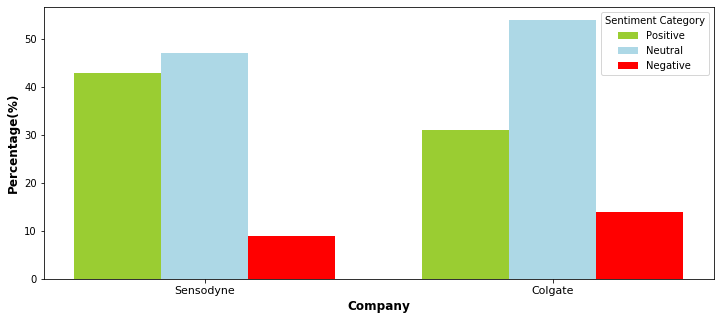

In [39]:
import numpy
company = ['Sensodyne','Colgate']
bar_width = 0.25
positive = [positive_sentiment_sensodyne,positive_sentiment_colgate]
negative = [negative_sentiment_sensodyne,negative_sentiment_colgate]
neutral = [neutral_sentiment_sensodyne,neutral_sentiment_colgate]


x = numpy.arange(len(positive))
plt.figure(figsize=(12,5))

plt.bar(x,positive,color = 'yellowgreen',width = bar_width ,label = 'Positive')
plt.bar(x + bar_width, neutral,color = 'lightblue',width = bar_width,label = 'Neutral')
plt.bar(x + bar_width*2,negative,color = 'red',width = bar_width,label = 'Negative')

plt.xticks(x+ bar_width,company,fontsize= 11)
plt.xlabel('Company',fontsize = 12,fontweight = 'bold')
plt.ylabel('Percentage(%)',fontsize = 12,fontweight = 'bold')
plt.legend( title="Sentiment Category")

plt.show()

# Crest(Cleaning)

In [40]:
#collecting text from comments and retweets file(crest)
fname = "data/crest/comments_retweets/comments_retweets.csv"

comments_text_crest=[]
comment_crest = []

with open(fname,'r',encoding="utf8") as file:
    comments = csv.reader(file)
    for comment in comments:
        if(comment[4] == "text"):
            continue
        else:
            comment_crest = []
            comment_crest.append(comment[4])
            comments_text_crest.append(comment_crest)
print(comments_text_crest)

[['Will do. Sending now.'], ['@Crest if you could reply that’d be great'], ['@Crest I need that sponsorship.'], ['@Crest my 10 pack of white strips only came with 8 wtf'], ['@Crest can you make your White Strips minty or something other than what I imagine glue sticks taste like?'], ['@Crest So how is your toothpaste the official toothpaste of Santa? I’m real confused on that whole dealio'], ['Thank you so much!! Both my dad and my brothers girlfriend have memories of the flavor and miss it dearly. I wonder how many more people are missing lemon ice! I would be happy to purchase if you have any stored in a secret vault - we have searched everywhere!'], ['@Crest is there any other known issues with this batch? The seal came undone #BlownTube #ToothpasteEverywhere #crest #BleachMyGranite #Disappointed'], ['@Crest will you ever start producing lemon ice toothpaste again? it would mean the world to my dad!!'], ['This is a great commercial! Kudos to all that were involved @Procter in making

In [41]:
#Storing text of comments in csv
import pandas as pd

df1 = pd.DataFrame(comments_text_crest)

path1 = "data/crest/comments_retweets/comments_text_crest.csv"
df1.to_csv(path1, header=False, index=False, index_label=None)


In [42]:
#reading the text from file
path1 = "data/crest/comments_retweets/comments_text_crest.csv"
count = 0
with open(path1,'r',encoding="utf8") as file:
    texts = csv.reader(file)
    for text in texts:
        count = count + 1
        print(text)
print(count)
    

['Will do. Sending now.']
['@Crest if you could reply that’d be great']
['@Crest I need that sponsorship.']
['@Crest my 10 pack of white strips only came with 8 wtf']
['@Crest can you make your White Strips minty or something other than what I imagine glue sticks taste like?']
['@Crest So how is your toothpaste the official toothpaste of Santa? I’m real confused on that whole dealio']
['Thank you so much!! Both my dad and my brothers girlfriend have memories of the flavor and miss it dearly. I wonder how many more people are missing lemon ice! I would be happy to purchase if you have any stored in a secret vault - we have searched everywhere!']
['@Crest is there any other known issues with this batch? The seal came undone #BlownTube #ToothpasteEverywhere #crest #BleachMyGranite #Disappointed']
['@Crest will you ever start producing lemon ice toothpaste again? it would mean the world to my dad!!']
['This is a great commercial! Kudos to all that were involved @Procter in making it happen

['@Crest hello there! Where can I find pump toothpaste to buy ? I’ve looked all over the internet and I found only for kids.']
['@Crest @Influenster #CrestForHealthyGums #AvailableAtTarget #Complimentary https://bit.ly/2oF0dLO']
['@Crest @Influenster #CrestForHealthyGums #AvailableAtTarget #Complimentary https://bit.ly/2oF0dLO']
['@Crest @Influenster #CrestForHealthyGums #AvailableAtTarget #Complimentary https://bit.ly/2oF0dLO']
['@Crest @Influenster #CrestForHealthyGums #AvailableAtTarget #Complimentary https://bit.ly/2oF0dLO']
['@Crest @Influenster #CrestForHealthyGums #AvailableAtTarget #Complimentary https://bit.ly/2oF0dLO']
['@Crest @Influenster #CrestForHealthyGums #AvailableAtTarget #Complimentary https://bit.ly/2oF0dLO']
['@Crest @Influenster #CrestForHealthyGums #AvailableAtTarget #Complimentary https://bit.ly/2oF0dLO']
['@Crest @Influenster #CrestForHealthyGums #AvailableAtTarget #Complimentary https://bit.ly/2oF0dLO']
['@Crest @Influenster #CrestForHealthyGums #AvailableAtTa

In [43]:
#removing unnessary symbol
comments_no_punc_crest = []
for comments in comments_text_crest:
    for comment in comments:
        comments_no_punc_crest.append(remove_punc(comment))
        

In [44]:
comments_no_punc_crest

['Will do Sending now',
 'Crest if you could reply that d be great',
 'Crest I need that sponsorship',
 'Crest my 10 pack of white strips only came with 8 wtf',
 'Crest can you make your White Strips minty or something other than what I imagine glue sticks taste like',
 'Crest So how is your toothpaste the official toothpaste of Santa I m real confused on that whole dealio',
 'Thank you so much Both my dad and my brothers girlfriend have memories of the flavor and miss it dearly I wonder how many more people are missing lemon ice I would be happy to purchase if you have any stored in a secret vault we have searched everywhere',
 'Crest is there any other known issues with this batch The seal came undone BlownTube ToothpasteEverywhere crest BleachMyGranite Disappointed',
 'Crest will you ever start producing lemon ice toothpaste again it would mean the world to my dad',
 'This is a great commercial Kudos to all that were involved Procter in making it happen Crest',
 'Then give it out fo

In [45]:
#converting all comments  to lower case form and splitting
words_in_comments_crest = [comment.lower().split() for comment in comments_no_punc_crest]
for words in words_in_comments_crest:
    print(words)

['will', 'do', 'sending', 'now']
['crest', 'if', 'you', 'could', 'reply', 'that', 'd', 'be', 'great']
['crest', 'i', 'need', 'that', 'sponsorship']
['crest', 'my', '10', 'pack', 'of', 'white', 'strips', 'only', 'came', 'with', '8', 'wtf']
['crest', 'can', 'you', 'make', 'your', 'white', 'strips', 'minty', 'or', 'something', 'other', 'than', 'what', 'i', 'imagine', 'glue', 'sticks', 'taste', 'like']
['crest', 'so', 'how', 'is', 'your', 'toothpaste', 'the', 'official', 'toothpaste', 'of', 'santa', 'i', 'm', 'real', 'confused', 'on', 'that', 'whole', 'dealio']
['thank', 'you', 'so', 'much', 'both', 'my', 'dad', 'and', 'my', 'brothers', 'girlfriend', 'have', 'memories', 'of', 'the', 'flavor', 'and', 'miss', 'it', 'dearly', 'i', 'wonder', 'how', 'many', 'more', 'people', 'are', 'missing', 'lemon', 'ice', 'i', 'would', 'be', 'happy', 'to', 'purchase', 'if', 'you', 'have', 'any', 'stored', 'in', 'a', 'secret', 'vault', 'we', 'have', 'searched', 'everywhere']
['crest', 'is', 'there', 'any', 'o

['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'are', 'there', 'any', 'plans', 'to', 'bring', 'back', 'your', 'citrus', 'splash', 'toothpaste', 'it', 'was', 'one', 'of', 'the', 'few', 'that', 'aren', 't', 'mint', 'that', 'was', 'genuinely', 'good']
['i', 'would', 'feel', 'better', 'about', 'that', 'of', 'you', 'did', 'not', 'advertixe', 'on', 'fox

In [46]:
#removing stop words from comments
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english') + ['us','all','hey','yeah','ya','yeap','could',"couldn't"])
comments_no_sw_crest = [[word for word in words if not word in stop_words]
              for words in words_in_comments_crest]

In [47]:
comments_no_sw_crest

[['sending'],
 ['crest', 'could', 'reply', 'great'],
 ['crest', 'need', 'sponsorship'],
 ['crest', '10', 'pack', 'white', 'strips', 'came', '8', 'wtf'],
 ['crest',
  'make',
  'white',
  'strips',
  'minty',
  'something',
  'imagine',
  'glue',
  'sticks',
  'taste',
  'like'],
 ['crest',
  'toothpaste',
  'official',
  'toothpaste',
  'santa',
  'real',
  'confused',
  'whole',
  'dealio'],
 ['thank',
  'much',
  'dad',
  'brothers',
  'girlfriend',
  'memories',
  'flavor',
  'miss',
  'dearly',
  'wonder',
  'many',
  'people',
  'missing',
  'lemon',
  'ice',
  'would',
  'happy',
  'purchase',
  'stored',
  'secret',
  'vault',
  'searched',
  'everywhere'],
 ['crest',
  'known',
  'issues',
  'batch',
  'seal',
  'came',
  'undone',
  'blowntube',
  'toothpasteeverywhere',
  'crest',
  'bleachmygranite',
  'disappointed'],
 ['crest',
  'ever',
  'start',
  'producing',
  'lemon',
  'ice',
  'toothpaste',
  'would',
  'mean',
  'world',
  'dad'],
 ['great',
  'commercial',
  'kud

In [48]:
#word frequency
words_no_sw_crest = list(itertools.chain(*comments_no_sw_crest))

counts_freq = collections.Counter(words_no_sw_crest)

print(counts_freq)


Counter({'crest': 2589, 'influenster': 860, 'complimentary': 858, 'availableattarget': 857, 'crestforhealthygums': 506, 'toothpaste': 380, 'crestattarget': 349, 'crestsmilewithpride': 245, 'please': 189, 'commercial': 180, 'teeth': 156, 'white': 141, 'like': 133, 'fox': 133, 'colgate': 125, 'strips': 114, 'bts': 110, 'would': 106, 'stop': 106, 'products': 102, 'thank': 100, 'know': 99, 'help': 96, 'product': 93, 'love': 92, 'make': 90, 'thanks': 90, 'get': 90, 'new': 86, 'news': 85, 'need': 84, 'use': 84, 'mint': 83, 'back': 83, 'buy': 83, 'advertising': 79, 'twt': 78, 'good': 77, 'want': 75, 'girl': 74, 'used': 73, 'one': 71, 'whitening': 69, 'amp': 69, 'really': 67, 'people': 66, 'see': 65, 'support': 64, 'little': 64, 'find': 59, 'kids': 58, 'sponsor': 57, 'user': 57, 'time': 56, '3d': 56, 'foxnews': 54, 'using': 53, 'great': 51, 'think': 51, 'kid': 50, 'ever': 49, 'children': 49, 'let': 49, 'tube': 49, 'brand': 49, 'health': 48, 'box': 47, 'go': 47, 'still': 47, 'disgusting': 47, '

In [49]:
#translated to english if there is any non english sentence
comment_so_sw_crest_en = []
for comment in comments_no_sw_crest:
    target = "en"
    sent = str(comment)
    sentence = mtranslate.translate(sent,target,"auto")
    print(sentence)
    comment_so_sw_crest_en.append(sentence)


['sending']
['crest', 'could', 'reply', 'great']
['crest', 'need', 'sponsorship']
['crest', '10', 'pack', 'white', 'strips', 'came', '8', 'wtf']
['crest', 'make', 'white', 'strips', 'minty', 'something', 'imagine', 'glue', 'sticks', 'taste', 'like']
['crest', 'toothpaste', 'official', 'toothpaste', 'santa', 'real', 'confused', 'whole', 'dealio']
['thank', 'much', 'dad', 'brothers', 'girlfriend', 'memories', 'flavor', 'miss', 'dearly', 'wonder', 'many', 'people', 'missing', 'lemon', 'ice', 'would', 'happy', 'purchase', 'stored', 'secret', 'vault', 'searched', 'everywhere']
['crest', 'known', 'issues', 'batch', 'seal', 'came', 'undone', 'blowntube', 'toothpasteeverywhere', 'crest', 'bleachmygranite', 'disappointed']
['crest', 'ever', 'start', 'producing', 'lemon', 'ice', 'toothpaste', 'would', 'mean', 'world', 'dad']
['great', 'commercial', 'kudos', 'involved', 'procter', 'making', 'happen', 'crest']
['give', 'free']
['oh', 'getting', 'free', 'toothpaste']
['crest']
['crest', 'sponsor']


['whoa', 'whoa', 'whoa', 'package', 'deal', 'even', 'whole', 'commercial', 'skit', 'ready']
['crest', 'trying', 'purchase', 'white', 'strips', 'others', 'try', 'different', 'computers', 'receiving', 'error', 'message', 'like', 'purchase', 'please', 'advise']
[]
['thank', 'crest']
['like', 'way', 'think']
['crest', 'keep', 'white', 'strips', 'overnight']
['crest', 'create', 'toothpaste', 'dispenses', 'like', 'soap', 'dispenser', 'people']
['mad', 'made', 'ambassador']
['appreciate', 'product', 'samples', 'review', 'youtube', 'channel']
['crest', 'need', 'african', 'american', 'model', 'smile', 'like', 'hook', 'uses', 'crest', 'get', 'pearlie', 'whites']
['thanks', 'crest', 'white', 'strips']
['crest']
['crest', 'pays', 'fox', 'hysteria']
['thank', 'must', 'lot', 'people', 'dislike', 'mint', 'sure']
['please', 'add', 'list', 'people', 'want', 'citrus', 'back']
['crest', 'whyyyy', 'updated', 'glamorous', 'white', 'toothpaste', 'remove', '80', 'surface', 'stains', 'instead', '90', 'like', 

['crest']
['crest', 'hope', 'heard', 'thattt']
['thank']
[]
['crest', 'love', 'stop', 'showing', 'commercial', 'girl', 'throws']
['crest', 'spent', '10', 'new', 'toothbrush', 'inside', 'corroded', 'batteries', 'wet', 'return', 'threw', 'away', 'package', 'loved', 'spin', 'brush', 'past', 'new', 'design', 'stinks', 'went', 'back', 'old', 'one', 'new', 'head']
['crest', 'know', 'signature', 'color', 'wish', 'social', 'media', 'team', 'research', 'launching', 'campaign', 'times', 'changing', 'amp', 'year', 'blue', 'pumpkin', 'represents', 'autism', 'childs', 'verbal', 'abilities', 'say', 'trick', 'treat', 'amp', 'like', 'every', 'kid']
['hello', 'agent', 'yes', 'love', 'next', 'commercial', 'natural', 'beauty', 'hard', 'come', 'bye']
['crest', 'c', 'mon', 'knock', 'little', 'ass', 'bottom', 'row', 'white', 'strips', 'especially', 'box', 'shows', 'different', 'size', 'amp', 'shape', 'like', 'made', 'top', 'row', 'adults', 'bottom', 'babies', 'dafuq', 'crest', 'whitestrips']
['crest', 'infl

['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'help', 'week', 'still', 'white', 'strips', 'order']
['ohhhhhh', 'gum', 'line']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary', 'sensitive', 'teeth', 'like', 'crest', 'gum', 'sensitivity', 'toothpaste', 'something', 'need', 'get', 'hands']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'please', 'make', 'toothpaste', 'without', 'boxes', 'need']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['stockp

['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'oralb', 'products', 'would', 'help', 'restore', 'repair', 'effects', 'bruxism', 'maybe', 'toothpaste', 'brush', 'anything', 'floss', 'wise', 'rinse', 'appliances', 'help']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'whitner', 'deck', 'union', 'card', 'says', '5', 'pipe', 'miho', 'pike']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'inf

['prefer', 'flip', 'top', 'caps', 'get', 'lost', 'tube', 'stand', 'boxes', 'marked', 'also', 'prefer', 'gel', 'paste', 'want', 'sure', 'getting', 'product', 'want', 'let', 'make', 'difficult']
[]
[]
[]
[]
[]
['crest', 'always', 'sponsorship', 'appreciate', 'products', 'nonetheless']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'fyi', 'scam', 'fake', 'talent', 'agency', 'using', 'brand', 'trick', 'families', 'giving', 'money', 'commercial', 'double', 'tree', 'hotel', 'downtown', 'wilmington', 'de', 'tomorrow']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'crest', 'buying', 'toothpaste', 'know', 'getting', 'flip', 'top', 'screw', 'top', 'see', 'markings', 'box']
['crest', 'pro', 'health', 'container', 'adds', 'bit', 'suspense', 'stress', 'eve

['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', '3d', 'white', 'strips', 'review']
['crest', 'waste', 'look', 'huge', 'box', 'almost', 'nothing', 'box', 'big']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary', '2']
['crest', 'need', 'commercial']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestattarget',

['maybe', 'find', 'app', 'doesnt', 'work', 'available', 'state', 'input', 'new', 'england', 'new', 'york', 'nothing']
['nothing', 'available', 'entire', 'state', 'massachusetts', 'sounds', 'like', 'distribution', 'issue', 'contact', 'manager', 'store', 'ask', 'stock', 'issue']
['crest', 'story', 'adult', 'survivor', 'bullying', 'ppl', 'understand', 'different', 'like', 'guy', 'creates', 'campaigns', 'amp', 'online', 'content', 'crest', 'know', 'say', 'old', 'bullies', 'today', 'smile', 'ismilewithpride', 'hireleon']
['sent']
['good', 'know', 'also', 'combine', 'ingredients', 'make', '1', 'phenomenal', 'product', 'reason', 'someone', 'want']
['oh', 'thank', 'goodness', 'thought', 'new', 'coke', 'kind', 'deal', 'disappointed', 'taste', 'change', 'glad', 'hear', 'fixed']
['last', 'tube', 'citrus', 'splash', 'ordered', 'found', 'discontinued', 'please', 'bring', 'back']
['crest', 'products', 'ada', 'stamped', 'cfbisback']
['crest', 'influenster', 'crestattarget', 'availableattarget', 'comp

['crest', 'would', 'please', 'tell', 'abrasion', 'level', 'crest', 'gum', 'detoxify', 'called', 'customer', 'service', 'told', 'rda', 'rating', '250', 'info', 'sufficient', 'info', 'want', 'continue', 'use', 'anything', '100', 'thank']
['come', 'kids', 'mouthwash', 'fruity', 'flavor', 'kids', 'minty', 'breath']
['crest', 'since', 'people', 'started', 'dumb', 'stuff', 'think', 'might', 'good', 'idea', 'go', 'back', 'putting', 'seal', 'toothpaste']
['crest', 'many', 'retweets', 'lifetime', 'supply', 'baking', 'soda', 'amp', 'peroxide', 'toothpaste']
['kid', 'still', 'mad', 'sad']
['please', 'bring', 'back', 'citrus', 'flavor', 'please', 'hate', 'taste', 'mint', 'cinnamon']
['another', 'vote', 'citrus', 'favorite', 'house']
['crest', 'let', 'run', 'social', 'media', 'account', 'tell', 'tarter', 'buildup', 'go', 'fuck', 'clout']
['crest', 'whiting', 'strips', 'make', 'mouth', 'nasty', 'asf']
['crest', 'available']
[]
['lmao', 'good', 'responsive']
['crest', 'used', 'baking', 'soda', 'perox

['children', 'access', 'toothbrushes', 'toothpaste', 'please', 'help', 'children', 'held', 'detention', 'facilities', 'aclu', 'lights4liberty', 'raicestexas']
['little', 'fans', 'know', 'would', 'last', 'tweet', 'forever']
['crest', 'cp', 'news', 'kids', 'held', 'border', 'need', 'soap', 'toothbrushes', 'toothpaste', 'please', 'help']
['crest']
['crest', 'colgate', 'proctergamble', 'oralb', 'drbronner', 'dove', 'please', 'send', 'children', 'toothbrushes', 'toothpaste', 'soap']
['crest', 'colgate', 'aquafreshsa', 'maybe', 'could', 'team', 'deliver', 'toothpaste', 'brushes', 'border', 'show', 'world', 'corporate', 'america', 'heart', 'even', 'government', 'seems', 'misplaced']
['crest', 'think', 'thousand', 'kids', 'border', 'would', 'love', 'delivery', 'toothbrush', 'toothpaste', 'great', 'pr', 'move', 'could']
['crest', 'dove', 'hanes', 'walmart', 'campbells', 'kraftbrand', 'nestle', 'target', 'costco', 'publix', 'kroger', 'amazon', 'bedbathbeyond', 'cvspharmacy', 'wagsocialcare', 'pl

['sounds', 'good', 'ship', 'empty', 'toothpaste', 'tubes', 'store', 'recycle', 'deal', 'love', 'products', 'might', 'deal', 'breaker', '400', 'million', 'toothpaste', 'tubes', 'landfills', 'every', 'year']
['learned', 'toothpaste', 'tubes', 'recyclable', 'due', 'composition', 'fans', 'need', 'request', 'change', 'thanks', 'advance']
['crest', 'fuck', 'chocolate']
['crest', 'say', 'advertise', 'fox', 'news', 'channel']
['crest', 'wondering', 'teeth', 'staining', 'brown', 'brush', 'floss', 'use', 'mouth', 'wash', 'curious', 'stannous', 'fluoride', 'toothpaste', 'advertises', 'advanced', 'whitening']
[]
['crest', '3d', 'white', 'toothpaste', 'best', 'works', 'great', 'good', 'bye', 'colgate']
['sure', 'thanks']
['crest', 'mmmmmmm', 'toothpaste']
['crest', 'ahhhh', 'crest', 'proactive']
['crest', 'found', 'next', 'model']
['crest', 'sponsor', 'thx']
['crest', 'please', 'please', 'please', 'bring', 'back', 'citrus', 'splash']
['guys', 'hiring', 'chemical', 'engineers']
['crest', 'find', 'co

['thanks']
['crest', 'leave', 'smiling', 'fresh', 'blessed', 'morning', 'made', 'stay', 'way', 'day']
['interesting', 'guessed', 'nostalgia', 'think', 'pro', 'health', 'fine', 'make', 'sure', 'flip', 'cap', 'next', 'time', 'buy']
['crest', 'sponsor', 'cause', 'colgate', 'sucks']
['maybe', 'old']
['bruh', 'aquafresh', 'better']
['would', 'like', 'see', 'options', 'really', 'want', 'understand', 'reason', 'flip', 'top', 'caps', 'happy', 'send', 'email', 'address']
['crest', 'years', 'ago', 'used', 'white', 'strips', 'bought', 'box', 'today', 'open', 'quarter', 'size', 'old', 'ones', 'used', 'cover', 'teeth', 'get', 'refund']
['thank', 'let', 'know', 'others', 'cost', 'reason', 'flip', 'tops', 'default']
['however', 'tubes', 'comply', 'tsa', 'weight', 'limits', '3', '5', 'ozs', 'unfortunately', 'products']
[]
['crest', 'discontinued', 'sensi', 'relief', 'toothpaste', 'sensory', 'issues', 'toothpaste', 'could', 'tolerate', 'two', 'others']
['oh', 'hygienists', 'work']
['thank', 'reply', '6

['crest', 'boycotting', 'crest', 'support', 'tucker', 'carlson', 'fox']
['crest', 'downy', 'dawndish', 'sorry', 'folks', 'done', 'using', 'products']
[]
['thanks', 'onfo', 'give', 'try']
[]
['sure']
['disappointed', 'sensi', 'relief', 'discontinued', 'toothpaste', 'helped', 'sensitivity']
['okay', 'done']
['crest', '3dwhitestrips', 'amazing', 'first', 'night', 'using', 'wow']
['crest', 'new', 'gentle', 'routine', 'whitestrips', 'horrible', 'get', 'teeth', 'please', 'go', 'back', 'old', 'design', 'formulation', 'amazon', 'reviewers', 'agree', 'product', 'ruined']
['crest', 'mom', 'sister', 'loving', 'tooth', 'pest', 'charcoal', 'love', 'best', 'tooth', 'pest', 'ever', 'life']
['crest', 'crest', 'toothpaste', 'distributed', 'canada', 'made']
['bring', 'back', 'citrus', 'splash', 'please']
['crest', 'guys', 'ur', 'favorite', 'brand', 'toothpaste', 'wondering', 'would', 'consider', 'stop', 'putting', 'tubes', 'boxes', 'throw', 'care', 'looks', 'like', 'outside', 'please', 'consider', 'help

['crest', 'couple', 'weeks', '3d', 'white', 'strips', 'made', 'teeth', 'pretty', 'thank', 'u', 'babes', 'would', 'luv', 'add', 'glow', 'ur', 'products']
['crest', 'toothpaste', 'come', 'tubes', 'inside', 'boxes', 'tubes']
['never', 'realized', 'crest', 'toothpaste', 'tested', 'animals', 'buy', 'another', 'brand']
['relationship', 'always', 'kept', 'bad', 'taste', 'mouth']
['mouth', 'bad']
['crest', 'amp', 'bounty', 'really', 'two', 'easily', 'today', 'already', 'replaced', 'know', 'fox', 'promotes', 'blatant', 'racism', 'amp', 'bigotry', 'addition', 'lie', 'repeat', 'trump', 'lies', 'goodbye', 'grabyourwallet', 'boycottcrest', 'boycottbountry', 'stopracism']
['discontinue']
['crest', 'guys', 'bring', 'back', 'vanilla', 'mint', 'whitening', 'expressions', 'toothpaste', 'best', 'toothpaste', 'ever']
['crest', 'safe', 'say', 'keeping', 'business', 'ha']
[]
['anyway', 'get', 'care', 'package', 'mail', 'plz', 'tha', 'first', 'date', '10', 'years']
['love', 'items', 'big', 'date', 'saturday'

['crest', 'j', 'wait', 'my', 'contract']
['crest', 'overnight', 'floss', 'toothpaste', 'brady', 'residence', 'please']
['crest', 'advertise', 'foxnews', 'please', 'advise']
['crest', 'bounty', 'charmin', 'gain', 'proctergamble', 'family', 'used', 'products', 'regularly', 'stops', 'gillette', 'commercial']
['crest', 'citrus', 'splash', 'coming', 'back', 'neeeeeeeed']
['crest', 'oh', 'guess', 'still', 'full', 'tube', 'toothpaste', 'give', 'time', 'research', 'suitable', 'replacement', 'gillette', 'sure', 'make', 'mess', 'proctergamble', 'many', 'household', 'items', 'source', 'p', 'amp', 'g', 'ban']
['crest', 'colgate', 'listerine', 'scopemouthwash', 'oralb', 'hi', 'name', 'michele', 'working', 'creating', 'toothbrush', 'toothpaste', 'floss', 'kits', 'fostercareadopt', 'dallas', 'would', 'willing', 'help', 'cause', 'lieu', 'birthday', 'gifts', '4', 'kids']
['wow', 'missing', 'losers']
['im', 'screaming']
['good', 'lowering', 'cost', 'packaging', 'lower', 'cost', 'product', 'maybe', 'pass

['crest', 'kudos', 'prohealthclinical', 'mouthwash', 'feels', 'like', 'pro', 'cleaning', 'every', 'time']
['crest', 'best', 'toothpaste', 'dump', 'sensodyne', 'toothpaste', 'crest', 'instantly', 'took', 'away', 'tooth', 'pain', 'sensodyne', 'work', 'like', 'crest', 'period']
['crest', 'hello', 'need', 'new', 'toothbrush', 'one', 'use']
['crest', 'plz', 'help', 'tv', 'proof', 'toothpastes']
['crest', 'sorcery', 'somehow', 'magic', 'tube', 'appears', 'nearly', 'empty', 'dispensing', 'weeks', 'shows', 'signs', 'stopping']
['crest', 'teeth', 'paste', 'know']
['crest', 'teethpaste', 'know']
['crest', 'make', 'pro', 'esports', 'franchise', 'sponsor']
['lol', 'word']
['company', 'crest', 'network', 'laughs', 'happy', 'tear', 'gassing', 'migrants', 'even', 'children', 'like', 'boycottcrest', 'easy', 'many', 'great', 'brands']
['crest', 'please', 'answer', 'customers', 'deserve', 'response', 'thousands', 'begging', 'amp', 'asking', 'boost', 'polishing', 'treatment', 'longer', 'available', 'ever

['crest', 'halloween', 'please', 'take', 'disgusting', 'commercial', 'air']
['crest', 'absolutely', 'disgusting', 'commercial', 'poortaste']
['theory', 'hilarious', 'visual', 'disgusting', 'tv']
['agree', 'believe', 'daytime', 'tv', 'im', 'pregnant', 'hyperemesis', 'last', 'thing', 'need', 'see', 'sudden', 'flash', 'vomit', 'get', 'helps', 'people', 'buy', 'toothpaste', 'bad', 'choice']
['crest', 'please', 'check', 'dm', 'mention', 'thanks']
['crest', 'would', 'ask', 'got', 'wanted', 'know', 'genuine', 'never', 'seen', 'design', 'box', 'glitter', 'box', 'think', 'also', 'word', 'luxe', 'missed', 'thanks']
['crest', 'got', 'air', 'toothpaste']
['crest', 'guys', 'know', 'teal', 'blue', 'pumpkin', 'kids', 'food', 'allergies', 'sensitivities', 'son', 'would', 'go', 'anafilactic', 'shock', 'eating', 'candy', 'corn', 'tealpumpkinproject']
['crest', 'commercial', 'screen', 'need', 'repaired', 'weakened', 'enamel', 'might', 'wait', 'weekend', 'enamel', 'mention', 'local', 'science', 'teacher']

['crest', 'oralb', 'proctergamble', 'nothing', 'healthy', 'continued', 'support', 'devastatingly', 'harmful', 'lies', 'conspiracy', 'theories', 'provided', 'voice', 'fox', 'news', 'products', 'longer', 'place', 'home']
['crest', 'use', 'anymore', 'help', 'promote', 'violence', 'hate', 'coming', 'wh', 'fox']
['crest', 'foxnews', 'trafficks', 'anti', 'semitism', 'see', 'chris', 'farrell', 'comments', 'soros', 'even', 'synagogue', 'site', 'massacre', 'continue', 'advertise', 'network', 'offer', 'tacit', 'support', 'lethal', 'bigotry', 'values', 'please', 'stop', 'ads']
['crest', 'kids', 'broooo']
['crest', 'want', 'watch', 'child', 'vomit', 'commercials', 'bad']
['fucking', 'toothpaste', 'well', 'said', 'billmaher', 'grew', 'crest', 'idiotic', 'iterations', 'nowadays', 'shamelessly', 'unnecessary']
['advertising', 'fox', 'news', 'connects', 'profiting', 'promotion', 'terrorism', 'racism', 'hate', 'cut', 'ties', 'fox', 'news', 'magashooter', 'magabomber', 'treeoflifesynagogue']
['crest', '

['commercial', 'gross', 'one', 'ever', 'wants', 'see', 'someone', 'vomit', 'food', 'network', 'disgusting', 'huge', 'miss', 'commercial', 'stick', 'colgate']
['crest', 'new', 'advertisement', 'shown', 'hallmark', 'channel', 'awful', 'family', 'watching', 'ate', 'dinner', 'watching', 'girl', 'throw', 'disgusting', 'disappointing', 'needs', 'removed']
['understand', 'think', 'commercial', 'works', 'especially', 'watching', 'foodnetwork', 'wrong', 'crest', 'list', 'things', 'buy']
['commercial', 'disgusted', 'brand', 'promote', 'something', 'unhealthy', 'like', 'eating', 'junk', 'food', 'health', 'implications', 'go', 'beyond', 'teeth', 'decay', 'ignore']
['crest', 'commercials', 'kid', 'throwing', 'eating', 'candy', 'telling', 'people', 'crest', 'covered']
['crest', 'one', 'disgusting', 'commercials', 'ever', 'seriously', 'think', 'kid', 'throwing', 'cute', 'buying', 'products', 'gross', 'crestdoesnthaveuscovered', 'yuck']
['crest', 'signed', 'little', 'girl', 'throwing', 'lmaoooo', 'ter

['crest', 'got', 'get', 'rid', 'commercial', 'little', 'girl', 'vomits', 'distasteful', 'borderline', 'child', 'abuse', 'dignity', '4money']
['shows', 'real', 'lack', 'consideration', 'class', 'goodbye', 'crest', 'never', 'purchase', 'crest', 'vomit', 'sell', 'toothpaste']
['disgusting', 'crest', 'stoop', 'using', 'children', 'throwing', 'commercials', 'always', 'comes', 'meal', 'times', 'gross', 'colgate', 'anyone', 'throwing', 'commercials']
['crest', 'would', 'put', 'kid', 'throwing', 'commercial', 'eating', 'dinner', 'watched', 'kid', 'puke', 'chocolate', 'disgusting']
['watch', 'video', 'dad', 'yells', 'kid', 'great', 'grades', 'child', 'melts', 'hearts', 'cute', 'bright']
['crest', 'think', 'found', 'adorable', 'model', 'team', 'son', 'dad', 'beaming', 'smiles']
['crest', 'hell', 'man']
['crest', 'colgate', 'sensodyne', 'list', 'goes', 'favorite', 'toothpaste', 'brand']
['crest', 'please', 'edit', 'commercial', 'revolting', 'take', 'throw', 'scene', 'thank']
['crest', 'influenste

['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'getting', 'harder', 'find', 'pump', 'style', 'dispenser', 'except', 'kids', 'toothpaste', 'useful', 'adults', 'disabilities', 'pump', 'going', 'away', 'even', 'mentions', 'one', 'adult', 'flavor', 'buy']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['appreciate', 'response', 'working', 'securing', 'agency', 'asap', 'recommended', 'nyc', 'modeling', 'talent', 'agencies', 'mind', 'suggestions', 'thanks', 'making', 'smile', 'brighter', 'looking', 'forward', 'working', 'near', 'future']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['find', 'reason', 'smile', 'every', 'day', 'thanks', 'crest', 'keeping', 'teeth', 'white', 'smile', 'point', 'worldsmileday']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'compl

['crest', 'user', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'user', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'user', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'user', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'really']
['crest', 'know', 'ads', 'pay', 'hate', 'propaganda', 'site', 'breitbart', 'imagine', 'prefer', 'associate', 'brand', 'divisive', 'reality', 'twisting', 'articles', 'slpng', 'giants', 'instructions', 'avoid', 'sites']
['crest', 'user', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'hi', 'picked', '3', 'pa

['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'brush', 'ones', 'show', 'crest', 'teeth']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'nutrition', 'facts']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availa

['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary', 'get', '2', 'crest', 'click', 'link', 'right']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest

['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'avail

['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'availableattarget', 'complimentary']
['crest', 'influenster', 'crestforhealthygums', 'avail

['crest', 'used', 'love', 'advertise', 'fox', 'find', 'another', 'brand']
['crest', 'get', 'sponsorship']
['definitely', 'complaint', 'funny', 'happening']
['fox', 'advertiser', 'time', 'find', 'another', 'toothpaste', 'spread', 'word', 'friends', 'family', 'coworkers']
['crest', 'commercials', 'bother']
['crest', 'colgate', 'oralb', 'going', 'first', 'make', 'environmentally', 'friendly', 'dental', 'picks', 'divorceplastic', 'earthfriendly', 'reducereuserecycle']
['crest', 'proctergamble', 'continue', 'funding', 'fox', 'news', 'hate', 'bigotry', 'family', 'buying', 'products', 'two', 'months', 'every', 'month', 'advertise', '2', 'adults', '6', 'kids', 'lots', 'mouths', 'brush', 'crest', 'grabyourwallet', 'defundhate', 'resist']
['crest', 'find', 'citrus', 'splash', 'toothpaste', 'anywhere', 'stop', 'making', 'mint', 'free', 'options']
['free']
['switching', 'another', 'brand', 'fox', 'propaganda', 'promoters']
['thank']
['crest', 'gum', 'detoxify', 'toothpaste', 'far', 'favorite']
['c

['lie', 'thank', 'product', 'crest']
['crest', 'use', 'case', 'tooth', 'paste', 'size', 'way', 'chodey', 'travel', 'near', 'large', 'enough', 'home', 'use', 'qtips', 'brand', 'q', 'tip', 'scale']
['crest', 'purchase', 'products', 'dump', 'fox', 'propaganda', 'network']
['crest', '36', 'members', 'family', 'longer', 'going', 'use', 'crest', 'advertise', 'fox', 'propaganda', 'next', 'talking', 'friends', 'employees', 'crest', 'share', 'values', 'share', 'money']
['crest', 'sorry', 'go', 'trying', 'colgate', 'happily']
['using', 'anymore', 'stop', 'advertising', 'foxnews']
['come', 'ever', 'sad', 'believe', 'would', 'cost', 'much', 'flavor', 'mint', 'screen', 'cap', 'ebay', 'listings']
[]
['far', 'loving', 'definitely', 'recommending', 'patients']
['something', 'tells', 'using', 'feels', 'little', 'something', 'like']
['teethpaste']
['rachelchassay', 'hook']
['thanks']
['crest', 'teethpaste', 'know']
['well', 'really', 'humpty', 'dumpty', 'really', 'fell', '12', 'inches', 'opened', 'cupbo

['erickbahena13', 'ddelagarzamtz', 'think', 'tweet', 'proves', 'point', 'crest', 'best', 'tbh']
['crest', 'formula', 'non', 'liquid', 'makes', 'gums', 'back', 'lips', 'kinda', 'feel', 'raw', 'sensitive', 'awhile', 'discontinued', 'liquid', 'kind', 'right']
['crest', 'mouthwash', 'walmart', 'south', 'carolina', 'indian', 'land', 'purple', 'bottle', 'green', 'one', 'light', 'blue', 'one', 'everything', 'dentist', 'burn', 'mouth', '5', '00']
['crest', 'crestsmilewithpride']
['wanna', 'give', 'cancer', 'research', 'anything', 'like', 'maybe', 'veterans', 'country', 'streets', 'whatdotheyneeditfor']
['thanks', 'try']
['well', 'played', 'one']
['crest', 'stop', 'making', 'sensitivity', 'strips', 'searching', 'months', 'dentist', 'said', 'use', 'cleanings', 'sensitivity', 'find']
['people', 'proud', 'sin']
['people', 'proud', 'sin']
['well', 'done']
['buying', 'crest', 'anymore']
['well', 'deserved', 'cause', 'everyone', 'deserves', 'smile']
['enough', 'already']
['know', 'toothpaste', 'buyin

['crestsmilewithpride']
['crest', 'heyyyy', 'would', 'mind', 'subscribing', 'youtube', 'page']
['crestsmilewithpride']
['bts', 'army', 'help', 'crestsmilewithpride']
['crestsmilewithpride']
['crestsmilewithpride']
['crestsmilewithpride']
['crestsmilewithpride']
['crestsmilewithpride']
['crestsmilewithpride']
['crestsmilewithpride']
['crestsmilewithpride']
['crestsmilewithpride']
['crestsmilewithpride']
['crestsmilewithpride']
['crestsmilewithpride']
['crestsmilewithpride']
['bts', 'twt', 'crestsmilewithpride']
['crest', 'crestsmilewithpride', 'the519', 'prideto', 'btsarmy', 'bts', 'twt']
['beautiful', 'bts', 'smiles', 'crestsmilewithpride', 'bts', 'twt']
['crestsmilewithpride']
['bts', 'twt', 'crestsmilewithpride']
['luv', 'u', 'crest', 'crestsmilewithpride']
['lgbts', 'crestsmilewithpride']
['yesss', 'crestsmilewithpride']
['crestsmilewithpride', 'sending', 'love', 'bts', 'twt', 'army']
['crestsmilewithpride']
['crestsmilewithpride']
['crest', 'crestsmilewithpride']
['crestsmilewithpr

['crest', 'family', 'boycotting', 'products', 'ypu', 'cease', 'support', 'fox', 'news', 'via', 'advertising', 'dollars']
['crest', 'show', 'support', 'kids', 'advertising', 'foxnews', 'fox', 'channel', 'apologize', 'spreading', 'propaganda', 'family', 'separations', 'love', 'toothpaste', 'hope', 'stand', 'families']
['crest', 'please', 'stop', 'advertising', 'crest', 'white', 'strips', 'foxnews', 'lying', 'children', 'separated', 'families', 'cannot', 'allow', 'america', 'become', 'fascist', 'country']
['crest', '65', 'years', 'old', 'week', 'used', 'crest', 'entire', 'life', 'stop', 'quickness', 'stop', 'advertising', 'fox']
['mom', 'see', 'children', 'children', 'forcibly', 'separated', 'stop', 'advertising', 'fox', 'news']
['happy', 'smiles', 'children', 'quite', 'motto', 'company', 'supports', 'trump', 'policies', 'advertising', 'fox', 'news', 'rarely', 'ever', 'bought', 'another', 'toothpaste', 'done', 'buying', 'toothpaste', 'stop', 'supporting', 'fox', 'news', 'childinternmentca

['prepare', 'boycott', 'cries', 'lmfao', 'usually', 'support', 'use', 'certain', 'events', 'promote', 'products', 'called', 'advertising', 'deal', 'crest', 'wants', 'align', 'marketing', 'pride', 'cares']
['crest', 'want', 'buy', 'dental', 'care', 'dentacoin', 'guys', 'team']
['crest', 'hi', 'crest', 'toothpaste', 'best', '1']
['crest', 'whitestrips', 'really', 'work', 'someone', 'please', 'gift', 'bernie', 'box']
['u', 'guys', 'horrible', 'testing', 'stuff', 'animals']
['miracle', 'think', 'corporation', 'would', 'take', 'tainted', 'gay', 'money', 'thank', 'u', 'crest', 'use', 'toothpaste', 'marsha', 'p', 'johnson', 'sylvia', 'rivera', 'storme', 'de', 'laverie', 'miss', 'major', 'rioted', 'police', 'brutality']
['crest', 'one', 'individual', 'packages', 'missing', 'entire', 'set', 'whitening', 'strips', 'contact']
['crest', 'every', 'store', 'area', 'running', 'carrying', 'families', 'favorite', 'crest', 'total', 'scope', 'white', 'blue', 'bottle', 'going']
['crest', 'pro', 'health', 

['crest', 'gotdamnzo', 'teeth', 'white', 'healthy', 'definitely', 'many', 'crest', 'commercials', 'brand', 'dance', 'like', 'born', 'golden', 'feet', 'birthday', '5', '31', 'would', 'great', 'gift', 'love', 'zo', 'please', 'consider']
['done', 'sent', 'dm', 'attach', 'image', 'know', 'increase', 'waste', 'sales', 'away', 'simple', 'twist', 'cap', 'hard', 'close']
['rule', 'like', 'put', 'cap', '8', 'toothpaste', 'impressed']
['crest', 'oh', 'snap', 'never', 'seam', 'break', 'open', 'common', 'thing']
['crest', 'dear', 'crest', 'know', 'mint', 'goes', 'well', 'chocolate', 'create', 'chocolate', 'mint', 'toothpaste', 'know', 'love']
['crest', 'love', 'luxe', 'whitening', 'toothpaste', 'cap', 'worst']
['thanks', 'saw', 'new', 'formula', 'change', 'noticed', 'lack', 'seal', 'assumed', 'connected']
['use', 'crest', 'toothpaste']
['crest', 'stopped', 'making', 'sensi', 'stop', 'strips']
['crest', 'colgate', 'hire', 'retweet', 'guys']
['crest', 'hire', 'retweet', 'guys']
['crest', 'pick', 'ma

['crest', 'team', 'fight', 'cavity', 'creeps', 'retro']
['crest', 'colgate', 'sensodyne', 'golden', 'idea', 'commercial', 'dm', 'interested']
['crest', 'family', 'memphis', 'loves', 'gumdexotify', 'commercial', 'featured', 'say', 'walgreens', 'please', 'send']
['options', 'fluoride', 'rinses', 'would', 'great']
['crest', 'yo']
['good', 'know', 'thanks']
['bought', 'store', 'yesterday']
['ad', 'years', 'old', 'suggestion', 'would', 'address', 'decision', 'made', 'learn', 'harmful', 'happen', 'future', 'advertising', 'product']
['crest', 'colgate', 'called', 'toothpaste', 'instead', 'teethpast']
['okay', 'one', 'day', 'financial', 'opportunities', 'doctors', 'start', 'businesses', 'outside', 'crippling', 'loans', 'addition', 'incredible', 'professional', 'school', 'debt', 'thank', 'replying', 'clearing', 'miscommunication']
['crest']
['way', 'mark', 'packaging', 'one', 'tell', 'purchasing', 'opening', 'boxes', 'photo', 'tube']
['crest', 'make', 'mojito', 'flavored', 'toothpaste']
['crest

['crest', 'ready', 'ready']
['crest', 'get', 'glamorous', 'white', 'brushes', 'thank', 'advance']
['crest', 'sponsor', 'feel', 'like', 'need', 'product', 'also', 'sensodyne']
['crest', 'gum', 'detoxify', 'specially', 'formulated', 'paste', 'activated', 'foam', 'technology', 'reaches', 'gum', 'line', 'significantly', 'improve', 'gum', 'health', 'leading', 'clinically', 'proven', 'healthier', 'gums', 'dentalproductshopper', 'dental', 'dentistry', 'dentist']
['crest', 'flavor', 'white', 'stripes', 'right', 'taste', 'like', 'paste', 'whitestripes']
[]
['alright', 'thanks', 'also', 'dream', 'id', 'get', 'sponsored']
['searching', 'product', '2', 'weeks', 'target', 'walgreens', 'cvs', 'heb', 'luck', 'crestgumdetoxify', 'available']
['imagine', 'world', 'could', 'treated', 'parents', 'equal', 'dadscounttoo']
['crest', 'whitestrips']
['put', 'polyethylene', 'toothpaste']
['crest', 'homeadvisor', 'ancestry', 'sponsors', 'fox', 'news', 'support', 'spread', 'racist', 'hate', 'amp', 'lies', 'ameri

In [50]:
comments_no_sw_crest

[['sending'],
 ['crest', 'could', 'reply', 'great'],
 ['crest', 'need', 'sponsorship'],
 ['crest', '10', 'pack', 'white', 'strips', 'came', '8', 'wtf'],
 ['crest',
  'make',
  'white',
  'strips',
  'minty',
  'something',
  'imagine',
  'glue',
  'sticks',
  'taste',
  'like'],
 ['crest',
  'toothpaste',
  'official',
  'toothpaste',
  'santa',
  'real',
  'confused',
  'whole',
  'dealio'],
 ['thank',
  'much',
  'dad',
  'brothers',
  'girlfriend',
  'memories',
  'flavor',
  'miss',
  'dearly',
  'wonder',
  'many',
  'people',
  'missing',
  'lemon',
  'ice',
  'would',
  'happy',
  'purchase',
  'stored',
  'secret',
  'vault',
  'searched',
  'everywhere'],
 ['crest',
  'known',
  'issues',
  'batch',
  'seal',
  'came',
  'undone',
  'blowntube',
  'toothpasteeverywhere',
  'crest',
  'bleachmygranite',
  'disappointed'],
 ['crest',
  'ever',
  'start',
  'producing',
  'lemon',
  'ice',
  'toothpaste',
  'would',
  'mean',
  'world',
  'dad'],
 ['great',
  'commercial',
  'kud

In [51]:
#sentiment analysis for Crest
from textblob import TextBlob

positive = 0
negative = 0
neutral = 0
total_comment = 0

for comment in comment_so_sw_crest_en:
    total_comment += 1
    target = "en"
    sentence = str(comment)
    #sentences = mtranslate.translate(sentence,target,"auto")
    analysis = TextBlob(sentence)
    polarity = analysis.sentiment.polarity
    
    if polarity > 0:
        positive = positive + 1
        
    elif polarity < 0:
        negative = negative + 1
    
    else:
        neutral = neutral + 1

def pertentage_calculation(total_comment,sentiment_score):
    return 100*float(sentiment_score)/float(total_comment)


positive_sentiment_crest = pertentage_calculation(total_comment,positive)
negative_sentiment_crest = pertentage_calculation(total_comment,negative)
neutral_sentiment_crest = pertentage_calculation(total_comment,neutral)

positive_sentiment_crest = int(positive_sentiment_crest)
negative_sentiment_crest =  int(negative_sentiment_crest)
neutral_sentiment_crest =  int(neutral_sentiment_crest)

# Listerine(Cleaning)

In [262]:
#collecting text from comments and retweets file(Listerine)
fname = "data/Listerine/comments_retweets/comments_retweets.csv"

comments_text_Listerine=[]
comment_Listerine = []

with open(fname,'r',encoding="utf8") as file:
    comments = csv.reader(file)
    for comment in comments:
        if(comment[4] == "text"):
            continue
        else:
            comment_Listerine = []
            comment_Listerine.append(comment[4])
            comments_text_Listerine.append(comment_Listerine)
print(comments_text_Listerine)

[['@Listerine how does one win a free lifetime supply of your floss? Also, I think there should be a colorless Total Care. Like the Naturals'], ['@Listerine @ListerineGlobal I feel like an #idiot. Am I missing something ? Replacement floss holder does not fit ...'], ['@Listerine @ListerineGlobal Burnt my entire lip and when contacted they completely ignored me'], ['@Listerine not only is your mouthwash awesome, my puppy finds your empty bottle indestructible and her favorite toy - unlike her “dog toys”. #besttoy'], ['@Listerine I heard @PeteButtigege has a problem where he drinks you too much and cries and vomits into the toilet and @LindseyGrahamSC is tripping so hard that he puts his hands in the vomit and starts FREAKING out!'], ['@Listerine in what scenario does this happen. In drawer for maybe 10 mo.'], ['Representing your brand for free (for 3yrs) as a smile model would be cool wouldn’t it?'], ['@Listerine PLEASE do what it takes to get put in Apple\'s iPhone Dictionary". EVERY T

In [263]:
#Storing text of comments in csv
import pandas as pd

df1 = pd.DataFrame(comments_text_Listerine)

path1 = "data/Listerine/comments_retweets/comments_text_Listerine.csv"
df1.to_csv(path1, header=False, index=False, index_label=None)

In [264]:
#reading the text from saved file
path1 = "data/Listerine/comments_retweets/comments_text_Listerine.csv"
count = 0
with open(path1,'r',encoding="utf8") as file:
    texts = csv.reader(file)
    for text in texts:
        count = count + 1
        print(text)
print(count)
    

['@Listerine how does one win a free lifetime supply of your floss? Also, I think there should be a colorless Total Care. Like the Naturals']
['@Listerine @ListerineGlobal I feel like an #idiot. Am I missing something ? Replacement floss holder does not fit ...']
['@Listerine @ListerineGlobal Burnt my entire lip and when contacted they completely ignored me']
['@Listerine not only is your mouthwash awesome, my puppy finds your empty bottle indestructible and her favorite toy - unlike her “dog toys”. #besttoy']
['@Listerine I heard @PeteButtigege has a problem where he drinks you too much and cries and vomits into the toilet and @LindseyGrahamSC is tripping so hard that he puts his hands in the vomit and starts FREAKING out!']
['@Listerine in what scenario does this happen. In drawer for maybe 10 mo.']
['Representing your brand for free (for 3yrs) as a smile model would be cool wouldn’t it?']
['@Listerine PLEASE do what it takes to get put in Apple\'s iPhone Dictionary". EVERY TIME I ad

In [265]:
#removing unnessary symbol
comments_no_punc_Listerine = []
for comments in comments_text_Listerine:
    for comment in comments:
        comments_no_punc_Listerine.append(remove_punc(comment))
        

In [266]:
#converting all comments  to lower case form and splitting
words_in_comments_Listerine = [comment.lower().split() for comment in comments_no_punc_Listerine]
for words in words_in_comments_Listerine:
    print(words)

['listerine', 'how', 'does', 'one', 'win', 'a', 'free', 'lifetime', 'supply', 'of', 'your', 'floss', 'also', 'i', 'think', 'there', 'should', 'be', 'a', 'colorless', 'total', 'care', 'like', 'the', 'naturals']
['listerine', 'listerineglobal', 'i', 'feel', 'like', 'an', 'idiot', 'am', 'i', 'missing', 'something', 'replacement', 'floss', 'holder', 'does', 'not', 'fit']
['listerine', 'listerineglobal', 'burnt', 'my', 'entire', 'lip', 'and', 'when', 'contacted', 'they', 'completely', 'ignored', 'me']
['listerine', 'not', 'only', 'is', 'your', 'mouthwash', 'awesome', 'my', 'puppy', 'finds', 'your', 'empty', 'bottle', 'indestructible', 'and', 'her', 'favorite', 'toy', 'unlike', 'her', 'dog', 'toys', 'besttoy']
['listerine', 'i', 'heard', 'petebuttigege', 'has', 'a', 'problem', 'where', 'he', 'drinks', 'you', 'too', 'much', 'and', 'cries', 'and', 'vomits', 'into', 'the', 'toilet', 'and', 'lindseygrahamsc', 'is', 'tripping', 'so', 'hard', 'that', 'he', 'puts', 'his', 'hands', 'in', 'the', 'vom

In [267]:
#removing stop words from comments
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english') + ['us','all','hey','yeah','ya','yeap','could',"couldn't"])
comments_no_sw_Listerine = [[word for word in words if not word in stop_words]
              for words in words_in_comments_Listerine]

In [268]:
#word frequency
words_no_sw_Listerine= list(itertools.chain(*comments_no_sw_Listerine))

counts_freq = collections.Counter(words_no_sw_Listerine)

print(counts_freq)

Counter({'listerine': 718, 'listerineglobal': 74, 'product': 73, 'please': 64, 'like': 55, 'mouthwash': 55, 'get': 49, 'bottle': 42, 'mouth': 40, 'make': 38, 'thank': 34, 'thanks': 32, 'products': 30, 'want': 28, 'one': 26, 'something': 26, 'use': 26, 'people': 26, 'back': 25, 'need': 25, 'find': 24, 'buy': 23, 'guys': 22, 'walmart': 22, 'put': 21, '2': 21, 'amp': 21, 'would': 20, 'new': 20, 'know': 20, 'go': 19, 'good': 19, 'used': 18, 'mint': 18, 'tampering': 18, 'floss': 17, 'video': 17, 'time': 16, 'breath': 16, 'disgusting': 16, 'help': 15, 'thing': 15, 'love': 15, 'gum': 15, 'really': 15, 'teeth': 15, 'bottles': 15, 'person': 15, 'well': 15, 'u': 14, 'see': 14, 'sure': 14, 'shit': 14, 'tabs': 14, 'care': 13, 'much': 13, 'maybe': 13, 'going': 13, 'got': 13, 'seal': 13, 'nasty': 13, 'ready': 13, 'using': 12, 'wash': 12, 'great': 12, 'look': 12, 'making': 12, 'free': 11, 'think': 11, 'day': 11, 'made': 11, 'let': 11, 'toothpaste': 11, 'best': 11, 'alcohol': 11, 'stop': 11, 'swallow'

In [59]:
#translated to english if there is any non english sentence
comment_so_sw_Listerine_en = []
for comment in comments_no_sw_Listerine:
    target = "en"
    sent = str(comment)
    sentence = mtranslate.translate(sent,target,"auto")
    print(sentence)
    comment_so_sw_Listerine_en.append(sentence)


['listerine', 'one', 'win', 'free', 'lifetime', 'supply', 'floss', 'also', 'think', 'colorless', 'total', 'care', 'like', 'naturals']
['listerine', 'listerineglobal', 'feel', 'like', 'idiot', 'missing', 'something', 'replacement', 'floss', 'holder', 'fit']
['listerine', 'listerineglobal', 'burnt', 'entire', 'lip', 'contacted', 'completely', 'ignored']
['listerine', 'mouthwash', 'awesome', 'puppy', 'finds', 'empty', 'bottle', 'indestructible', 'favorite', 'toy', 'unlike', 'dog', 'toys', 'besttoy']
['listerine', 'heard', 'petebuttigege', 'problem', 'drinks', 'much', 'cries', 'vomits', 'toilet', 'lindseygrahamsc', 'tripping', 'hard', 'puts', 'hands', 'vomit', 'starts', 'freaking']
['listerine', 'scenario', 'happen', 'drawer', 'maybe', '10', 'mo']
['representing', 'brand', 'free', '3yrs', 'smile', 'model', 'would', 'cool']
['listerine', 'please', 'takes', 'get', 'put', 'apple', 'iphone', 'dictionary', 'every', 'time', 'add', 'product', 'reminders', 'list']
[]
['listerine', 'impactful', 'ad

['listerine', 'yo', 'cant', 'get', 'cool', 'mint', 'listerine', 'hustle', 'lookin', 'get', 'cheap', 'shots', 'u', 'dig']
['listerine', 'toothpaste', 'sooo', 'intense', 'idea', 'tastebuds', 'went']
['listerine', 'go', 'mess', 'taste', 'total', 'care', 'changed', 'formula', 'enough', 'instead', 'pleasant', 'aftertaste', 'tastes', 'like', 'slightly', 'minty', 'chalkboard', 'change', 'back', 'going', 'different', 'brand']
['listerine', 'saw', 'homeopathic', 'remedy', 'clearing', 'foot', 'fungus', 'amp', 'sporting', 'bluemangroup', 'look', 'concerned', 'thought', 'funny']
['ikr', 'like', 'ok', 'blame', 'encorebeachclub']
['understanding', 'guys', 'three', 'different', 'types', 'mouthwash', 'antiseptic', 'ultraclean', 'ultraclean', 'antiseptic', 'tweet', 'talks', 'unique', 'ultraclean', 'antiseptic', 'tell', 'unique', 'two']
['listerine', 'also', 'dentist', 'told', 'gingivitis', 'going', 'back', 'month', 'treatment', 'tell', 'listerine', 'mouthwash', 'product', 'look', 'using', 'first']
['li

['listerine', 'get', 'shorty', 'outta']
['listerine']
['listerine', 'listerineglobal']
['listerine', 'pull', 'blue', 'bell', 'fool']
['thank']
['listerine', 'check', 'need', 'ice', 'cream', 'company']
['listerine']
['thank', 'love', 'listerine', 'great', 'american', 'product']
['listerine', 'bluebell']
['listerine', 'listerineglobal', 'needs', 'go', 'prison', 'please', 'thank', 'nobody', 'want', 'could', 'everybody', 'shit', 'triflin', 'hell']
['listerine', 'listerineglobal', 'think', 'explain']
['listerine']
['listerine', 'please', 'catch', 'mother', 'fucker', 'serve', 'felony', 'bluebell']
['listerine', 'please', 'thing']
['listerine', 'listerineglobal', 'feel', 'extremely', 'uncomfortable', 'using', 'product', 'see', 'indiividuals', 'actions', 'product', 'dont', 'want', 'cancel', 'listerine', 'yet', 'would', 'like', 'take', 'action', 'provide', 'safety', 'measures', 'consumers', 'thank']
['listerine', 'something']
['listerine', 'arrest', 'seriously', 'disgusting', 'hope', 'follow']


['listerine', 'get', 'fool', 'nasty']
['listerine', 'aware', 'video']
['listerine']
['listerine', 'crest', 'sumn']
['listerine', 'listerineglobal', 'go', 'get', 'em']
['listerine', 'product', 'tampered', 'please', 'investigate', 'prosecute']
['listerine']
['listerine', 'may', 'want', 'investigate', 'felony', 'type', 'incident', 'taken', 'extremely', 'serious']
['listerine', 'walmart', 'charge', 'person', 'seriously', 'wtf', 'wrong', 'people', 'smh']
['listerine', 'listerineglobal']
['listerine']
['listerine', 'walmart', 'aware', 'possible', 'product', 'tampering']
['listerine', 'put', 'man', 'jail', 'matter', 'fact', 'prison']
['listerine']
['buy', 'discounted', 'older', 'seal', 'removed', 'items']
['listerine']
['sue', 'making', 'company', 'look', 'bad']
['listerine', 'help', 'listerineglobal']
['listerine', 'safety', 'seal']
[]
['thank', 'making', 'product', 'reliable', 'safety', 'seal']
['listerine', 'please', 'get', 'police', 'involved']
['listerine']
['listerine', 'jnjnews', 'jnjc

['listerine', 'gay', 'gimme', 'mouthwash', 'free']
['listerine', 'ad', 'song', 'glycerine', 'bush', 'change', 'word', 'glycerine', 'listerine']
['listerine', 'guys', 'good', 'job', 'also', 'fuck']
['listerine', 'needs', 'make', 'mouthwash', 'gum']
['listerine', 'listerineglobal', 'chewing', 'gum', 'missed', 'opportunity', 'sis']
['listerine', 'jnjcares', 'ultraclean', 'access', 'flosser', 'product', 'really', 'sucking', 'lately', 'went', '6', 'one', 'tooth', 'flossed', 'breaks', 'immediately', 'contact', 'common', 'lately', 'used', 'fan']
['listerine', 'released', 'rainbow', 'bottle', 'celebrate', 'pride', 'amp', 'internet', 'cracking']
['listerine', 'dont', 'expect', 'buy', 'shit']
['listerine', 'listerine', 'ready', 'tab', 'idea', 'like', 'gushers', 'chalky', 'dissolve', 'ur', 'mouth']
["leugim004"]
['listerine', 'releases', 'rainbow', 'mouthwash', 'lgbt', 'people', 'impressed', 'pinknews']
['listerine', 'cool', 'pride', 'bottle', 'rinse', 'taste', 'puke', 'mouth', 'seeing', 'corpora

['listerine', 'make', 'gum']
['listerine', 'ad', 'says', 'product', 'virtually', 'cleans', '100', 'mouth', 'virtual', 'part', 'cleaning', 'part']
['hen', 'ease', 'listening', 'nyquil', 'infused', 'game']
['listerine', 'hi', 'listerine', 'recommend', 'use', 'boyfriend', 'advertisement', 'clean', 'teeth', 'also', 'fresh', 'breath']
['listerine', 'enemas', 'minty', 'fresh', 'feel']
['listerine', 'binge', 'watching', 'nbc', 'app', 'new', 'ready', 'tab', 'swish', 'swallow', 'grossing']
['listerine', 'nasty', 'making', 'mouthwash', 'tabs', 'swallow', 'gross']
['seattle', 'wa']
['ooooh', 'hunt', 'product', 'thx']
['listerine', 'listerine', 'woven', 'gum', 'care', 'floss', 'contain', 'teflon']
['listerine']
['came', 'say', 'commercial', 'one', 'guy', 'plane', 'super', 'gross']
['listerine', 'saving', 'poop', 'breath', '2019', 'shitbreath', 'savingrelationships']
['listerine', 'healthy', 'white', 'mouthwash', 'worst', 'mint', 'mouthwash', 'ever']
['listerine', 'guys', 'change', 'formula', 'ultr

['bracelet']
['listerine', 'back', 'better', 'cap', 'design', 'please', 'like', 'google', 'change', 'something', 'even', 'worse', '4am', 'auto', 'pilot', 'getting', 'ready', 'work', 'make', 'difference']
['listerine', 'bring', 'back', 'arctic', 'berry', 'breath', 'strips']
['listerine', 'saved', 'marriage']
['listerine', 'gotta', 'chill', 'loudass', 'commercials', 'turn', 'tv', 'every', 'time', 'come', 'pass', 'law']
['listerine', 'new', 'less', 'intense', 'formula', 'really', 'cut', 'sure', 'alone', 'loved', 'strength', 'original', 'feeling', 'completely', 'sterile', 'environment', 'embracetheintensity']
['good', 'cause', 'eaten', 'close', '40', 'today']
['listerine', 'basically', 'lads', 'seeing', 'long', 'could', 'hold', 'product', 'mouths', 'new', 'record', '9mins']
['listerine', 'hello', 'guys', 'girls', 'quick', 'question', 'yall', 'come', 'product', 'tastes', 'like', 'deepheat', 'uk', 'mouth', 'intentional', 'also', 'deepheat', 'uk', 'product', 'smell', 'like', 'listerine', 'leg

['add']
['flames', 'inside', 'hot', 'cold']
['listerine', 'hot', 'cold']
['listerine', 'hygienic', 'masochist']
['listerine', 'zero', 'alcohol', 'sure', 'lets', 'give', 'try', 'weird', 'dried', 'feeling', 'month', 'afterwards', 'morning', 'walls', 'month', 'peeled', 'thin', 'layers', 'skin', 'came', 'stuck', 'big', 'bottle', 'use', 'anymore']
['oh', 'alright', 'please', 'recommend', 'one', 'thanks']
['listerine', 'use', 'product', 'clean', 'matted', 'fur', 'rottweiler', 'greyhound', 'mix']
['listerine', 'listerineglobal', 'fortnitegame', 'guys', 'team', 'advertisement', 'thing', 'along', 'line', 'listerine', 'shields', 'teeth', 'enamel']
['fill', 'old', 'listerine', 'bottle', 'blue', 'gatorade', 'walk', 'around', 'drinking', 'trigger', 'people']
['listerine', 'got', 'sensitivity', 'zero', 'alcohol', 'mouthwash', 'wondering', 'still', 'effects', 'cleaning', 'cavity', 'prevention', 'etc', 'top', 'sensitivity', 'protection', 'bottles', 'really', 'say']
['listerine', 'drinking', 'half', 'c

['listerine', 'guys', 'really', 'consider', 'putting', 'drink', 'recipes', 'bottles', 'personally', 'like', '1', 'part', 'cool', 'mint', '3', 'parts', 'coke', 'zero', 'genius', 'pairsnicelywitharbys']
['seriousness', 'use', 'cure', 'sore', 'throats', 'gargle', '2', '3', 'times', 'day', '2', 'days', 'bam', 'gone']
['alright', 'thanks']
['cool', 'mint', 'antiseptic']
['cool', 'mint', 'antiseptic']
['listerine', 'print', 'coupons', 'website', 'receiving', 'error', 'message', 'error', 'occured', 'error', 'selected', 'coupon', 'api', 'please', 'check', 'site', 'logs']
['spray', 'bottle', 'fill', 'half', 'listerine', 'half', 'water', 'shampoo', 'condition', 'hair', 'spray', 'mixture', 'onto', 'scalp', 'let', 'sit', 'mins', 'wash']


In [60]:
#sentiment analysis for Listerine
from textblob import TextBlob

positive = 0
negative = 0
neutral = 0
total_comment = 0

for comment in comment_so_sw_Listerine_en:
    total_comment += 1
    target = "en"
    sentence = str(comment)
    #sentences = mtranslate.translate(sentence,target,"auto")
    analysis = TextBlob(sentence)
    polarity = analysis.sentiment.polarity
    
    if polarity > 0:
        positive = positive + 1
        
    elif polarity < 0:
        negative = negative + 1
    
    else:
        neutral = neutral + 1

def pertentage_calculation(total_comment,sentiment_score):
    return 100*float(sentiment_score)/float(total_comment)


positive_sentiment_Listerine = pertentage_calculation(total_comment,positive)
negative_sentiment_Listerine = pertentage_calculation(total_comment,negative)
neutral_sentiment_Listerine = pertentage_calculation(total_comment,neutral)

positive_sentiment_Listerine = int(positive_sentiment_Listerine)
negative_sentiment_Listerine = int(negative_sentiment_Listerine)
neutral_sentiment_Listerine = int(neutral_sentiment_Listerine)


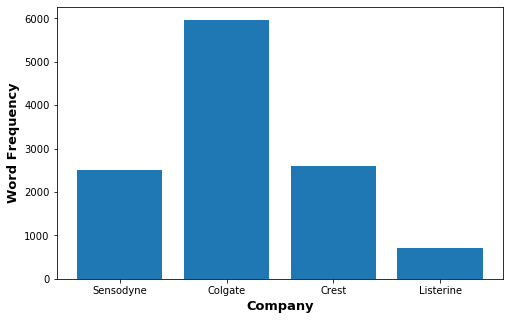

In [70]:
plt.figure(figsize=(8,5))
company = ["Sensodyne","Colgate","Crest",'Listerine']
total_count = [2516,5964,2589,718]
plt.bar(company, total_count) 
plt.xlabel('Company',fontsize = 13,fontweight='bold') 

plt.ylabel('Word Frequency',fontsize = 13,fontweight='bold') 

plt.show() 


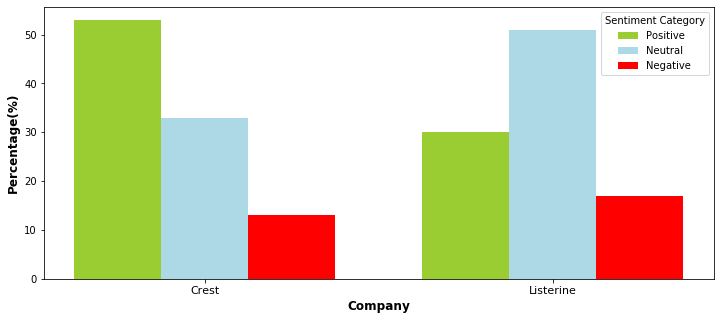

In [61]:
import numpy
company = ['Crest','Listerine']
bar_width = 0.25
positive = [positive_sentiment_crest,positive_sentiment_Listerine]
negative = [negative_sentiment_crest,negative_sentiment_Listerine]
neutral = [neutral_sentiment_crest,neutral_sentiment_Listerine]


x = numpy.arange(len(positive))
plt.figure(figsize=(12,5))

plt.bar(x,positive,color = 'yellowgreen',width = bar_width ,label = 'Positive')
plt.bar(x + bar_width, neutral,color = 'lightblue',width = bar_width,label = 'Neutral')
plt.bar(x + bar_width*2,negative,color = 'red',width = bar_width,label = 'Negative')

plt.xticks(x+ bar_width,company,fontsize= 11)
plt.xlabel('Company',fontsize = 12,fontweight = 'bold')
plt.ylabel('Percentage(%)',fontsize = 12,fontweight = 'bold')
plt.legend( title="Sentiment Category")

plt.show()


In [19]:
from textblob import TextBlob 

subjective_sentence = []

for comment in comment_so_sw_sensodyne_en:
    sentence = str(comment)
    analysis = TextBlob(sentence)
    subjectivity = analysis.sentiment.subjectivity
    
    if subjectivity >= 1:
        subjective_sentence.append(comment)
        total_comment += 1
        

In [20]:
subjective_sentence

["['wow', 'women', 'commericals', 'keep', 'getting', 'cuter']",
 "['awesome', 'thank']",
 "['wtf']",
 "['dog', '14', '3', '4', 'oz', 'tube', 'insane']",
 "['cute', 'lady']",
 "['oh', 'cute', 'girl', 'girl', 'eeww']",
 "['supposed', 'arousing', 'filthy', 'mind']",
 "['worst', 'ad', 'ever', 'created']",
 "['sensodyne', 'work', 'whatsoever', 'sorry']",
 "['arabianpanda4', 'funny']",
 "['lining', 'bald', 'spot', 'nasty']",
 "['ad', 'hilarious', 'mute', 'popsicle', 'look', 'like', 'frozen', 'jizz', 'stick']",
 "['sensodyne', 'make', 'inconvenient', 'toothpaste', 'add', 'flip', 'cap']",
 "['sensodyne', 'reports', 'reaction', 'product', 'lips', 'feel', 'numb', 'swollen', 'need', 'warning', 'lable', 'product']",
 "['sad', 'never', 'delivered']",
 "['unfortunately', 'nothing', 'got', 'delivered']",
 "['happy', 'national', 'ice', 'cream', 'day']",
 "['happy', 'icecream', 'day', 'thank', 'swag']",
 "['sadly']",
 "['obsessed', 'w', 'sensodynsiez', 'sensodyneforicecream']",
 "['wtf', 'want', 'give'

In [30]:
#sentiment analysis for subjective tweets of sensodyne
from textblob import TextBlob

positive = 0
negative = 0
neutral = 0
count = 0
for comments in subjective_sentence:

    sentence = str(comments)
    analysis = TextBlob(sentence)
    polarity = analysis.sentiment.polarity
    count += 1
    if polarity > 0:
        positive = positive + 1
        
    elif polarity < 0:
        negative = negative + 1
    
    else:
        neutral = neutral + 1


def pertentage_calculation(total_comment,sentiment_score):
    return 100*float(sentiment_score)/float(total_comment)


positive_sentiment = pertentage_calculation(count,positive)
negative_sentiment = pertentage_calculation(count,negative)
neutral_sentiment = pertentage_calculation(count,neutral)

positive_sentiment_sensodyne = int(positive_sentiment)
negative_sentiment_sensodyne = int(negative_sentiment)
neutral_sentiment_sensodyne = int(neutral_sentiment)


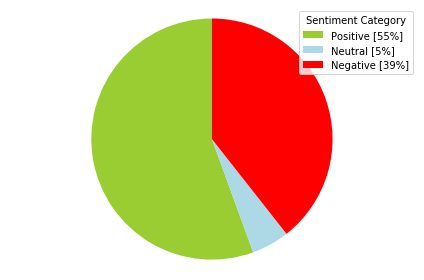

In [34]:
labels = ['Positive ['+str(positive_sentiment_sensodyne)+'%]','Neutral ['+str(neutral_sentiment_sensodyne)+'%]','Negative ['+str(negative_sentiment_sensodyne)+'%]']

size =[positive_sentiment_sensodyne,neutral_sentiment_sensodyne,negative_sentiment_sensodyne]

colors = ['yellowgreen','lightblue','red']
patches,texts = plt.pie(size,colors = colors,startangle = 90)
plt.legend(patches,labels,loc = "upper right",title="Sentiment Category")
plt.axis('equal')
plt.tight_layout()
plt.show()

In [197]:
words_no_sw = list(itertools.chain(*comments_no_sw_colgate))

In [217]:
from nltk import ngrams, FreqDist
dist_ngrams = FreqDist(ngrams(words_no_sw, 6))

In [218]:
sorted_dist_ngrams = sorted(dist_ngrams.items(), key=itemgetter(1), reverse=True)

# Finding Frequent Topic()

In [240]:
count = 0
for value in sorted_dist_ngrams:
    count +=1
    if not value[1] == 29:
        print(value)
    if(count == 11):
        break

(('colgate', 'colgatelatam', 'cp', 'news', 'colgate', 'colgatelatam'), 11)
(('cp', 'news', 'colgate', 'colgatelatam', 'cp', 'news'), 8)
(('news', 'colgate', 'colgatelatam', 'cp', 'news', 'colgate'), 8)
(('colgate', 'teethpaste', 'know', 'colgate', 'teethpaste', 'know'), 7)
(('colgatelatam', 'cp', 'news', 'colgate', 'colgatelatam', 'cp'), 7)
(('control', 'made', 'feel', 'like', 'piece', 'shit'), 5)
(('teethpaste', 'know', 'colgate', 'teethpaste', 'know', 'colgate'), 5)
(('bother', 'actually', 'respond', 'still', 'waiting', 'two'), 5)
(('actually', 'respond', 'still', 'waiting', 'two', 'weeks'), 5)
(('respond', 'still', 'waiting', 'two', 'weeks', 'later'), 5)


In [259]:
freq_topic_cm_rt =[]

count = 0
freq_t1 = ['cp','news','colgate','colgatelatam']
freq_t2 = ['actually','respond','still','waiting']
freq_t3 = ['feel','like','piece','shit']
print("Printing all tweets of first frequent topic:")
print()
counts = 0
for tweet in comment_so_sw_colgate_en:
    count = 0
    for word in freq_t1:
        if word in tweet:
            count += 1
            if count == 4:
                counts += 1
                print(tweet)
                freq_topic_cm_rt.append(tweet)

print("------------------------------------------------------------------------------")
print()
print("Printing all tweets of 2nd frequent topic:")

for tweet in comment_so_sw_colgate_en:
    count = 0
    for word in freq_t2:
        if word in tweet:
            count += 1
            if count == 4:
                counts += 1
                print(tweet)
                freq_topic_cm_rt.append(tweet)


print("------------------------------------------------------------------------------")
print()
print("Printing all tweets of 3rd frequent topic:")

for tweet in comment_so_sw_colgate_en:
    count = 0
    for word in freq_t3:
        if word in tweet:
            count += 1
            if count == 4:
                counts += 1
                print(tweet)
                freq_topic_cm_rt.append(tweet)
                


Printing all tweets of first frequent topic:

['colgate', 'colgatelatam', 'cp', 'news',' por ',' qu ',' discontinued ',' el ',' ajax ',' color ',' turquoise ',' I think ',' that ',' is', 'ste']
['colgate', 'colgatelatam', 'cp', 'news']
['colgate', 'colgatelatam', 'this',' les', 'happen', 'the', 'business',' that ',' be ',' associate ',' with ',' the ',' dictatorship ',' ortega ',' murillo ',' now ',' let's go ',' for ',' all ',' the ',' products', 'palmolive', 'any', 'other', 'that' , 'sea', 'distributed', 'by', 'cp', 'news', 'sosnicaragua']
['colgate', 'cp', 'news', 'colgatelatam', 'colgatepalmoli']
['colgate', 'colgatelatam', 'cp', 'news',' asi ',' left ',' their ',' customers', 'with', 'the', 'support', 'that', ' have ',' realized ',' the ',' that ',' support ',' al ',' massacre ',' de ',' ni ']
['colgate', 'colgatelatam', 'cp', 'news',' here ',' la ',' shows', 'de', 'la', 'disastroza', 'campa', 'de', ' advertising ',' you ',' become ',' become ',' in ',' sponsors', 'of', 'crimes','

In [260]:
#sentiment analysis for frequent topics discussed by the user (colgate)
from textblob import TextBlob
positive = 0
negative = 0
neutral = 0
count = 0
for comments in freq_topic_cm_rt:

    sentence = str(comments)
    analysis = TextBlob(sentence)
    polarity = analysis.sentiment.polarity
    count += 1
    if polarity > 0:
        positive = positive + 1
        
    elif polarity < 0:
        negative = negative + 1
    
    else:
        neutral = neutral + 1


def pertentage_calculation(total_comment,sentiment_score):
    return 100*float(sentiment_score)/float(total_comment)


positive_sentiment = pertentage_calculation(counts,positive)
negative_sentiment = pertentage_calculation(counts,negative)
neutral_sentiment = pertentage_calculation(counts,neutral)

positive_sentiment_freq = int(positive_sentiment)
negative_sentiment_freq = int(negative_sentiment)
neutral_sentiment_freq = int(neutral_sentiment)


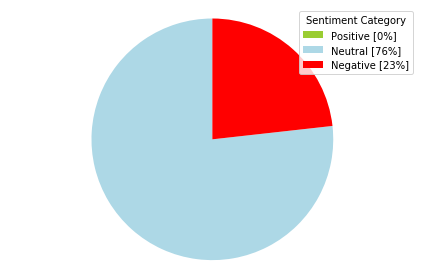

In [261]:
labels = ['Positive ['+str(positive_sentiment_freq)+'%]','Neutral ['+str(neutral_sentiment_freq)+'%]','Negative ['+str(negative_sentiment_freq)+'%]']

size =[positive_sentiment_freq,neutral_sentiment_freq,negative_sentiment_freq]

colors = ['yellowgreen','lightblue','red']
patches,texts = plt.pie(size,colors = colors,startangle = 90)
plt.legend(patches,labels,loc = "upper right",title="Sentiment Category")
plt.axis('equal')
plt.tight_layout()
plt.show()

# Extra (in target company which product is the popular and what is the user sentiment towards the product )

In [99]:
products = [['rapid','relief'],['repair','protect'],['complete','protection'],['fresh','mint'],['true','white']]
words_no_sw = list(itertools.chain(*comments_no_sw))

from nltk import ngrams, FreqDist
dist_ngrams = FreqDist(ngrams(words_no_sw, 2))

sorted_dist_ngrams = sorted(dist_ngrams.items(), key=itemgetter(1), reverse=True)

print(sorted_dist_ngrams)



[(('sensetherelief', 'gotitfree'), 1219), (('sensodyne', 'sensetherelief'), 607), (('rapid', 'relief'), 477), (('gotitfree', 'sensodyne'), 455), (('sensodyne', 'rapid'), 392), (('ice', 'cream'), 253), (('tooth', 'sensitivity'), 220), (('3', 'days'), 203), (('sensodyneforicecream', 'sensodyneforicecream'), 188), (('sensitive', 'teeth'), 176), (('sensodyne', 'sensodyneforicecream'), 151), (('sensodyne', 'walmart'), 141), (('sensodyne', 'target'), 131), (('walmart', 'sensetherelief'), 127), (('target', 'sensetherelief'), 121), (('sensodyneforicecream', 'sensodyne'), 120), (('relief', 'toothpaste'), 108), (('three', 'days'), 105), (('sensodyne', 'kroger'), 94), (('sensitivity', 'relief'), 88), (('kroger', 'sensetherelief'), 88), (('twice', 'daily'), 84), (('new', 'sensodyne'), 83), (('daily', 'brushing'), 82), (('relief', 'sensodyne'), 75), (('days', 'twice'), 74), (('try', 'sensodyne'), 72), (('gotitfree', 'love'), 64), (('twice', 'day'), 62), (('sensodyne', 'sensodyne'), 57), (('experien

# Finding The most popular product

In [107]:
product1 = 0
product2 = 0
product3 = 0
product4 = 0
product5 = 0

for word,value in dist_ngrams.items():
    x = list(word)
    if x == products[0]:
        product1 = value
    elif x == products[1]:
        product2 = value
    elif x == products[2]:
        product3 = value
    elif x == products[3]:
        product4 = value
    elif x == products[4]:
        product5 = value
        
print(products[0],product1)
print(str(products[1]),product2)
print(str(products[2]),product3)
print(str(products[3]),product4)
print(str(products[4]),product5)

['rapid', 'relief'] 477
['repair', 'protect'] 8
['complete', 'protection'] 0
['fresh', 'mint'] 1
['true', 'white'] 2


In [101]:
freq_topic_cm =[]
product = ['rapid','relief']
counts = 0
for tweet in comment_so_sw_sensodyne_en:
    count = 0
    for word in product:
        if word in tweet:
            count += 1
            if count == 2:
                counts += 1
                print(tweet)
                freq_topic_cm.append(tweet)
                
print(counts)


['sensodyne', 'rapid', 'relief', 'toothpaste', 'people', 'unless', 'want', 'layer', 'sensitive', 'skin', 'gums', 'inside', 'mouth', 'burned', 'recommend', 'product']
['sensodyne', 'bought', 'rapid', 'relief', 'first', 'time', 'supposed', 'beige']
['reviewed', 'rapid', 'relief', 'amazon', 'back', '2014']
['sensodyne', 'tried', 'intensive', 'repair', 'enamel', 'great', 'amount', 'increased', 'sensitivity', 'teeth', 'especially', 'gum', 'line', 'disappointed', 'previously', 'using', 'rapid', 'relief', 'helpmyteethhurt', 'sensitivitysucks', 'lovedrapidrelief']
['guys', 'received', 'higher', 'usual', 'adverse', 'reactions', 'rapid', 'relief', 'products', 'asked', 'severe', 'reaction', 'reading', 'amazon', 'reviews', 'looks', 'like', 'alone', 'recommend', 'antidote', 'suffering', 'reaction']
['three', 'days', 'rapid', 'relief', 'good', 'making', 'toothpaste', 'delivering', 'pizza', 'suppose']
['use', 'something', 'natural', 'stop', 'injecting', 'many', 'artificial', 'chemicals', 'body', 'try

# Sentiment analsis of Most famous product(Rapid Relief)

In [102]:
#sentiment analysis for sensodyne rapid relief
from textblob import TextBlob
positive = 0
negative = 0
neutral = 0
count = 0
for comments in freq_topic_cm:

    sentence = str(comments)
    analysis = TextBlob(sentence)
    polarity = analysis.sentiment.polarity
    count += 1
    if polarity > 0:
        positive = positive + 1
        
    elif polarity < 0:
        negative = negative + 1
    
    else:
        neutral = neutral + 1


def pertentage_calculation(total_comment,sentiment_score):
    return 100*float(sentiment_score)/float(total_comment)


positive_sentiment = pertentage_calculation(counts,positive)
negative_sentiment = pertentage_calculation(counts,negative)
neutral_sentiment = pertentage_calculation(counts,neutral)

positive_sentiment_freq_s = int(positive_sentiment)
negative_sentiment_freq_s = int(negative_sentiment)
neutral_sentiment_freq_s = int(neutral_sentiment)


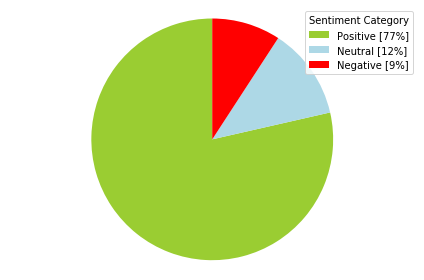

In [103]:
labels = ['Positive ['+str(positive_sentiment_freq_s)+'%]','Neutral ['+str(neutral_sentiment_freq_s)+'%]','Negative ['+str(negative_sentiment_freq_s)+'%]']

size =[positive_sentiment_freq_s,neutral_sentiment_freq_s,negative_sentiment_freq_s]

colors = ['yellowgreen','lightblue','red']
patches,texts = plt.pie(size,colors = colors,startangle = 90)
plt.legend(patches,labels,loc = "upper right",title="Sentiment Category")
plt.axis('equal')
plt.tight_layout()
plt.show()